# ***1. DATA COLLECTION AND PREPROCESSING***

##**1.1.Stock data**

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.signal import argrelextrema
import numpy as np
import pandas as pd
import yfinance as yf
from scipy.stats import pearsonr
import seaborn as sns
from scipy import stats
from scipy.stats import jarque_bera, normaltest, gaussian_kde
from statsmodels.stats.diagnostic import het_arch
from statsmodels.tsa.stattools import acf
import warnings
from IPython.display import display, HTML
warnings.filterwarnings('ignore')

In [ ]:
# lấy stock historical data của VCB.VN từ yfinance với khoảng thời gian từ ngày 21 tháng 7 năm 2023 đến 20 tháng 5 năm 2025

# Lấy dữ liệu VCB
def get_vcb_data():
    """Lấy dữ liệu VCB từ yfinance"""
    stock_ticker = 'VCB.VN'
    start_date = '2023-07-20'
    end_date = '2025-05-20'

    print("Đang tải dữ liệu VCB...")
    vcb_data = yf.download(stock_ticker, start=start_date, end=end_date, auto_adjust=False)

    # Xử lý MultiIndex columns
    if isinstance(vcb_data.columns, pd.MultiIndex):
        vcb_data.columns = ['_'.join(col).strip() for col in vcb_data.columns.values]

    vcb_data.columns = vcb_data.columns.str.replace('_VCB.VN', '', regex=False)
    vcb_data['company_name'] = 'Vietcombank'

    return vcb_data

# 1. Kiểm tra Missing Values
def check_missing_values(df):
    """Kiểm tra giá trị thiếu trong dữ liệu"""
    print("="*50)
    print("1. KIỂM TRA MISSING VALUES")
    print("="*50)

    missing_count = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100

    missing_df = pd.DataFrame({
        'Cột': missing_count.index,
        'Số lượng missing': missing_count.values,
        'Phần trăm missing': missing_percent.values
    })

    print(missing_df)

    # Kiểm tra missing values theo thời gian
    df_reset = df.reset_index()
    missing_dates = df_reset[df_reset.isnull().any(axis=1)]['Date']

    if len(missing_dates) > 0:
        print(f"\nCác ngày có missing values:")
        for date in missing_dates:
            print(f"  - {date.strftime('%Y-%m-%d')}")
    else:
        print("\n✓ Không có missing values")

    return missing_df

# 2. Kiểm tra Outliers
def check_outliers(df):
    """Kiểm tra outliers trong dữ liệu"""
    print("\n" + "="*50)
    print("2. KIỂM TRA OUTLIERS")
    print("="*50)

    # Các cột số cần kiểm tra
    numeric_cols = ['Open', 'High', 'Low', 'Close', 'Volume']

    outliers_summary = []

    for col in numeric_cols:
        if col in df.columns:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            outliers_count = len(outliers)
            outliers_percent = (outliers_count / len(df)) * 100

            outliers_summary.append({
                'Cột': col,
                'Q1': round(Q1, 2),
                'Q3': round(Q3, 2),
                'IQR': round(IQR, 2),
                'Lower_bound': round(lower_bound, 2),
                'Upper_bound': round(upper_bound, 2),
                'Số outliers': outliers_count,
                'Phần trăm outliers': round(outliers_percent, 2)
            })

            if outliers_count > 0:
                print(f"\n{col}:")
                print(f"  - Ngưỡng dưới: {lower_bound:.2f}")
                print(f"  - Ngưỡng trên: {upper_bound:.2f}")
                print(f"  - Số outliers: {outliers_count} ({outliers_percent:.2f}%)")

                # Hiển thị một vài outliers
                if outliers_count <= 5:
                    print(f"  - Ngày có outliers:")
                    for idx in outliers.index:
                        print(f"    {idx.strftime('%Y-%m-%d')}: {df.loc[idx, col]:.2f}")

    return pd.DataFrame(outliers_summary)

# 3. Kiểm tra Stock Splits/Dividends
def check_splits_dividends(df):
    """Kiểm tra stock splits và dividends"""
    print("\n" + "="*50)
    print("3. KIỂM TRA STOCK SPLITS/DIVIDENDS")
    print("="*50)

    # Tính tỷ lệ thay đổi giá theo ngày
    df_copy = df.copy()
    df_copy['Price_Change'] = df_copy['Close'].pct_change()
    df_copy['Volume_Change'] = df_copy['Volume'].pct_change()

    # Kiểm tra thay đổi giá bất thường (có thể là stock split)
    unusual_price_changes = df_copy[abs(df_copy['Price_Change']) > 0.2]  # Thay đổi > 20%

    print(f"Số ngày có thay đổi giá > 20%: {len(unusual_price_changes)}")

    if len(unusual_price_changes) > 0:
        print("\nCác ngày có thay đổi giá bất thường:")
        for idx in unusual_price_changes.index:
            change = unusual_price_changes.loc[idx, 'Price_Change'] * 100
            close_price = df_copy.loc[idx, 'Close']
            volume = df_copy.loc[idx, 'Volume']
            print(f"  - {idx.strftime('%Y-%m-%d')}: {change:+.2f}%, Giá: {close_price:.0f}, Volume: {volume:,.0f}")

    # Kiểm tra ratio giữa High-Low và Close
    df_copy['HL_Close_Ratio'] = (df_copy['High'] - df_copy['Low']) / df_copy['Close']
    unusual_ratios = df_copy[df_copy['HL_Close_Ratio'] > 0.1]  # Biến động trong ngày > 10%

    print(f"\nSố ngày có biến động trong ngày > 10%: {len(unusual_ratios)}")

    return unusual_price_changes, unusual_ratios

# 4. Kiểm tra Trading Holidays
def check_trading_holidays(df):
    """Kiểm tra các ngày nghỉ giao dịch"""
    print("\n" + "="*50)
    print("4. KIỂM TRA TRADING HOLIDAYS")
    print("="*50)

    # Tạo full date range
    start_date = df.index.min()
    end_date = df.index.max()
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')

    # Loại bỏ thứ 7 và chủ nhật
    weekdays = full_date_range[full_date_range.weekday < 5]  # 0-4 là thứ 2-6

    # Tìm các ngày weekday không có trong dữ liệu
    missing_weekdays = weekdays[~weekdays.isin(df.index)]

    print(f"Tổng số ngày trong khoảng thời gian: {len(full_date_range)}")
    print(f"Số ngày làm việc (thứ 2-6): {len(weekdays)}")
    print(f"Số ngày có dữ liệu giao dịch: {len(df)}")
    print(f"Số ngày nghỉ giao dịch (weekdays): {len(missing_weekdays)}")

    if len(missing_weekdays) > 0:
        print(f"\nCác ngày nghỉ giao dịch (có thể là ngày lễ):")
        for date in missing_weekdays[:20]:  # Hiển thị 20 ngày đầu
            print(f"  - {date.strftime('%Y-%m-%d')} ({date.strftime('%A')})")

        if len(missing_weekdays) > 20:
            print(f"  ... và {len(missing_weekdays) - 20} ngày khác")

    # Kiểm tra volume = 0 (có thể là ngày không giao dịch)
    zero_volume_days = df[df['Volume'] == 0]
    print(f"\nSố ngày có volume = 0: {len(zero_volume_days)}")

    if len(zero_volume_days) > 0:
        print("Các ngày có volume = 0:")
        for idx in zero_volume_days.index[:10]:
            print(f"  - {idx.strftime('%Y-%m-%d')}")

    return missing_weekdays, zero_volume_days

# 5. Tổng hợp và báo cáo
def generate_summary_report(df, missing_df, outliers_df, unusual_changes, missing_weekdays):
    """Tạo báo cáo tổng hợp"""
    print("\n" + "="*60)
    print("TÓM TẮT CHẤT LƯỢNG DỮ LIỆU VCB")
    print("="*60)

    print(f"📊 Thông tin cơ bản:")
    print(f"  - Khoảng thời gian: {df.index.min().strftime('%Y-%m-%d')} đến {df.index.max().strftime('%Y-%m-%d')}")
    print(f"  - Tổng số ngày giao dịch: {len(df):,}")
    print(f"  - Số cột dữ liệu: {len(df.columns)}")

    print(f"\n🔍 Chất lượng dữ liệu:")

    # Missing values
    total_missing = missing_df['Số lượng missing'].sum()
    if total_missing == 0:
        print(f"  ✅ Missing values: Không có")
    else:
        print(f"  ⚠️  Missing values: {total_missing} giá trị")

    # Outliers
    total_outliers = outliers_df['Số outliers'].sum()
    if total_outliers == 0:
        print(f"  ✅ Outliers: Không phát hiện")
    else:
        print(f"  ⚠️  Outliers: {total_outliers} giá trị bất thường")

    # Unusual price changes
    if len(unusual_changes) == 0:
        print(f"  ✅ Biến động giá: Bình thường")
    else:
        print(f"  ⚠️  Biến động giá: {len(unusual_changes)} ngày có thay đổi > 20%")

    # Trading holidays
    print(f"  📅 Ngày nghỉ giao dịch: {len(missing_weekdays)} ngày")

    print(f"\n💡 Khuyến nghị:")
    recommendations = []

    if total_missing > 0:
        recommendations.append("- Xử lý missing values bằng interpolation hoặc forward fill")

    if total_outliers > 0:
        recommendations.append("- Kiểm tra và xác minh các outliers")

    if len(unusual_changes) > 0:
        recommendations.append("- Xác minh các ngày có biến động giá bất thường")

    if len(recommendations) == 0:
        recommendations.append("- Dữ liệu có chất lượng tốt, có thể sử dụng cho phân tích")

    for rec in recommendations:
        print(f"  {rec}")

# Main function
def main():
    """Hàm chính thực hiện kiểm tra chất lượng dữ liệu"""
    print("🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VCB")
    print("="*60)

    # Lấy dữ liệu
    vcb_data = get_vcb_data()

    # Thực hiện các kiểm tra
    missing_df = check_missing_values(vcb_data)
    outliers_df = check_outliers(vcb_data)
    unusual_changes, unusual_ratios = check_splits_dividends(vcb_data)
    missing_weekdays, zero_volume_days = check_trading_holidays(vcb_data)

    # Tạo báo cáo tổng hợp
    generate_summary_report(vcb_data, missing_df, outliers_df, unusual_changes, missing_weekdays)

    # Lưu kết quả
    vcb_data.to_csv('vcb_stock_data_checked.csv', index=True)
    print(f"\n💾 Dữ liệu đã được lưu vào file: vcb_stock_data_checked.csv")

    return vcb_data, missing_df, outliers_df, unusual_changes

if __name__ == "__main__":
    vcb_data, missing_df, outliers_df, unusual_changes = main()


🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VCB
Đang tải dữ liệu VCB...


[*********************100%***********************]  1 of 1 completed

1. KIỂM TRA MISSING VALUES
            Cột  Số lượng missing  Phần trăm missing
0     Adj Close                 0                0.0
1         Close                 0                0.0
2          High                 0                0.0
3           Low                 0                0.0
4          Open                 0                0.0
5        Volume                 0                0.0
6  company_name                 0                0.0

✓ Không có missing values

2. KIỂM TRA OUTLIERS

Open:
  - Ngưỡng dưới: 53704.01
  - Ngưỡng trên: 66747.49
  - Số outliers: 5 (1.10%)
  - Ngày có outliers:
    2025-03-13: 67200.00
    2025-03-18: 67800.00
    2025-03-19: 67200.00
    2025-03-21: 67000.00
    2025-04-09: 52000.00

High:
  - Ngưỡng dưới: 54556.85
  - Ngưỡng trên: 66797.66
  - Số outliers: 13 (2.86%)

Low:
  - Ngưỡng dưới: 53076.92
  - Ngưỡng trên: 66588.63
  - Số outliers: 2 (0.44%)
  - Ngày có outliers:
    2025-03-18: 66800.00
    2025-04-09: 52000.00

Close:
  - Ngưỡng dưới

In [ ]:
display(vcb_data.head())


,Adj Close,Close,High,Low,Open,Volume,company_name
Date,,,,,,,
2023-07-20,59470.035156,59470.035156,60262.972656,58677.101562,59753.226562,1553025,Vietcombank
2023-07-21,59470.035156,59470.035156,59470.035156,58903.656250,59470.035156,3219433,Vietcombank
2023-07-24,59243.484375,59243.484375,59696.589844,59186.847656,59526.675781,1613261,Vietcombank
2023-07-25,61337.792969,61337.792969,61872.910156,60401.335938,60468.226562,3849337,Vietcombank
2023-07-26,62474.917969,62474.917969,62474.917969,61471.570312,61471.570312,2597439,Vietcombank


- Tương tự lấy thêm dataset của Hoà Phát Group, VIC, BID

In [ ]:
# HPG

# Lấy dữ liệu HPG
def get_hpg_data():
    """Lấy dữ liệu HPG từ yfinance"""
    stock_ticker = 'HPG.VN'
    start_date = '2023-07-20'
    end_date = '2025-05-20'

    print("Đang tải dữ liệu HPG...")
    hpg_data = yf.download(stock_ticker, start=start_date, end=end_date, auto_adjust=False)

    # Xử lý MultiIndex columns
    if isinstance(hpg_data.columns, pd.MultiIndex):
        hpg_data.columns = ['_'.join(col).strip() for col in hpg_data.columns.values]

    hpg_data.columns = hpg_data.columns.str.replace('_HPG.VN', '', regex=False)
    hpg_data['company_name'] = 'Hoa Phát Group'

    return hpg_data

# 1. Kiểm tra Missing Values
def check_missing_values(df):
    """Kiểm tra giá trị thiếu trong dữ liệu"""
    print("="*50)
    print("1. KIỂM TRA MISSING VALUES")
    print("="*50)

    missing_count = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100

    missing_df = pd.DataFrame({
        'Cột': missing_count.index,
        'Số lượng missing': missing_count.values,
        'Phần trăm missing': missing_percent.values
    })

    print(missing_df)

    # Kiểm tra missing values theo thời gian
    df_reset = df.reset_index()
    missing_dates = df_reset[df_reset.isnull().any(axis=1)]['Date']

    if len(missing_dates) > 0:
        print(f"\nCác ngày có missing values:")
        for date in missing_dates:
            print(f"  - {date.strftime('%Y-%m-%d')}")
    else:
        print("\n✓ Không có missing values")

    return missing_df

# 2. Kiểm tra Outliers
def check_outliers(df):
    """Kiểm tra outliers trong dữ liệu"""
    print("\n" + "="*50)
    print("2. KIỂM TRA OUTLIERS")
    print("="*50)

    # Các cột số cần kiểm tra
    numeric_cols = ['Open', 'High', 'Low', 'Close', 'Volume']

    outliers_summary = []

    for col in numeric_cols:
        if col in df.columns:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            outliers_count = len(outliers)
            outliers_percent = (outliers_count / len(df)) * 100

            outliers_summary.append({
                'Cột': col,
                'Q1': round(Q1, 2),
                'Q3': round(Q3, 2),
                'IQR': round(IQR, 2),
                'Lower_bound': round(lower_bound, 2),
                'Upper_bound': round(upper_bound, 2),
                'Số outliers': outliers_count,
                'Phần trăm outliers': round(outliers_percent, 2)
            })

            if outliers_count > 0:
                print(f"\n{col}:")
                print(f"  - Ngưỡng dưới: {lower_bound:.2f}")
                print(f"  - Ngưỡng trên: {upper_bound:.2f}")
                print(f"  - Số outliers: {outliers_count} ({outliers_percent:.2f}%)")

                # Hiển thị một vài outliers
                if outliers_count <= 10:
                    print(f"  - Ngày có outliers:")
                    for idx in outliers.index:
                        print(f"    {idx.strftime('%Y-%m-%d')}: {df.loc[idx, col]:.2f}")

    return pd.DataFrame(outliers_summary)

# 3. Kiểm tra Stock Splits/Dividends
def check_splits_dividends(df):
    """Kiểm tra stock splits và dividends"""
    print("\n" + "="*50)
    print("3. KIỂM TRA STOCK SPLITS/DIVIDENDS")
    print("="*50)

    # Tính tỷ lệ thay đổi giá theo ngày
    df_copy = df.copy()
    df_copy['Price_Change'] = df_copy['Close'].pct_change()
    df_copy['Volume_Change'] = df_copy['Volume'].pct_change()

    # Kiểm tra thay đổi giá bất thường (có thể là stock split)
    unusual_price_changes = df_copy[abs(df_copy['Price_Change']) > 0.2]  # Thay đổi > 20%

    print(f"Số ngày có thay đổi giá > 20%: {len(unusual_price_changes)}")

    if len(unusual_price_changes) > 0:
        print("\nCác ngày có thay đổi giá bất thường:")
        for idx in unusual_price_changes.index:
            change = unusual_price_changes.loc[idx, 'Price_Change'] * 100
            close_price = df_copy.loc[idx, 'Close']
            volume = df_copy.loc[idx, 'Volume']
            print(f"  - {idx.strftime('%Y-%m-%d')}: {change:+.2f}%, Giá: {close_price:.0f}, Volume: {volume:,.0f}")

    # Kiểm tra ratio giữa High-Low và Close
    df_copy['HL_Close_Ratio'] = (df_copy['High'] - df_copy['Low']) / df_copy['Close']
    unusual_ratios = df_copy[df_copy['HL_Close_Ratio'] > 0.1]  # Biến động trong ngày > 10%

    print(f"\nSố ngày có biến động trong ngày > 10%: {len(unusual_ratios)}")

    return unusual_price_changes, unusual_ratios

# 4. Kiểm tra Trading Holidays
def check_trading_holidays(df):
    """Kiểm tra các ngày nghỉ giao dịch"""
    print("\n" + "="*50)
    print("4. KIỂM TRA TRADING HOLIDAYS")
    print("="*50)

    # Tạo full date range
    start_date = df.index.min()
    end_date = df.index.max()
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')

    # Loại bỏ thứ 7 và chủ nhật
    weekdays = full_date_range[full_date_range.weekday < 5]  # 0-4 là thứ 2-6

    # Tìm các ngày weekday không có trong dữ liệu
    missing_weekdays = weekdays[~weekdays.isin(df.index)]

    print(f"Tổng số ngày trong khoảng thời gian: {len(full_date_range)}")
    print(f"Số ngày làm việc (thứ 2-6): {len(weekdays)}")
    print(f"Số ngày có dữ liệu giao dịch: {len(df)}")
    print(f"Số ngày nghỉ giao dịch (weekdays): {len(missing_weekdays)}")

    if len(missing_weekdays) > 0:
        print(f"\nCác ngày nghỉ giao dịch (có thể là ngày lễ):")
        for date in missing_weekdays[:20]:  # Hiển thị 20 ngày đầu
            print(f"  - {date.strftime('%Y-%m-%d')} ({date.strftime('%A')})")

        if len(missing_weekdays) > 20:
            print(f"  ... và {len(missing_weekdays) - 20} ngày khác")

    # Kiểm tra volume = 0 (có thể là ngày không giao dịch)
    zero_volume_days = df[df['Volume'] == 0]
    print(f"\nSố ngày có volume = 0: {len(zero_volume_days)}")

    if len(zero_volume_days) > 0:
        print("Các ngày có volume = 0:")
        for idx in zero_volume_days.index[:10]:
            print(f"  - {idx.strftime('%Y-%m-%d')}")

    return missing_weekdays, zero_volume_days

# 5. Tổng hợp và báo cáo
def generate_summary_report(df, missing_df, outliers_df, unusual_changes, missing_weekdays):
    """Tạo báo cáo tổng hợp"""
    print("\n" + "="*60)
    print("TÓM TẮT CHẤT LƯỢNG DỮ LIỆU HPG")
    print("="*60)

    print(f"📊 Thông tin cơ bản:")
    print(f"  - Khoảng thời gian: {df.index.min().strftime('%Y-%m-%d')} đến {df.index.max().strftime('%Y-%m-%d')}")
    print(f"  - Tổng số ngày giao dịch: {len(df):,}")
    print(f"  - Số cột dữ liệu: {len(df.columns)}")

    print(f"\n🔍 Chất lượng dữ liệu:")

    # Missing values
    total_missing = missing_df['Số lượng missing'].sum()
    if total_missing == 0:
        print(f"  ✅ Missing values: Không có")
    else:
        print(f"  ⚠️  Missing values: {total_missing} giá trị")

    # Outliers
    total_outliers = outliers_df['Số outliers'].sum()
    if total_outliers == 0:
        print(f"  ✅ Outliers: Không phát hiện")
    else:
        print(f"  ⚠️  Outliers: {total_outliers} giá trị bất thường")

    # Unusual price changes
    if len(unusual_changes) == 0:
        print(f"  ✅ Biến động giá: Bình thường")
    else:
        print(f"  ⚠️  Biến động giá: {len(unusual_changes)} ngày có thay đổi > 20%")

    # Trading holidays
    print(f"  📅 Ngày nghỉ giao dịch: {len(missing_weekdays)} ngày")

    print(f"\n💡 Khuyến nghị:")
    recommendations = []

    if total_missing > 0:
        recommendations.append("- Xử lý missing values bằng interpolation hoặc forward fill")

    if total_outliers > 0:
        recommendations.append("- Kiểm tra và xác minh các outliers")

    if len(unusual_changes) > 0:
        recommendations.append("- Xác minh các ngày có biến động giá bất thường")

    if len(recommendations) == 0:
        recommendations.append("- Dữ liệu có chất lượng tốt, có thể sử dụng cho phân tích")

    for rec in recommendations:
        print(f"  {rec}")

# Main function
def main():
    """Hàm chính thực hiện kiểm tra chất lượng dữ liệu"""
    print("🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN HPG")
    print("="*60)

    # Lấy dữ liệu
    hpg_data = get_hpg_data()

    # Thực hiện các kiểm tra
    missing_df = check_missing_values(hpg_data)
    outliers_df = check_outliers(hpg_data)
    unusual_changes, unusual_ratios = check_splits_dividends(hpg_data)
    missing_weekdays, zero_volume_days = check_trading_holidays(hpg_data)

    # Tạo báo cáo tổng hợp
    generate_summary_report(hpg_data, missing_df, outliers_df, unusual_changes, missing_weekdays)

    # Lưu kết quả
    hpg_data.to_csv('hpg_stock_data_checked.csv', index=True)
    print(f"\n💾 Dữ liệu đã được lưu vào file: hpg_stock_data_checked.csv")

    return hpg_data, missing_df, outliers_df, unusual_changes

if __name__ == "__main__":
    hpg_data, missing_df, outliers_df, unusual_changes = main()


🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN HPG
Đang tải dữ liệu HPG...


[*********************100%***********************]  1 of 1 completed

1. KIỂM TRA MISSING VALUES
            Cột  Số lượng missing  Phần trăm missing
0     Adj Close                 0                0.0
1         Close                 0                0.0
2          High                 0                0.0
3           Low                 0                0.0
4          Open                 0                0.0
5        Volume                 0                0.0
6  company_name                 0                0.0

✓ Không có missing values

2. KIỂM TRA OUTLIERS

Open:
  - Ngưỡng dưới: 22128.41
  - Ngưỡng trên: 30482.96
  - Số outliers: 11 (2.44%)

High:
  - Ngưỡng dưới: 22295.46
  - Ngưỡng trên: 30840.91
  - Số outliers: 9 (2.00%)
  - Ngày có outliers:
    2023-10-19: 22000.00
    2023-10-20: 22136.36
    2023-10-23: 22136.36
    2023-10-24: 22181.82
    2023-10-26: 21681.82
    2023-10-27: 21363.64
    2023-10-30: 21590.91
    2023-10-31: 21363.64
    2023-11-01: 21772.73

Low:
  - Ngưỡng dưới: 21850.00
  - Ngưỡng trên: 30250.00
  - Số outliers: 12 (2

In [ ]:
print(hpg_data.head())

               Adj Close         Close          High           Low  \
Date                                                                 
2023-07-20  25636.363281  25636.363281  25636.363281  24818.181641   
2023-07-21  25818.181641  25818.181641  25818.181641  25545.455078   
2023-07-24  25681.818359  25681.818359  26000.000000  25454.544922   
2023-07-25  25681.818359  25681.818359  25772.726562  25454.544922   
2023-07-26  25818.181641  25818.181641  25863.636719  25590.908203   

                    Open    Volume    company_name  
Date                                                
2023-07-20  24818.181641  34204862  Hoa Phát Group  
2023-07-21  25772.726562  20301566  Hoa Phát Group  
2023-07-24  25863.636719  19171811  Hoa Phát Group  
2023-07-25  25681.818359  22247796  Hoa Phát Group  
2023-07-26  25681.818359  25386525  Hoa Phát Group  


In [ ]:
# VIC:

# Lấy dữ liệu VIC
def get_vic_data():
    """Lấy dữ liệu VIC từ yfinance"""
    stock_ticker = 'VIC.VN'
    start_date = '2023-07-20'
    end_date = '2025-05-20'

    print("Đang tải dữ liệu VIC...")
    vic_data = yf.download(stock_ticker, start=start_date, end=end_date, auto_adjust=False)

    # Xử lý MultiIndex columns
    if isinstance(vic_data.columns, pd.MultiIndex):
        vic_data.columns = ['_'.join(col).strip() for col in vic_data.columns.values]

    vic_data.columns = vic_data.columns.str.replace('_VIC.VN', '', regex=False)
    vic_data['company_name'] = 'VinGroup'

    return vic_data

# 1. Kiểm tra Missing Values
def check_missing_values(df):
    """Kiểm tra giá trị thiếu trong dữ liệu"""
    print("="*50)
    print("1. KIỂM TRA MISSING VALUES")
    print("="*50)

    missing_count = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100

    missing_df = pd.DataFrame({
        'Cột': missing_count.index,
        'Số lượng missing': missing_count.values,
        'Phần trăm missing': missing_percent.values
    })

    print(missing_df)

    # Kiểm tra missing values theo thời gian
    df_reset = df.reset_index()
    missing_dates = df_reset[df_reset.isnull().any(axis=1)]['Date']

    if len(missing_dates) > 0:
        print(f"\nCác ngày có missing values:")
        for date in missing_dates:
            print(f"  - {date.strftime('%Y-%m-%d')}")
    else:
        print("\n✓ Không có missing values")

    return missing_df

# 2. Kiểm tra Outliers
def check_outliers(df):
    """Kiểm tra outliers trong dữ liệu"""
    print("\n" + "="*50)
    print("2. KIỂM TRA OUTLIERS")
    print("="*50)

    # Các cột số cần kiểm tra
    numeric_cols = ['Open', 'High', 'Low', 'Close', 'Volume']

    outliers_summary = []

    for col in numeric_cols:
        if col in df.columns:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            outliers_count = len(outliers)
            outliers_percent = (outliers_count / len(df)) * 100

            outliers_summary.append({
                'Cột': col,
                'Q1': round(Q1, 2),
                'Q3': round(Q3, 2),
                'IQR': round(IQR, 2),
                'Lower_bound': round(lower_bound, 2),
                'Upper_bound': round(upper_bound, 2),
                'Số outliers': outliers_count,
                'Phần trăm outliers': round(outliers_percent, 2)
            })

            if outliers_count > 0:
                print(f"\n{col}:")
                print(f"  - Ngưỡng dưới: {lower_bound:.2f}")
                print(f"  - Ngưỡng trên: {upper_bound:.2f}")
                print(f"  - Số outliers: {outliers_count} ({outliers_percent:.2f}%)")

                # Hiển thị một vài outliers
                if outliers_count <= 5:
                    print(f"  - Ngày có outliers:")
                    for idx in outliers.index:
                        print(f"    {idx.strftime('%Y-%m-%d')}: {df.loc[idx, col]:.2f}")

    return pd.DataFrame(outliers_summary)

# 3. Kiểm tra Stock Splits/Dividends
def check_splits_dividends(df):
    """Kiểm tra stock splits và dividends"""
    print("\n" + "="*50)
    print("3. KIỂM TRA STOCK SPLITS/DIVIDENDS")
    print("="*50)

    # Tính tỷ lệ thay đổi giá theo ngày
    df_copy = df.copy()
    df_copy['Price_Change'] = df_copy['Close'].pct_change()
    df_copy['Volume_Change'] = df_copy['Volume'].pct_change()

    # Kiểm tra thay đổi giá bất thường (có thể là stock split)
    unusual_price_changes = df_copy[abs(df_copy['Price_Change']) > 0.2]  # Thay đổi > 20%

    print(f"Số ngày có thay đổi giá > 20%: {len(unusual_price_changes)}")

    if len(unusual_price_changes) > 0:
        print("\nCác ngày có thay đổi giá bất thường:")
        for idx in unusual_price_changes.index:
            change = unusual_price_changes.loc[idx, 'Price_Change'] * 100
            close_price = df_copy.loc[idx, 'Close']
            volume = df_copy.loc[idx, 'Volume']
            print(f"  - {idx.strftime('%Y-%m-%d')}: {change:+.2f}%, Giá: {close_price:.0f}, Volume: {volume:,.0f}")

    # Kiểm tra ratio giữa High-Low và Close
    df_copy['HL_Close_Ratio'] = (df_copy['High'] - df_copy['Low']) / df_copy['Close']
    unusual_ratios = df_copy[df_copy['HL_Close_Ratio'] > 0.1]  # Biến động trong ngày > 10%

    print(f"\nSố ngày có biến động trong ngày > 10%: {len(unusual_ratios)}")

    return unusual_price_changes, unusual_ratios

# 4. Kiểm tra Trading Holidays
def check_trading_holidays(df):
    """Kiểm tra các ngày nghỉ giao dịch"""
    print("\n" + "="*50)
    print("4. KIỂM TRA TRADING HOLIDAYS")
    print("="*50)

    # Tạo full date range
    start_date = df.index.min()
    end_date = df.index.max()
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')

    # Loại bỏ thứ 7 và chủ nhật
    weekdays = full_date_range[full_date_range.weekday < 5]  # 0-4 là thứ 2-6

    # Tìm các ngày weekday không có trong dữ liệu
    missing_weekdays = weekdays[~weekdays.isin(df.index)]

    print(f"Tổng số ngày trong khoảng thời gian: {len(full_date_range)}")
    print(f"Số ngày làm việc (thứ 2-6): {len(weekdays)}")
    print(f"Số ngày có dữ liệu giao dịch: {len(df)}")
    print(f"Số ngày nghỉ giao dịch (weekdays): {len(missing_weekdays)}")

    if len(missing_weekdays) > 0:
        print(f"\nCác ngày nghỉ giao dịch (có thể là ngày lễ):")
        for date in missing_weekdays[:20]:  # Hiển thị 20 ngày đầu
            print(f"  - {date.strftime('%Y-%m-%d')} ({date.strftime('%A')})")

        if len(missing_weekdays) > 20:
            print(f"  ... và {len(missing_weekdays) - 20} ngày khác")

    # Kiểm tra volume = 0 (có thể là ngày không giao dịch)
    zero_volume_days = df[df['Volume'] == 0]
    print(f"\nSố ngày có volume = 0: {len(zero_volume_days)}")

    if len(zero_volume_days) > 0:
        print("Các ngày có volume = 0:")
        for idx in zero_volume_days.index[:10]:
            print(f"  - {idx.strftime('%Y-%m-%d')}")

    return missing_weekdays, zero_volume_days

# 5. Tổng hợp và báo cáo
def generate_summary_report(df, missing_df, outliers_df, unusual_changes, missing_weekdays):
    """Tạo báo cáo tổng hợp"""
    print("\n" + "="*60)
    print("TÓM TẮT CHẤT LƯỢNG DỮ LIỆU VIC")
    print("="*60)

    print(f"📊 Thông tin cơ bản:")
    print(f"  - Khoảng thời gian: {df.index.min().strftime('%Y-%m-%d')} đến {df.index.max().strftime('%Y-%m-%d')}")
    print(f"  - Tổng số ngày giao dịch: {len(df):,}")
    print(f"  - Số cột dữ liệu: {len(df.columns)}")

    print(f"\n🔍 Chất lượng dữ liệu:")

    # Missing values
    total_missing = missing_df['Số lượng missing'].sum()
    if total_missing == 0:
        print(f"  ✅ Missing values: Không có")
    else:
        print(f"  ⚠️  Missing values: {total_missing} giá trị")

    # Outliers
    total_outliers = outliers_df['Số outliers'].sum()
    if total_outliers == 0:
        print(f"  ✅ Outliers: Không phát hiện")
    else:
        print(f"  ⚠️  Outliers: {total_outliers} giá trị bất thường")

    # Unusual price changes
    if len(unusual_changes) == 0:
        print(f"  ✅ Biến động giá: Bình thường")
    else:
        print(f"  ⚠️  Biến động giá: {len(unusual_changes)} ngày có thay đổi > 20%")

    # Trading holidays
    print(f"  📅 Ngày nghỉ giao dịch: {len(missing_weekdays)} ngày")

    print(f"\n💡 Khuyến nghị:")
    recommendations = []

    if total_missing > 0:
        recommendations.append("- Xử lý missing values bằng interpolation hoặc forward fill")

    if total_outliers > 0:
        recommendations.append("- Kiểm tra và xác minh các outliers")

    if len(unusual_changes) > 0:
        recommendations.append("- Xác minh các ngày có biến động giá bất thường")

    if len(recommendations) == 0:
        recommendations.append("- Dữ liệu có chất lượng tốt, có thể sử dụng cho phân tích")

    for rec in recommendations:
        print(f"  {rec}")

# Main function
def main():
    """Hàm chính thực hiện kiểm tra chất lượng dữ liệu"""
    print("🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VIC")
    print("="*60)

    # Lấy dữ liệu
    vic_data = get_vic_data()

    # Thực hiện các kiểm tra
    missing_df = check_missing_values(vic_data)
    outliers_df = check_outliers(vic_data)
    unusual_changes, unusual_ratios = check_splits_dividends(vic_data)
    missing_weekdays, zero_volume_days = check_trading_holidays(vic_data)

    # Tạo báo cáo tổng hợp
    generate_summary_report(vic_data, missing_df, outliers_df, unusual_changes, missing_weekdays)

    # Lưu kết quả
    vic_data.to_csv('vic_stock_data_checked.csv', index=True)
    print(f"\n💾 Dữ liệu đã được lưu vào file: vic_stock_data_checked.csv")

    return vic_data, missing_df, outliers_df, unusual_changes

if __name__ == "__main__":
    vic_data, missing_df, outliers_df, unusual_changes = main()


🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VIC
Đang tải dữ liệu VIC...


[*********************100%***********************]  1 of 1 completed

1. KIỂM TRA MISSING VALUES
            Cột  Số lượng missing  Phần trăm missing
0     Adj Close                 0                0.0
1         Close                 0                0.0
2          High                 0                0.0
3           Low                 0                0.0
4          Open                 0                0.0
5        Volume                 0                0.0
6  company_name                 0                0.0

✓ Không có missing values

2. KIỂM TRA OUTLIERS

Open:
  - Ngưỡng dưới: 33262.50
  - Ngưỡng trên: 54962.50
  - Số outliers: 64 (14.41%)

High:
  - Ngưỡng dưới: 33300.00
  - Ngưỡng trên: 55700.00
  - Số outliers: 67 (15.09%)

Low:
  - Ngưỡng dưới: 33550.00
  - Ngưỡng trên: 53550.00
  - Số outliers: 63 (14.19%)

Close:
  - Ngưỡng dưới: 33212.50
  - Ngưỡng trên: 54912.50
  - Số outliers: 66 (14.86%)

Volume:
  - Ngưỡng dưới: -6377901.75
  - Ngưỡng trên: 16733836.25
  - Số outliers: 36 (8.11%)

3. KIỂM TRA STOCK SPLITS/DIVIDENDS
Số ngày có thay đ

In [ ]:
print(vic_data.head())

            Adj Close    Close     High      Low     Open   Volume  \
Date                                                                 
2023-07-20    52000.0  52000.0  52600.0  51600.0  52100.0  1893807   
2023-07-21    52100.0  52100.0  52300.0  51600.0  52000.0  2324811   
2023-07-24    52000.0  52000.0  52600.0  51800.0  52200.0  2611616   
2023-07-26    51000.0  51000.0  51900.0  51000.0  51400.0  4119713   
2023-07-28    51500.0  51500.0  51600.0  50900.0  51100.0  3550220   

           company_name  
Date                     
2023-07-20     VinGroup  
2023-07-21     VinGroup  
2023-07-24     VinGroup  
2023-07-26     VinGroup  
2023-07-28     VinGroup  


In [ ]:
# BIDV:

def get_bid_data():
    """Lấy dữ liệu VIC từ yfinance"""
    stock_ticker = 'BID.VN'
    start_date = '2023-07-20'
    end_date = '2025-05-20'

    print("Đang tải dữ liệu BIDV...")
    bid_data = yf.download(stock_ticker, start=start_date, end=end_date, auto_adjust=False)

    # Xử lý MultiIndex columns
    if isinstance(bid_data.columns, pd.MultiIndex):
        bid_data.columns = ['_'.join(col).strip() for col in bid_data.columns.values]

    bid_data.columns = bid_data.columns.str.replace('_BID.VN', '', regex=False)
    bid_data['company_name'] = 'BIDV'

    return bid_data

# 1. Kiểm tra Missing Values
def check_missing_values(df):
    """Kiểm tra giá trị thiếu trong dữ liệu"""
    print("="*50)
    print("1. KIỂM TRA MISSING VALUES")
    print("="*50)

    missing_count = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100

    missing_df = pd.DataFrame({
        'Cột': missing_count.index,
        'Số lượng missing': missing_count.values,
        'Phần trăm missing': missing_percent.values
    })

    print(missing_df)

    # Kiểm tra missing values theo thời gian
    df_reset = df.reset_index()
    missing_dates = df_reset[df_reset.isnull().any(axis=1)]['Date']

    if len(missing_dates) > 0:
        print(f"\nCác ngày có missing values:")
        for date in missing_dates:
            print(f"  - {date.strftime('%Y-%m-%d')}")
    else:
        print("\n✓ Không có missing values")

    return missing_df

# 2. Kiểm tra Outliers
def check_outliers(df):
    """Kiểm tra outliers trong dữ liệu"""
    print("\n" + "="*50)
    print("2. KIỂM TRA OUTLIERS")
    print("="*50)

    # Các cột số cần kiểm tra
    numeric_cols = ['Open', 'High', 'Low', 'Close', 'Volume']

    outliers_summary = []

    for col in numeric_cols:
        if col in df.columns:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            outliers_count = len(outliers)
            outliers_percent = (outliers_count / len(df)) * 100

            outliers_summary.append({
                'Cột': col,
                'Q1': round(Q1, 2),
                'Q3': round(Q3, 2),
                'IQR': round(IQR, 2),
                'Lower_bound': round(lower_bound, 2),
                'Upper_bound': round(upper_bound, 2),
                'Số outliers': outliers_count,
                'Phần trăm outliers': round(outliers_percent, 2)
            })

            if outliers_count > 0:
                print(f"\n{col}:")
                print(f"  - Ngưỡng dưới: {lower_bound:.2f}")
                print(f"  - Ngưỡng trên: {upper_bound:.2f}")
                print(f"  - Số outliers: {outliers_count} ({outliers_percent:.2f}%)")

                # Hiển thị một vài outliers
                if outliers_count <= 5:
                    print(f"  - Ngày có outliers:")
                    for idx in outliers.index:
                        print(f"    {idx.strftime('%Y-%m-%d')}: {df.loc[idx, col]:.2f}")

    return pd.DataFrame(outliers_summary)

# 3. Kiểm tra Stock Splits/Dividends
def check_splits_dividends(df):
    """Kiểm tra stock splits và dividends"""
    print("\n" + "="*50)
    print("3. KIỂM TRA STOCK SPLITS/DIVIDENDS")
    print("="*50)

    # Tính tỷ lệ thay đổi giá theo ngày
    df_copy = df.copy()
    df_copy['Price_Change'] = df_copy['Close'].pct_change()
    df_copy['Volume_Change'] = df_copy['Volume'].pct_change()

    # Kiểm tra thay đổi giá bất thường (có thể là stock split)
    unusual_price_changes = df_copy[abs(df_copy['Price_Change']) > 0.2]  # Thay đổi > 20%

    print(f"Số ngày có thay đổi giá > 20%: {len(unusual_price_changes)}")

    if len(unusual_price_changes) > 0:
        print("\nCác ngày có thay đổi giá bất thường:")
        for idx in unusual_price_changes.index:
            change = unusual_price_changes.loc[idx, 'Price_Change'] * 100
            close_price = df_copy.loc[idx, 'Close']
            volume = df_copy.loc[idx, 'Volume']
            print(f"  - {idx.strftime('%Y-%m-%d')}: {change:+.2f}%, Giá: {close_price:.0f}, Volume: {volume:,.0f}")

    # Kiểm tra ratio giữa High-Low và Close
    df_copy['HL_Close_Ratio'] = (df_copy['High'] - df_copy['Low']) / df_copy['Close']
    unusual_ratios = df_copy[df_copy['HL_Close_Ratio'] > 0.1]  # Biến động trong ngày > 10%

    print(f"\nSố ngày có biến động trong ngày > 10%: {len(unusual_ratios)}")

    return unusual_price_changes, unusual_ratios

# 4. Kiểm tra Trading Holidays
def check_trading_holidays(df):
    """Kiểm tra các ngày nghỉ giao dịch"""
    print("\n" + "="*50)
    print("4. KIỂM TRA TRADING HOLIDAYS")
    print("="*50)

    # Tạo full date range
    start_date = df.index.min()
    end_date = df.index.max()
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')

    # Loại bỏ thứ 7 và chủ nhật
    weekdays = full_date_range[full_date_range.weekday < 5]  # 0-4 là thứ 2-6

    # Tìm các ngày weekday không có trong dữ liệu
    missing_weekdays = weekdays[~weekdays.isin(df.index)]

    print(f"Tổng số ngày trong khoảng thời gian: {len(full_date_range)}")
    print(f"Số ngày làm việc (thứ 2-6): {len(weekdays)}")
    print(f"Số ngày có dữ liệu giao dịch: {len(df)}")
    print(f"Số ngày nghỉ giao dịch (weekdays): {len(missing_weekdays)}")

    if len(missing_weekdays) > 0:
        print(f"\nCác ngày nghỉ giao dịch (có thể là ngày lễ):")
        for date in missing_weekdays[:20]:  # Hiển thị 20 ngày đầu
            print(f"  - {date.strftime('%Y-%m-%d')} ({date.strftime('%A')})")

        if len(missing_weekdays) > 20:
            print(f"  ... và {len(missing_weekdays) - 20} ngày khác")

    # Kiểm tra volume = 0 (có thể là ngày không giao dịch)
    zero_volume_days = df[df['Volume'] == 0]
    print(f"\nSố ngày có volume = 0: {len(zero_volume_days)}")

    if len(zero_volume_days) > 0:
        print("Các ngày có volume = 0:")
        for idx in zero_volume_days.index[:10]:
            print(f"  - {idx.strftime('%Y-%m-%d')}")

    return missing_weekdays, zero_volume_days

# 5. Tổng hợp và báo cáo
def generate_summary_report(df, missing_df, outliers_df, unusual_changes, missing_weekdays):
    """Tạo báo cáo tổng hợp"""
    print("\n" + "="*60)
    print("TÓM TẮT CHẤT LƯỢNG DỮ LIỆU BIDV")
    print("="*60)

    print(f"📊 Thông tin cơ bản:")
    print(f"  - Khoảng thời gian: {df.index.min().strftime('%Y-%m-%d')} đến {df.index.max().strftime('%Y-%m-%d')}")
    print(f"  - Tổng số ngày giao dịch: {len(df):,}")
    print(f"  - Số cột dữ liệu: {len(df.columns)}")

    print(f"\n🔍 Chất lượng dữ liệu:")

    # Missing values
    total_missing = missing_df['Số lượng missing'].sum()
    if total_missing == 0:
        print(f"  ✅ Missing values: Không có")
    else:
        print(f"  ⚠️  Missing values: {total_missing} giá trị")

    # Outliers
    total_outliers = outliers_df['Số outliers'].sum()
    if total_outliers == 0:
        print(f"  ✅ Outliers: Không phát hiện")
    else:
        print(f"  ⚠️  Outliers: {total_outliers} giá trị bất thường")

    # Unusual price changes
    if len(unusual_changes) == 0:
        print(f"  ✅ Biến động giá: Bình thường")
    else:
        print(f"  ⚠️  Biến động giá: {len(unusual_changes)} ngày có thay đổi > 20%")

    # Trading holidays
    print(f"  📅 Ngày nghỉ giao dịch: {len(missing_weekdays)} ngày")

    print(f"\n💡 Khuyến nghị:")
    recommendations = []

    if total_missing > 0:
        recommendations.append("- Xử lý missing values bằng interpolation hoặc forward fill")

    if total_outliers > 0:
        recommendations.append("- Kiểm tra và xác minh các outliers")

    if len(unusual_changes) > 0:
        recommendations.append("- Xác minh các ngày có biến động giá bất thường")

    if len(recommendations) == 0:
        recommendations.append("- Dữ liệu có chất lượng tốt, có thể sử dụng cho phân tích")

    for rec in recommendations:
        print(f"  {rec}")

# Main function
def main():
    """Hàm chính thực hiện kiểm tra chất lượng dữ liệu"""
    print("🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VIC")
    print("="*60)

    # Lấy dữ liệu
    bid_data = get_bid_data()

    # Thực hiện các kiểm tra
    missing_df = check_missing_values(bid_data)
    outliers_df = check_outliers(bid_data)
    unusual_changes, unusual_ratios = check_splits_dividends(bid_data)
    missing_weekdays, zero_volume_days = check_trading_holidays(bid_data)

    # Tạo báo cáo tổng hợp
    generate_summary_report(bid_data, missing_df, outliers_df, unusual_changes, missing_weekdays)

    # Lưu kết quả
    bid_data.to_csv('bid_stock_data_checked.csv', index=True)
    print(f"\n💾 Dữ liệu đã được lưu vào file: bid_stock_data_checked.csv")

    return bid_data, missing_df, outliers_df, unusual_changes

if __name__ == "__main__":
    bid_data, missing_df, outliers_df, unusual_changes = main()


🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VIC
Đang tải dữ liệu BIDV...


[*********************100%***********************]  1 of 1 completed

1. KIỂM TRA MISSING VALUES
            Cột  Số lượng missing  Phần trăm missing
0     Adj Close                 0                0.0
1         Close                 0                0.0
2          High                 0                0.0
3           Low                 0                0.0
4          Open                 0                0.0
5        Volume                 0                0.0
6  company_name                 0                0.0

✓ Không có missing values

2. KIỂM TRA OUTLIERS

Volume:
  - Ngưỡng dưới: -594912.00
  - Ngưỡng trên: 5252610.00
  - Số outliers: 23 (5.07%)

3. KIỂM TRA STOCK SPLITS/DIVIDENDS
Số ngày có thay đổi giá > 20%: 0

Số ngày có biến động trong ngày > 10%: 1

4. KIỂM TRA TRADING HOLIDAYS
Tổng số ngày trong khoảng thời gian: 670
Số ngày làm việc (thứ 2-6): 478
Số ngày có dữ liệu giao dịch: 454
Số ngày nghỉ giao dịch (weekdays): 24

Các ngày nghỉ giao dịch (có thể là ngày lễ):
  - 2023-09-01 (Friday)
  - 2023-09-04 (Monday)
  - 2024-01-01 (Monday)
  -

In [ ]:
print(bid_data.head())

               Adj Close         Close          High           Low  \
Date                                                                 
2023-07-20  33918.839844  33918.839844  34028.847656  33625.488281   
2023-07-21  34285.531250  34285.531250  34285.531250  33808.832031   
2023-07-24  34322.199219  34322.199219  34908.902344  34322.199219   
2023-07-25  34578.882812  34578.882812  34615.550781  34248.859375   
2023-07-26  34725.558594  34725.558594  35238.925781  34578.882812   

                    Open   Volume company_name  
Date                                            
2023-07-20  33882.171875  1274388         BIDV  
2023-07-21  33918.839844  1939127         BIDV  
2023-07-24  34395.535156  2686242         BIDV  
2023-07-25  34285.531250  2211172         BIDV  
2023-07-26  34578.882812  3175873         BIDV  


In [ ]:
# hợp nhất các dataframe vcb_data, hpg_data, bid_data, vic_data thành 1 dataframe theo cột tương ứng

import pandas as pd

full_data = pd.concat([vcb_data, hpg_data, bid_data, vic_data])

print()
print(full_data.head())
print(full_data.tail())


               Adj Close         Close          High           Low  \
Date                                                                 
2023-07-20  59470.035156  59470.035156  60262.972656  58677.101562   
2023-07-21  59470.035156  59470.035156  59470.035156  58903.656250   
2023-07-24  59243.484375  59243.484375  59696.589844  59186.847656   
2023-07-25  61337.792969  61337.792969  61872.910156  60401.335938   
2023-07-26  62474.917969  62474.917969  62474.917969  61471.570312   

                    Open   Volume company_name  
Date                                            
2023-07-20  59753.226562  1553025  Vietcombank  
2023-07-21  59470.035156  3219433  Vietcombank  
2023-07-24  59526.675781  1613261  Vietcombank  
2023-07-25  60468.226562  3849337  Vietcombank  
2023-07-26  61471.570312  2597439  Vietcombank  
            Adj Close    Close     High      Low     Open    Volume  \
Date                                                                  
2025-05-13    79600.0  

In [ ]:
full_data.to_csv('full_stock_data.csv', index=True)

In [ ]:
vcb_data.describe()

,Adj Close,Close,High,Low,Open,Volume
count,454.000000,454.000000,454.000000,454.000000,454.000000,4.540000e+02
mean,60257.676736,60257.676736,60794.223456,59870.906044,60334.166919,2.672594e+06
std,2425.932716,2425.932716,2439.410985,2463.973206,2454.979892,2.586587e+06
min,52500.000000,52500.000000,54180.601562,52000.000000,52000.000000,1.962000e+05
25%,58528.429688,58528.429688,59147.156250,58143.812500,58595.316406,1.679072e+06
50%,60434.781250,60434.781250,60918.226562,60000.000000,60468.226562,2.224124e+06
75%,61806.019531,61806.019531,62207.359375,61521.738281,61856.187500,2.993999e+06
max,67300.000000,67300.000000,68600.000000,66800.000000,67800.000000,4.759042e+07


In [ ]:
vic_data.describe()

,Adj Close,Close,High,Low,Open,Volume
count,444.000000,444.000000,444.000000,444.000000,444.000000,4.440000e+02
mean,46637.387387,46637.387387,47279.842342,46049.887387,46690.990991,6.683729e+06
std,8821.571443,8821.571443,9230.477793,8395.719039,8817.339264,7.056156e+06
min,39900.000000,39900.000000,40100.000000,38700.000000,39700.000000,6.702000e+05
25%,41350.000000,41350.000000,41700.000000,41050.000000,41400.000000,2.289000e+06
50%,43200.000000,43200.000000,43500.000000,42700.000000,43200.000000,4.277700e+06
75%,46775.000000,46775.000000,47300.000000,46050.000000,46825.000000,8.066934e+06
max,85600.000000,85600.000000,85600.000000,80000.000000,80500.000000,7.293885e+07


In [ ]:
bid_data.describe()

,Adj Close,Close,High,Low,Open,Volume
count,454.000000,454.000000,454.000000,454.000000,454.000000,4.540000e+02
mean,37930.955168,37930.955168,38402.817641,37574.142096,37991.413077,2.550167e+06
std,3556.121181,3556.121181,3629.873998,3550.746495,3585.185147,1.503317e+06
min,29335.212891,29335.212891,29701.902344,28601.832031,29335.212891,5.725530e+05
25%,35137.500000,35137.500000,35496.704102,34700.000000,35130.476562,1.597909e+06
50%,38863.636719,38863.636719,39256.199219,38595.042969,39004.132812,2.252716e+06
75%,40527.893555,40527.893555,40906.817383,40150.000000,40537.191406,3.059789e+06
max,44958.675781,44958.675781,46859.503906,44214.875000,44958.675781,1.196713e+07


In [ ]:
hpg_data.describe()

,Adj Close,Close,High,Low,Open,Volume
count,451.000000,451.000000,451.000000,451.000000,451.000000,4.510000e+02
mean,26147.974181,26147.974181,26436.797040,25901.179181,26179.671446,2.575587e+07
std,1671.803496,1671.803496,1641.164473,1702.938851,1674.400004,1.302099e+07
min,20727.273438,20727.273438,21363.636719,20545.455078,20909.091797,3.475609e+06
25%,25250.000000,25250.000000,25500.000000,25000.000000,25261.363281,1.687314e+07
50%,26050.000000,26050.000000,26350.000000,25850.000000,26100.000000,2.237550e+07
75%,27286.363281,27286.363281,27636.363281,27100.000000,27350.000000,3.136617e+07
max,29600.000000,29600.000000,29950.000000,29400.000000,29650.000000,9.631721e+07


In [ ]:
company_list = [vcb_data, hpg_data, bid_data, vic_data]
tech_list = ['VCB.VN', 'HPG.VN', 'BID.VN', 'VIC.VN']
company_names = ['Vietcombank', 'Hoà Phát Group', 'BIDV', 'VinGroup']

# ***2. EXPLORATORY DATA ANALYSIS (EDA)***

##**2.1. Basic price analysis**

- **Price movements:** Line charts cho tất cả 4 mã + VN-Index
- **Returns analysis:** Daily
- **Cumulative returns:** So sánh hiệu suất tích lũy
- **Drawdown analysis:** Maximum drawdown của từng mã

***Closing Price***

The closing price is the last price at which the stock is traded during the regular trading day. A stock’s closing price is the standard benchmark used by investors to track its performance over time.

📊 **Phân tích VCB.VN**
- Xu hướng tổng thể: Giảm
- Tăng trưởng tổng: -4.15% (từ 59470 → 57000)
- Giai đoạn: 2023-07-20 đến 2025-05-19
- Biến động trung bình: 1.25%/ngày
- Tỷ lệ ngày tăng: 43.3% (196/453 ngày)
- Phân bố: 196 ngày tăng | 213 ngày giảm | 44 ngày đi ngang
- Giá cao nhất: 67,300 VND (2025-03-17)
- Giá thấp nhất: 52,500 VND (2025-04-09)
- Dao động tối đa: 28.2% (từ đáy đến đỉnh)
----------------------------------------------------------------------
📊 **Phân tích HPG.VN**
- Xu hướng tổng thể: Tăng
- Tăng trưởng tổng: +0.05% (từ 25636 → 25650)
- Giai đoạn: 2023-07-20 đến 2025-05-19
- Biến động trung bình: 1.68%/ngày
- Tỷ lệ ngày tăng: 43.6% (196/450 ngày)
- Phân bố: 196 ngày tăng | 215 ngày giảm | 39 ngày đi ngang
- Giá cao nhất: 29,600 VND (2024-06-12)
- Giá thấp nhất: 20,727 VND (2023-10-26)
- Dao động tối đa: 42.8% (từ đáy đến đỉnh)
----------------------------------------------------------------------
📊 **Phân tích BID.VN**
- Xu hướng tổng thể: Tăng
- Tăng trưởng tổng: +6.

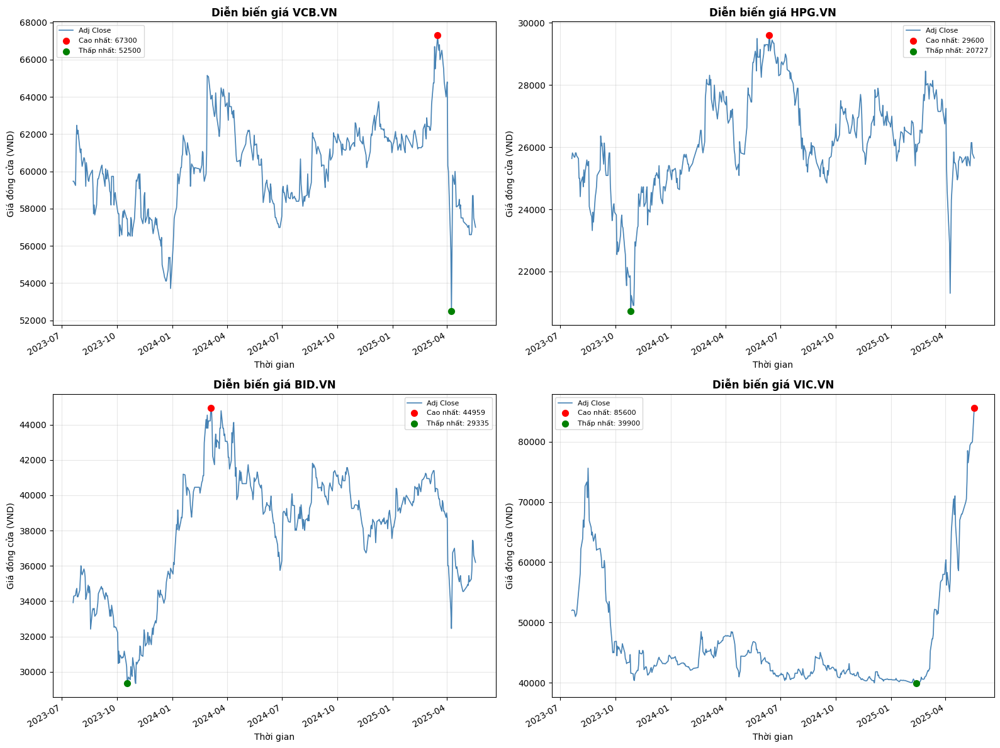


📈 **TÓM TẮT SO SÁNH CÁC MÃ CỔ PHIẾU**

🏆 **Xếp hạng theo tăng trưởng:**
1. VIC.VN: +64.62% - Tăng
2. BID.VN: +6.73% - Tăng
3. HPG.VN: +0.05% - Tăng
4. VCB.VN: -4.15% - Giảm

📊 **So sánh độ biến động:**
- VIC.VN: 2.23%/ngày (Tỷ lệ thắng: 47.0%)
- HPG.VN: 1.68%/ngày (Tỷ lệ thắng: 43.6%)
- BID.VN: 1.58%/ngày (Tỷ lệ thắng: 43.9%)
- VCB.VN: 1.25%/ngày (Tỷ lệ thắng: 43.3%)



In [ ]:
# Improved historical price analysis

def analyze_price_behavior(company_df, name):
    data = company_df['Adj Close'].dropna()  # Loại bỏ NaN values

    # Kiểm tra dữ liệu có đủ không
    if len(data) < 2:
        print(f"⚠️ **{name}**: Không đủ dữ liệu để phân tích")
        return

    # 1. Tính tỉ suất thay đổi
    returns = data.pct_change().dropna()

    # 2. Xác định xu hướng tổng thể (so sánh giá đầu và cuối)
    start_price = data.iloc[0]
    end_price = data.iloc[-1]

    if end_price > start_price:
        trend = "Tăng"
    elif end_price < start_price:
        trend = "Giảm"
    else:
        trend = "Đi ngang"

    # 3. Tính độ biến động (volatility) - chuẩn hóa
    volatility = returns.std() * 100 if len(returns) > 0 else 0

    # 4. Đếm số ngày tăng / giảm (chính xác hơn)
    up_days = (returns > 0).sum()
    down_days = (returns < 0).sum()
    flat_days = (returns == 0).sum()

    # 5. Tính tăng trưởng tổng thể
    growth = ((end_price / start_price) - 1) * 100

    # 6. Tìm giá cao nhất / thấp nhất với xử lý lỗi
    max_price = data.max()
    min_price = data.min()
    max_date = data.idxmax().strftime('%Y-%m-%d')
    min_date = data.idxmin().strftime('%Y-%m-%d')

    # 7. Thêm thống kê bổ sung
    total_days = len(returns)
    win_rate = (up_days / total_days * 100) if total_days > 0 else 0

    # Tính khoảng dao động (range)
    price_range = ((max_price - min_price) / min_price) * 100

    # 8. In kết quả với format đẹp hơn
    print(f"📊 **Phân tích {name}**")
    print(f"- Xu hướng tổng thể: {trend}")
    print(f"- Tăng trưởng tổng: {growth:+.2f}% (từ {start_price:.0f} → {end_price:.0f})")
    print(f"- Giai đoạn: {data.index[0].strftime('%Y-%m-%d')} đến {data.index[-1].strftime('%Y-%m-%d')}")
    print(f"- Biến động trung bình: {volatility:.2f}%/ngày")
    print(f"- Tỷ lệ ngày tăng: {win_rate:.1f}% ({up_days}/{total_days} ngày)")
    print(f"- Phân bố: {up_days} ngày tăng | {down_days} ngày giảm | {flat_days} ngày đi ngang")
    print(f"- Giá cao nhất: {max_price:,.0f} VND ({max_date})")
    print(f"- Giá thấp nhất: {min_price:,.0f} VND ({min_date})")
    print(f"- Dao động tối đa: {price_range:.1f}% (từ đáy đến đỉnh)")
    print(f"{'-'*70}")

    return {
        'trend': trend,
        'growth': growth,
        'volatility': volatility,
        'win_rate': win_rate,
        'up_days': up_days,
        'down_days': down_days,
        'max_price': max_price,
        'min_price': min_price,
        'max_date': max_date,
        'min_date': min_date
    }

# --- Vẽ biểu đồ & phân tích từng cổ phiếu ---

plt.figure(figsize=(16, 12))

# Dictionary để lưu kết quả phân tích
analysis_results = {}

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    # Vẽ biểu đồ với style đẹp hơn
    company['Adj Close'].plot(linewidth=1.2, color='steelblue')
    plt.ylabel('Giá đóng cửa (VND)', fontsize=10)
    plt.xlabel('Thời gian', fontsize=10)
    plt.title(f"Diễn biến giá {tech_list[i - 1]}", fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)

    # Đánh dấu điểm cao nhất và thấp nhất
    data = company['Adj Close'].dropna()
    if len(data) > 0:
        max_idx = data.idxmax()
        min_idx = data.idxmin()
        plt.scatter(max_idx, data.max(), color='red', s=50, zorder=5, label=f'Cao nhất: {data.max():.0f}')
        plt.scatter(min_idx, data.min(), color='green', s=50, zorder=5, label=f'Thấp nhất: {data.min():.0f}')
        plt.legend(fontsize=8)

    # Gọi hàm phân tích và lưu kết quả
    result = analyze_price_behavior(company, tech_list[i - 1])
    if result:
        analysis_results[tech_list[i - 1]] = result

plt.tight_layout()
plt.show()

# Tóm tắt so sánh các mã
print("\n" + "="*70)
print("📈 **TÓM TẮT SO SÁNH CÁC MÃ CỔ PHIẾU**")
print("="*70)

if analysis_results:
    # Sắp xếp theo tăng trưởng
    sorted_by_growth = sorted(analysis_results.items(), key=lambda x: x[1]['growth'], reverse=True)

    print("\n🏆 **Xếp hạng theo tăng trưởng:**")
    for i, (stock, data) in enumerate(sorted_by_growth, 1):
        print(f"{i}. {stock}: {data['growth']:+.2f}% - {data['trend']}")

    print("\n📊 **So sánh độ biến động:**")
    sorted_by_volatility = sorted(analysis_results.items(), key=lambda x: x[1]['volatility'], reverse=True)
    for stock, data in sorted_by_volatility:
        print(f"- {stock}: {data['volatility']:.2f}%/ngày (Tỷ lệ thắng: {data['win_rate']:.1f}%)")

print("\n" + "="*70)

***Returns analysis: Daily returns, cumulative returns***

In [ ]:
# Tính toán returns thống nhất cho tất cả mã
print("="*80)
print("CALCULATING RETURNS FOR ALL STOCKS")
print("="*80)

returns_data = {}
for i, company in enumerate(company_list):
    # Daily returns (decimal format for statistical analysis)
    daily_returns = company['Adj Close'].pct_change().dropna()
    returns_data[tech_list[i]] = daily_returns

    # Add columns to original dataframes
    company['Daily Return'] = company['Adj Close'].pct_change() * 100  # Percentage format for visualization
    company['Cumulative Return'] = (1 + company['Adj Close'].pct_change()).cumprod() - 1
    company['Cumulative Return %'] = company['Cumulative Return'] * 100

# Create unified returns DataFrame for statistical analysis
returns_df = pd.DataFrame(returns_data)

print(f"Returns data prepared for {len(tech_list)} stocks")
print(f"Date range: {returns_df.index.min()} to {returns_df.index.max()}")
print(f"Total observations per stock: {len(returns_df)}")


CALCULATING RETURNS FOR ALL STOCKS
Returns data prepared for 4 stocks
Date range: 2023-07-21 00:00:00 to 2025-05-19 00:00:00
Total observations per stock: 453


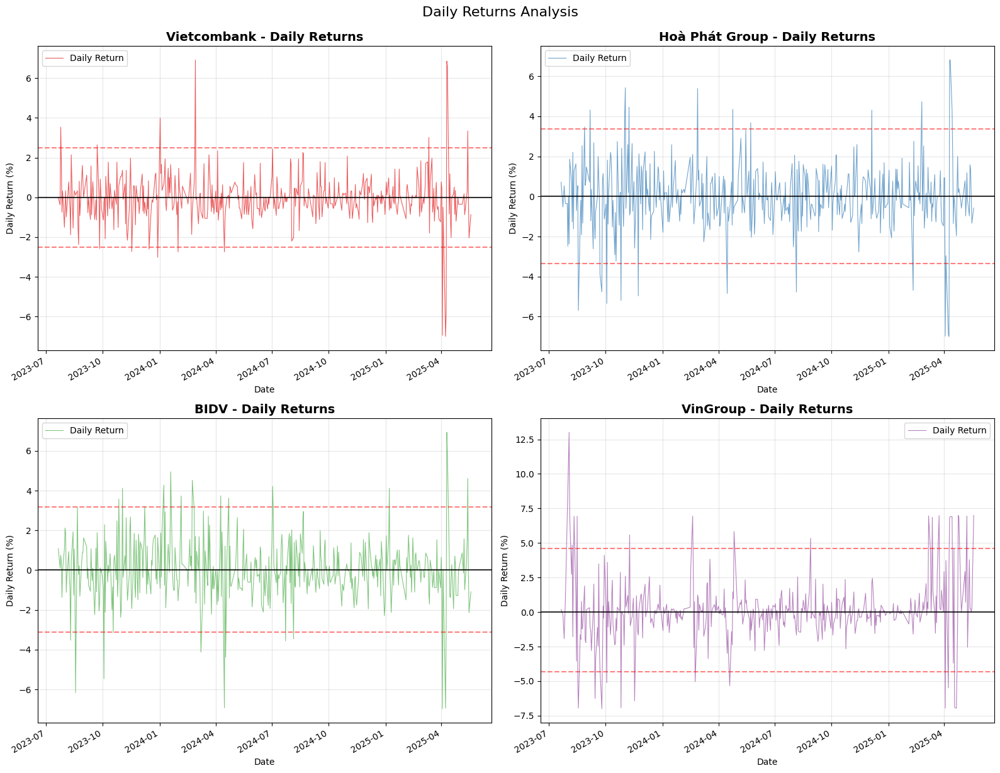

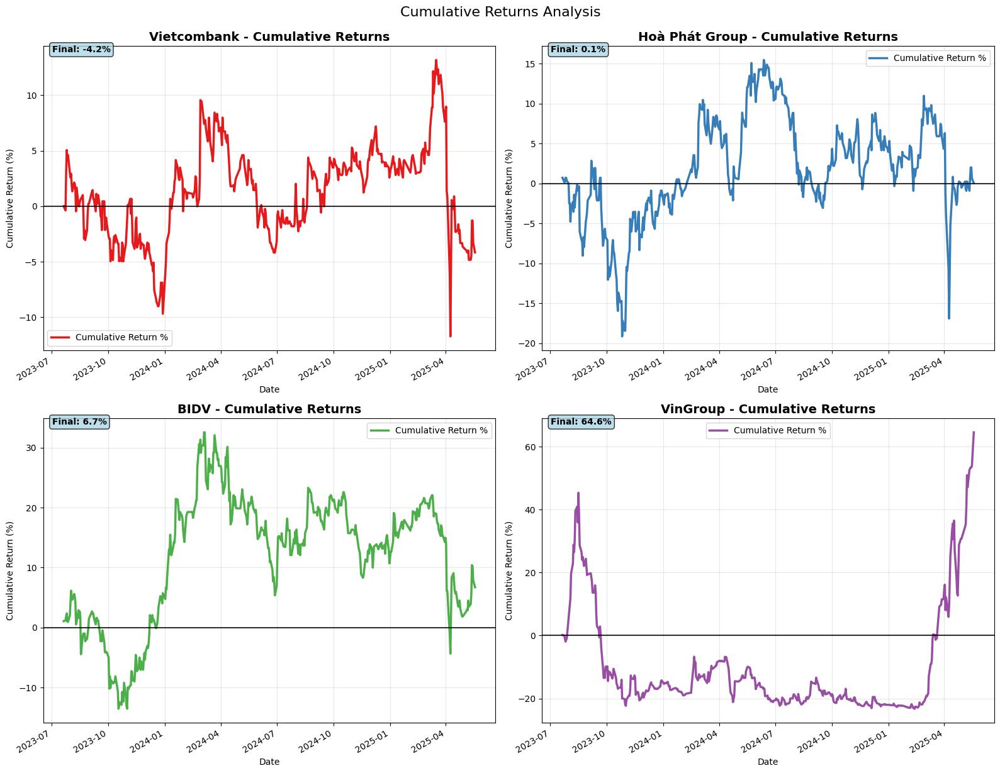

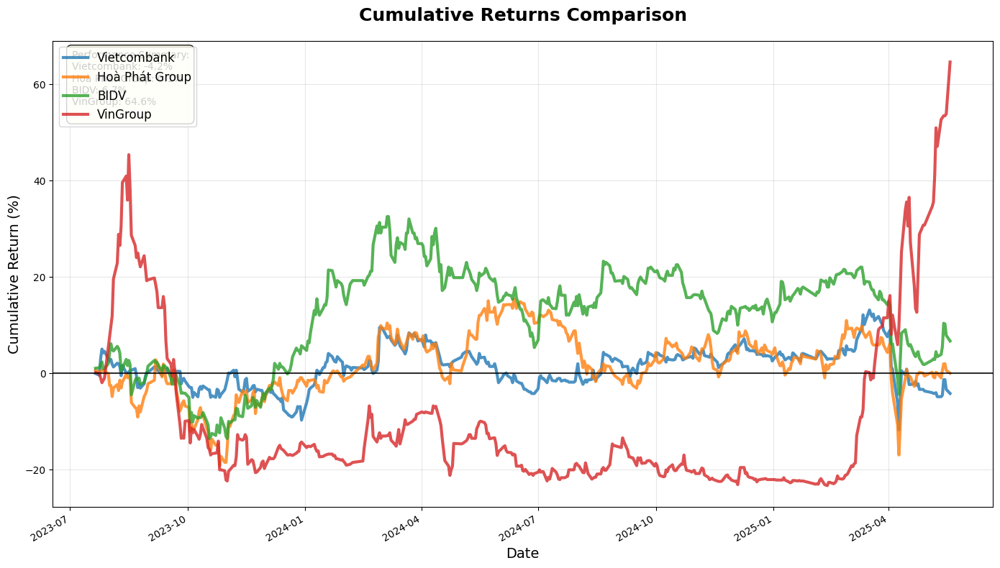

In [ ]:
# =============================================================================
# VISUALIZATION SECTION
# =============================================================================

def plot_returns_analysis():
    """Comprehensive returns visualization"""

    # 1. Daily Returns Time Series
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

    for i, (company, name) in enumerate(zip(company_list, company_names)):
        row, col = divmod(i, 2)

        # Plot daily returns with improved styling
        company['Daily Return'].plot(ax=axes[row, col],
                                   legend=True,
                                   alpha=0.7,
                                   linewidth=0.8,
                                   color=plt.cm.Set1(i))
        axes[row, col].set_title(f'{name} - Daily Returns', fontsize=14, fontweight='bold')
        axes[row, col].set_ylabel('Daily Return (%)')
        axes[row, col].grid(True, alpha=0.3)
        axes[row, col].axhline(y=0, color='black', linestyle='-', alpha=0.8)

        # Add volatility bands
        mean_return = company['Daily Return'].mean()
        std_return = company['Daily Return'].std()
        axes[row, col].axhline(y=mean_return + 2*std_return, color='red', linestyle='--', alpha=0.5)
        axes[row, col].axhline(y=mean_return - 2*std_return, color='red', linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.suptitle('Daily Returns Analysis', fontsize=16, y=1.02)
    plt.show()

    # 2. Cumulative Returns Time Series
    fig2, axes2 = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

    for i, (company, name) in enumerate(zip(company_list, company_names)):
        row, col = divmod(i, 2)

        company['Cumulative Return %'].plot(ax=axes2[row, col],
                                          legend=True,
                                          linewidth=2.5,
                                          color=plt.cm.Set1(i))
        axes2[row, col].set_title(f'{name} - Cumulative Returns', fontsize=14, fontweight='bold')
        axes2[row, col].set_ylabel('Cumulative Return (%)')
        axes2[row, col].grid(True, alpha=0.3)
        axes2[row, col].axhline(y=0, color='black', linestyle='-', alpha=0.8)

        # Add final return annotation
        final_return = company['Cumulative Return %'].iloc[-1]
        axes2[row, col].annotate(f'Final: {final_return:.1f}%',
                               xy=(0.02, 0.98), xycoords='axes fraction',
                               bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue', alpha=0.8),
                               fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.suptitle('Cumulative Returns Analysis', fontsize=16, y=1.02)
    plt.show()

    # 3. Comparative Cumulative Returns
    plt.figure(figsize=(14, 8))

    for i, (company, name) in enumerate(zip(company_list, company_names)):
        company['Cumulative Return %'].plot(label=name, linewidth=3, alpha=0.8)

    plt.title('Cumulative Returns Comparison', fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Cumulative Return (%)', fontsize=14)
    plt.legend(fontsize=12, loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.8)

    # Add performance summary box
    summary_text = "Performance Summary:\n"
    for i, (company, name) in enumerate(zip(company_list, company_names)):
        final_return = company['Cumulative Return %'].iloc[-1]
        summary_text += f"{name}: {final_return:.1f}%\n"

    plt.text(0.02, 0.98, summary_text, transform=plt.gca().transAxes,
             bbox=dict(boxstyle="round,pad=0.5", facecolor='lightyellow', alpha=0.9),
             verticalalignment='top', fontsize=10)

    plt.tight_layout()
    plt.show()

# Execute visualization
plot_returns_analysis()

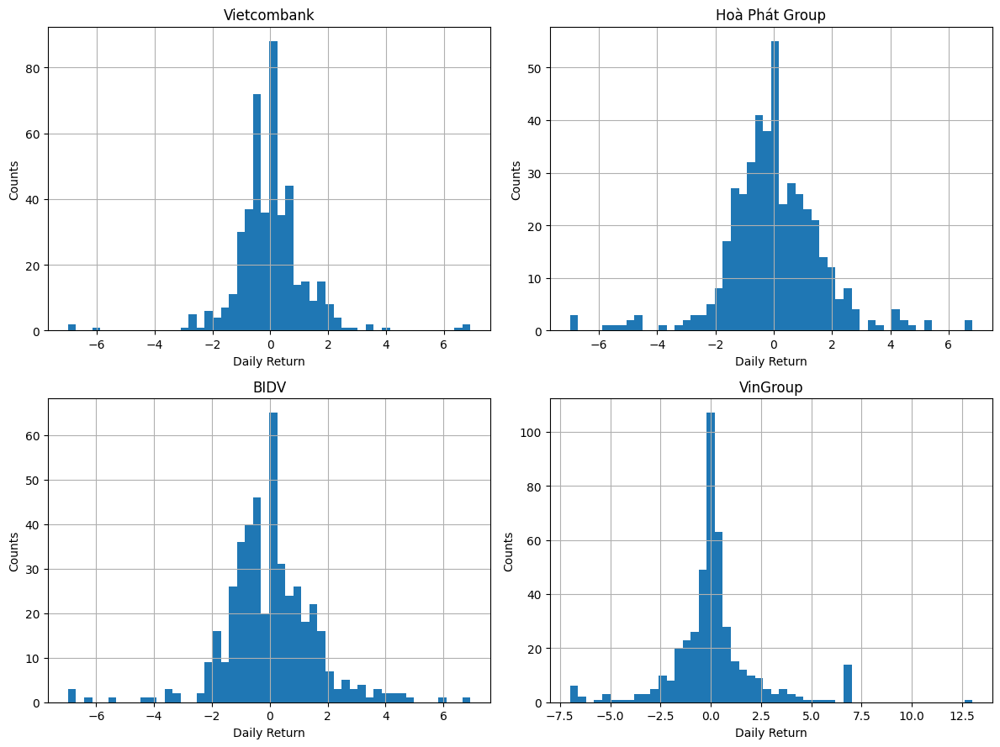

In [ ]:
# Daily return with histogram
plt.figure(figsize=(12, 9))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)
    company['Daily Return'].hist(bins=50)
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{company_names[i - 1]}')

plt.tight_layout()

# ***3. TECHNICAL ANALYSIS***

##**3.1. Trend analysis**

- **Moving Averages:** MA10, MA20, MA50
- **Golden Cross/Death Cross signals**
- **Trend strength:** ADX indicator
- **Support/Resistance levels**

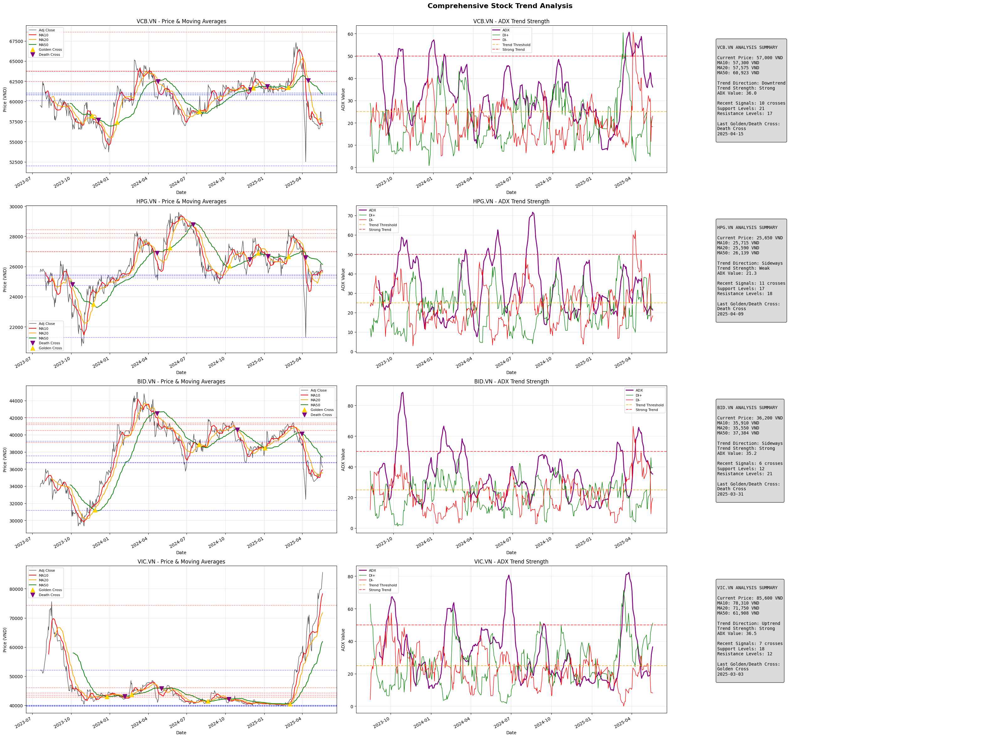

COMPREHENSIVE TREND ANALYSIS REPORT

VCB.VN:
  Current Price: 57,000 VND
  ADX (Trend Strength): 36.0
  Recent Golden/Death Crosses: 10
  Support Levels Identified: 21
  Resistance Levels Identified: 17
  Last Signal: Death Cross on 2025-04-15

HPG.VN:
  Current Price: 25,650 VND
  ADX (Trend Strength): 21.3
  Recent Golden/Death Crosses: 11
  Support Levels Identified: 17
  Resistance Levels Identified: 18
  Last Signal: Death Cross on 2025-04-09

BID.VN:
  Current Price: 36,200 VND
  ADX (Trend Strength): 35.2
  Recent Golden/Death Crosses: 6
  Support Levels Identified: 12
  Resistance Levels Identified: 21
  Last Signal: Death Cross on 2025-03-31

VIC.VN:
  Current Price: 85,600 VND
  ADX (Trend Strength): 36.5
  Recent Golden/Death Crosses: 7
  Support Levels Identified: 18
  Resistance Levels Identified: 12
  Last Signal: Golden Cross on 2025-03-03



In [ ]:
def calculate_adx(high, low, close, period=14):
    """Tính toán ADX (Average Directional Index)"""
    # True Range
    tr1 = high - low
    tr2 = abs(high - close.shift(1))
    tr3 = abs(low - close.shift(1))
    tr = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)

    # Directional Movement
    dm_plus = high - high.shift(1)
    dm_minus = low.shift(1) - low

    dm_plus[dm_plus < 0] = 0
    dm_minus[dm_minus < 0] = 0
    dm_plus[(dm_plus - dm_minus) <= 0] = 0
    dm_minus[(dm_minus - dm_plus) <= 0] = 0

    # Smoothed True Range và Directional Movement
    atr = tr.rolling(window=period).mean()
    di_plus = 100 * (dm_plus.rolling(window=period).mean() / atr)
    di_minus = 100 * (dm_minus.rolling(window=period).mean() / atr)

    # ADX
    dx = 100 * abs(di_plus - di_minus) / (di_plus + di_minus)
    adx = dx.rolling(window=period).mean()

    return adx, di_plus, di_minus

def find_support_resistance(data, window=20):
    """Tìm mức hỗ trợ và kháng cự"""
    # Tìm local minima và maxima
    high_data = data['High'].rolling(window=window, center=True).max()
    low_data = data['Low'].rolling(window=window, center=True).min()

    resistance_levels = []
    support_levels = []

    for i in range(window, len(data) - window):
        if data['High'].iloc[i] == high_data.iloc[i]:
            resistance_levels.append((data.index[i], data['High'].iloc[i]))
        if data['Low'].iloc[i] == low_data.iloc[i]:
            support_levels.append((data.index[i], data['Low'].iloc[i]))

    return support_levels, resistance_levels

def detect_golden_death_cross(ma_short, ma_long):
    """Phát hiện Golden Cross và Death Cross"""
    signals = []

    for i in range(1, len(ma_short)):
        if pd.notna(ma_short.iloc[i]) and pd.notna(ma_long.iloc[i]) and pd.notna(ma_short.iloc[i-1]) and pd.notna(ma_long.iloc[i-1]):
            # Golden Cross: MA ngắn cắt lên MA dài
            if ma_short.iloc[i-1] <= ma_long.iloc[i-1] and ma_short.iloc[i] > ma_long.iloc[i]:
                signals.append((ma_short.index[i], 'Golden Cross', ma_short.iloc[i]))
            # Death Cross: MA ngắn cắt xuống MA dài
            elif ma_short.iloc[i-1] >= ma_long.iloc[i-1] and ma_short.iloc[i] < ma_long.iloc[i]:
                signals.append((ma_short.index[i], 'Death Cross', ma_short.iloc[i]))

    return signals

# Thiết lập figure với nhiều subplots
fig = plt.figure(figsize=(32, 24))
fig.suptitle('Comprehensive Stock Trend Analysis', fontsize=16, fontweight='bold')

for i, company in enumerate(company_list):
    stock_name = tech_list[i]

    # Tính toán các chỉ số
    company['MA10'] = company['Adj Close'].rolling(window=10).mean()
    company['MA20'] = company['Adj Close'].rolling(window=20).mean()
    company['MA50'] = company['Adj Close'].rolling(window=50).mean()

    # Tính ADX
    company['ADX'], company['DI+'], company['DI-'] = calculate_adx(
        company['High'], company['Low'], company['Adj Close']
    )

    # Tìm support/resistance
    support_levels, resistance_levels = find_support_resistance(company)

    # Phát hiện Golden/Death Cross
    golden_death_signals = detect_golden_death_cross(company['MA20'], company['MA50'])

    # Subplot 1: Price và Moving Averages
    plt.subplot(4, 3, i*3 + 1)
    company['Adj Close'].plot(label='Adj Close', color='black', alpha=0.7, linewidth=1)
    company['MA10'].plot(label='MA10', color='red', linewidth=1.5)
    company['MA20'].plot(label='MA20', color='orange', linewidth=1.5)
    company['MA50'].plot(label='MA50', color='green', linewidth=1.5)

    # Vẽ support và resistance levels
    for date, level in support_levels[-5:]:  # Chỉ hiển thị 5 mức gần nhất
        plt.axhline(y=level, color='blue', linestyle='--', alpha=0.5, linewidth=1)

    for date, level in resistance_levels[-5:]:  # Chỉ hiển thị 5 mức gần nhất
        plt.axhline(y=level, color='red', linestyle='--', alpha=0.5, linewidth=1)

    # Đánh dấu Golden/Death Cross
    for date, signal_type, price in golden_death_signals:
        if signal_type == 'Golden Cross':
            plt.scatter(date, price, color='gold', s=100, marker='^', zorder=5, label='Golden Cross' if 'Golden Cross' not in plt.gca().get_legend_handles_labels()[1] else '')
        else:
            plt.scatter(date, price, color='purple', s=100, marker='v', zorder=5, label='Death Cross' if 'Death Cross' not in plt.gca().get_legend_handles_labels()[1] else '')

    plt.title(f'{stock_name} - Price & Moving Averages')
    plt.ylabel('Price (VND)')
    plt.legend(fontsize=8)
    plt.grid(True, alpha=0.3)

    # Subplot 2: ADX và Trend Strength
    plt.subplot(4, 3, i*3 + 2)
    company['ADX'].plot(label='ADX', color='purple', linewidth=2)
    company['DI+'].plot(label='DI+', color='green', linewidth=1)
    company['DI-'].plot(label='DI-', color='red', linewidth=1)

    # Thêm vùng trend strength
    plt.axhline(y=25, color='orange', linestyle='--', alpha=0.7, label='Trend Threshold')
    plt.axhline(y=50, color='red', linestyle='--', alpha=0.7, label='Strong Trend')

    plt.title(f'{stock_name} - ADX Trend Strength')
    plt.ylabel('ADX Value')
    plt.legend(fontsize=8)
    plt.grid(True, alpha=0.3)

    # Subplot 3: Summary Table
    plt.subplot(4, 3, i*3 + 3)
    plt.axis('off')

    # Tạo bảng tóm tắt
    current_price = company['Adj Close'].iloc[-1]
    current_ma10 = company['MA10'].iloc[-1]
    current_ma20 = company['MA20'].iloc[-1]
    current_ma50 = company['MA50'].iloc[-1]
    current_adx = company['ADX'].iloc[-1]

    # Xác định xu hướng
    if current_ma10 > current_ma20 > current_ma50:
        trend = "Uptrend"
        trend_color = "green"
    elif current_ma10 < current_ma20 < current_ma50:
        trend = "Downtrend"
        trend_color = "red"
    else:
        trend = "Sideways"
        trend_color = "orange"

    # Xác định độ mạnh xu hướng
    if pd.notna(current_adx):
        if current_adx > 50:
            strength = "Very Strong"
        elif current_adx > 25:
            strength = "Strong"
        else:
            strength = "Weak"
    else:
        strength = "N/A"

    # Tạo text summary
    adx_display = f"{current_adx:.1f}" if pd.notna(current_adx) else "N/A"
    last_signal_type = golden_death_signals[-1][1] if golden_death_signals else "None"
    last_signal_date = golden_death_signals[-1][0].strftime('%Y-%m-%d') if golden_death_signals else ""

    summary_text = f"""
{stock_name} ANALYSIS SUMMARY

Current Price: {current_price:,.0f} VND
MA10: {current_ma10:,.0f} VND
MA20: {current_ma20:,.0f} VND
MA50: {current_ma50:,.0f} VND

Trend Direction: {trend}
Trend Strength: {strength}
ADX Value: {adx_display}

Recent Signals: {len(golden_death_signals)} crosses
Support Levels: {len(support_levels)}
Resistance Levels: {len(resistance_levels)}

Last Golden/Death Cross:
{last_signal_type}
{last_signal_date}
"""

    plt.text(0.1, 0.9, summary_text, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# In ra báo cáo tóm tắt cho tất cả cổ phiếu
print("="*80)
print("COMPREHENSIVE TREND ANALYSIS REPORT")
print("="*80)

for i, company in enumerate(company_list):
    stock_name = tech_list[i]
    current_price = company['Adj Close'].iloc[-1]
    current_adx = company['ADX'].iloc[-1]

    # Tính toán các tín hiệu
    golden_death_signals = detect_golden_death_cross(company['MA20'], company['MA50'])
    support_levels, resistance_levels = find_support_resistance(company)

    adx_print = f"{current_adx:.1f}" if pd.notna(current_adx) else "N/A"

    print(f"\n{stock_name}:")
    print(f"  Current Price: {current_price:,.0f} VND")
    print(f"  ADX (Trend Strength): {adx_print}")
    print(f"  Recent Golden/Death Crosses: {len(golden_death_signals)}")
    print(f"  Support Levels Identified: {len(support_levels)}")
    print(f"  Resistance Levels Identified: {len(resistance_levels)}")

    if golden_death_signals:
        last_signal = golden_death_signals[-1]
        print(f"  Last Signal: {last_signal[1]} on {last_signal[0].strftime('%Y-%m-%d')}")

print("\n" + "="*80)

##**3.2 Momentum Indicators**

- **RSI:** Overbought/oversold conditions
- **MACD:** Signal line crossovers, histogram analysis
- **Stochastic Oscillator:** %K and %D lines
- **Williams %R:** Additional momentum confirmation

RSI

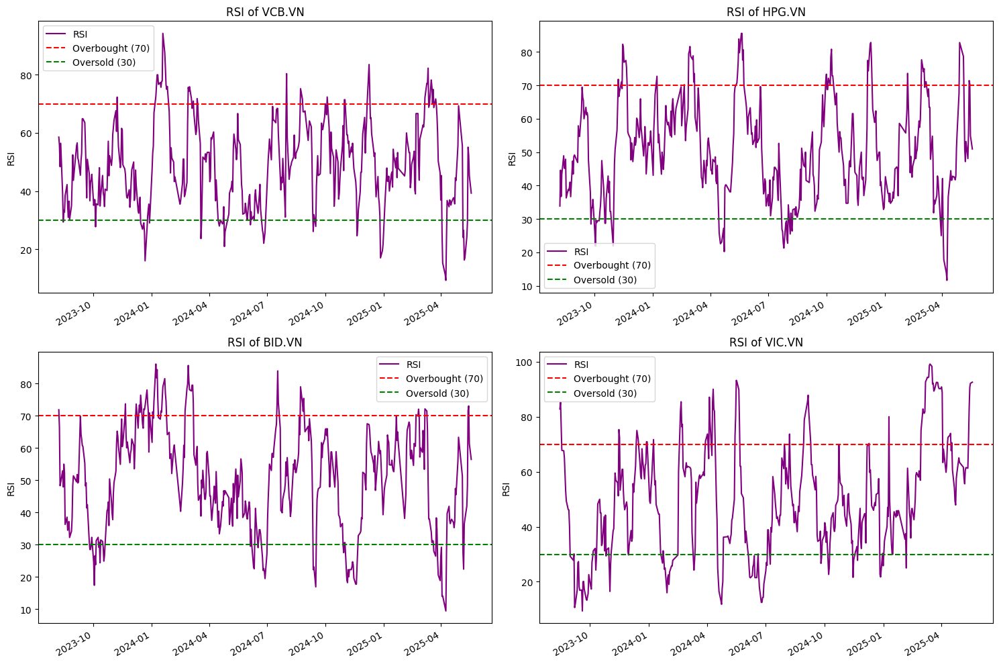

In [ ]:
for i, company in enumerate(company_list, 1):
  delta = company['Adj Close'].diff()
  gain = delta.where(delta > 0, 0)
  loss = -delta.where(delta < 0, 0)
  avg_gain = gain.rolling(window=14).mean()
  avg_loss = loss.rolling(window=14).mean()
  rs = avg_gain / avg_loss
  company['RSI'] = 100 - (100 / (1 + rs))

plt.figure(figsize=(15, 10))
for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    # Đường RSI
    company['RSI'].plot(color='purple', label='RSI')

    # Đường ngưỡng quá mua và quá bán
    plt.axhline(70, color='red', linestyle='--', label='Overbought (70)')
    plt.axhline(30, color='green', linestyle='--', label='Oversold (30)')

    plt.title(f'RSI of {tech_list[i - 1]}')
    plt.ylabel('RSI')
    plt.xlabel(None)
    plt.legend()

plt.tight_layout()
plt.show()



In [ ]:
# === PHÂN TÍCH THỐNG KÊ RSI ===
import pandas as pd
import numpy as np

print("📊 THỐNG KÊ VÀ PHÂN TÍCH RSI")
print("=" * 60)

rsi_analysis = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i - 1]
    rsi_data = company['RSI'].dropna()

    # Thống kê cơ bản
    current_rsi = rsi_data.iloc[-1]
    avg_rsi = rsi_data.mean()
    std_rsi = rsi_data.std()

    # Đếm tín hiệu
    overbought_count = len(rsi_data[rsi_data > 70])
    oversold_count = len(rsi_data[rsi_data < 30])
    neutral_count = len(rsi_data[(rsi_data >= 30) & (rsi_data <= 70)])

    # Tính % thời gian trong mỗi vùng
    total_days = len(rsi_data)
    overbought_pct = (overbought_count / total_days) * 100
    oversold_pct = (oversold_count / total_days) * 100
    neutral_pct = (neutral_count / total_days) * 100

    # Xu hướng gần đây (10 ngày cuối)
    recent_rsi = rsi_data.tail(10)
    rsi_trend = "Tăng" if recent_rsi.iloc[-1] > recent_rsi.iloc[0] else "Giảm"

    # Đánh giá tình trạng hiện tại
    if current_rsi > 70:
        status = "⚠️  QUÁ MUA - Có thể điều chỉnh giảm"
        signal = "SELL"
    elif current_rsi < 30:
        status = "🟢 QUÁ BÁN - Có thể phục hồi"
        signal = "BUY"
    elif current_rsi > 60:
        status = "🟡 Gần vùng quá mua"
        signal = "CAUTION"
    elif current_rsi < 40:
        status = "🟡 Gần vùng quá bán"
        signal = "WATCH"
    else:
        status = "🔵 Trung tính"
        signal = "HOLD"

    rsi_analysis[company_name] = {
        'current_rsi': current_rsi,
        'avg_rsi': avg_rsi,
        'status': status,
        'signal': signal,
        'overbought_pct': overbought_pct,
        'oversold_pct': oversold_pct,
        'trend': rsi_trend
    }

    print(f"\n🏢 {company_name}")
    print(f"   RSI hiện tại: {current_rsi:.2f}")
    print(f"   RSI trung bình: {avg_rsi:.2f} (±{std_rsi:.2f})")
    print(f"   Tình trạng: {status}")
    print(f"   Tín hiệu: {signal}")
    print(f"   Xu hướng 10 ngày: {rsi_trend}")
    print(f"   Thời gian quá mua: {overbought_pct:.1f}%")
    print(f"   Thời gian quá bán: {oversold_pct:.1f}%")

# Tổng kết so sánh
print(f"\n{'='*60}")
print("📈 TỔNG KẾT SO SÁNH RSI:")
rsi_df = pd.DataFrame(rsi_analysis).T
print(f"Cổ phiếu có RSI cao nhất: {rsi_df['current_rsi'].idxmax()} ({rsi_df['current_rsi'].max():.2f})")
print(f"Cổ phiếu có RSI thấp nhất: {rsi_df['current_rsi'].idxmin()} ({rsi_df['current_rsi'].min():.2f})")

# Đếm tín hiệu
buy_signals = sum(1 for x in rsi_analysis.values() if x['signal'] == 'BUY')
sell_signals = sum(1 for x in rsi_analysis.values() if x['signal'] == 'SELL')
print(f"Tín hiệu MUA: {buy_signals} cổ phiếu")
print(f"Tín hiệu BÁN: {sell_signals} cổ phiếu")

📊 THỐNG KÊ VÀ PHÂN TÍCH RSI

🏢 VCB.VN
   RSI hiện tại: 39.29
   RSI trung bình: 49.06 (±14.94)
   Tình trạng: 🟡 Gần vùng quá bán
   Tín hiệu: WATCH
   Xu hướng 10 ngày: Tăng
   Thời gian quá mua: 9.3%
   Thời gian quá bán: 9.8%

🏢 HPG.VN
   RSI hiện tại: 50.94
   RSI trung bình: 50.40 (±14.88)
   Tình trạng: 🔵 Trung tính
   Tín hiệu: HOLD
   Xu hướng 10 ngày: Giảm
   Thời gian quá mua: 11.6%
   Thời gian quá bán: 7.8%

🏢 BID.VN
   RSI hiện tại: 56.41
   RSI trung bình: 49.92 (±16.08)
   Tình trạng: 🔵 Trung tính
   Tín hiệu: HOLD
   Xu hướng 10 ngày: Tăng
   Thời gian quá mua: 11.3%
   Thời gian quá bán: 12.5%

🏢 VIC.VN
   RSI hiện tại: 92.57
   RSI trung bình: 49.34 (±20.56)
   Tình trạng: ⚠️  QUÁ MUA - Có thể điều chỉnh giảm
   Tín hiệu: SELL
   Xu hướng 10 ngày: Tăng
   Thời gian quá mua: 16.5%
   Thời gian quá bán: 19.5%

📈 TỔNG KẾT SO SÁNH RSI:
Cổ phiếu có RSI cao nhất: VIC.VN (92.57)
Cổ phiếu có RSI thấp nhất: VCB.VN (39.29)
Tín hiệu MUA: 0 cổ phiếu
Tín hiệu BÁN: 1 cổ phiếu


Stochastic Oscillator

Stochastic Oscillator calculation completed!


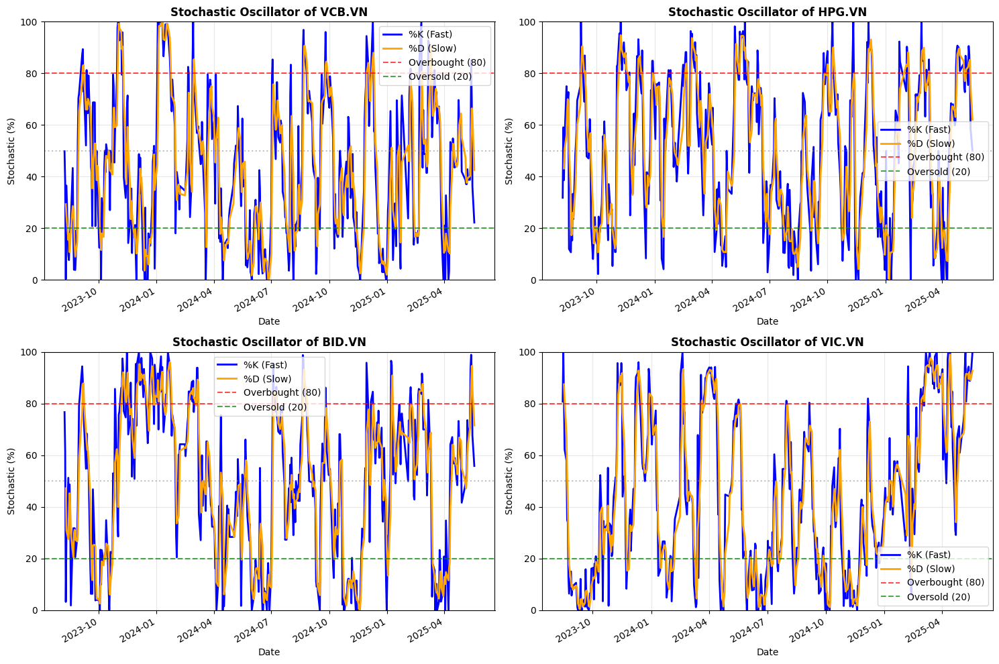

In [ ]:
for i, company in enumerate(company_list, 1):
    # Tính %K (Fast Stochastic)
    low_14 = company['Low'].rolling(window=14).min()
    high_14 = company['High'].rolling(window=14).max()
    company['%K'] = 100 * ((company['Close'] - low_14) / (high_14 - low_14))

    # Tính %D (Slow Stochastic - moving average của %K)
    company['%D'] = company['%K'].rolling(window=3).mean()

print("Stochastic Oscillator calculation completed!")


plt.figure(figsize=(15, 10))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    # Đường %K và %D
    company['%K'].plot(color='blue', label='%K (Fast)', linewidth=2)
    company['%D'].plot(color='orange', label='%D (Slow)', linewidth=2)

    # Đường ngưỡng quá mua và quá bán cho Stochastic
    plt.axhline(80, color='red', linestyle='--', label='Overbought (80)', alpha=0.7)
    plt.axhline(20, color='green', linestyle='--', label='Oversold (20)', alpha=0.7)
    plt.axhline(50, color='gray', linestyle=':', alpha=0.5)

    plt.title(f'Stochastic Oscillator of {tech_list[i - 1]}', fontsize=12, fontweight='bold')
    plt.ylabel('Stochastic (%)')
    plt.ylim(0, 100)
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
print(vcb_data.tail())

            Adj Close    Close     High      Low     Open    Volume  \
Date                                                                  
2025-05-13    56800.0  56800.0  57300.0  56600.0  57100.0   7613543   
2025-05-14    58700.0  58700.0  58800.0  57200.0  57200.0   8071608   
2025-05-15    58700.0  58700.0  59800.0  58700.0  59300.0   8290607   
2025-05-16    57500.0  57500.0  59000.0  57500.0  58800.0  11589970   
2025-05-19    57000.0  57000.0  57600.0  57000.0  57400.0   5002918   

           company_name  Daily Return  Cumulative Return  Cumulative Return %  \
Date                                                                            
2025-05-13  Vietcombank      0.353357          -0.044897            -4.489715   
2025-05-14  Vietcombank      3.345070          -0.012948            -1.294829   
2025-05-15  Vietcombank      0.000000          -0.012948            -1.294829   
2025-05-16  Vietcombank     -2.044293          -0.033127            -3.312652   
2025-05-19  Viet

In [ ]:
# === PHÂN TÍCH THỐNG KÊ STOCHASTIC OSCILLATOR ===

print("📊 THỐNG KÊ VÀ PHÂN TÍCH STOCHASTIC OSCILLATOR")
print("=" * 70)

stoch_analysis = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i - 1]
    k_data = company['%K'].dropna()
    d_data = company['%D'].dropna()

    # Thống kê hiện tại
    current_k = k_data.iloc[-1]
    current_d = d_data.iloc[-1]

    # Đếm tín hiệu
    total_days = len(k_data)
    overbought_count = len(k_data[k_data > 80])
    oversold_count = len(k_data[k_data < 20])

    overbought_pct = (overbought_count / total_days) * 100
    oversold_pct = (oversold_count / total_days) * 100
    k_data, d_data = k_data.align(d_data, join='inner')
    # Phân tích crossover (tín hiệu giao cắt)
    k_above_d = k_data > d_data
    crossover_points = k_above_d.diff()
    bullish_cross = len(crossover_points[crossover_points == True])  # %K cắt lên %D
    bearish_cross = len(crossover_points[crossover_points == False]) # %K cắt xuống %D

    # Xu hướng gần đây
    recent_k_trend = "Tăng" if k_data.tail(5).iloc[-1] > k_data.tail(5).iloc[0] else "Giảm"
    k_d_position = "%K trên %D" if current_k > current_d else "%K dưới %D"

    # Đánh giá tình trạng
    if current_k > 80 and current_d > 80:
        status = "⚠️  QUÁ MUA MẠNH - Áp lực bán cao"
        signal = "STRONG SELL"
    elif current_k < 20 and current_d < 20:
        status = "🟢 QUÁ BÁN MẠNH - Cơ hội mua tốt"
        signal = "STRONG BUY"
    elif current_k > 80:
        status = "🟡 Vùng quá mua"
        signal = "SELL"
    elif current_k < 20:
        status = "🟡 Vùng quá bán"
        signal = "BUY"
    elif current_k > current_d and current_k > 50:
        status = "🔵 Xu hướng tăng"
        signal = "BUY"
    elif current_k < current_d and current_k < 50:
        status = "🔴 Xu hướng giảm"
        signal = "SELL"
    else:
        status = "⚪ Trung tính"
        signal = "HOLD"

    # Momentum (độ phân kỳ giữa %K và %D)
    momentum = abs(current_k - current_d)
    momentum_strength = "Mạnh" if momentum > 10 else "Yếu"

    stoch_analysis[company_name] = {
        'current_k': current_k,
        'current_d': current_d,
        'status': status,
        'signal': signal,
        'momentum': momentum,
        'overbought_pct': overbought_pct,
        'oversold_pct': oversold_pct,
        'bullish_cross': bullish_cross,
        'bearish_cross': bearish_cross
    }

    print(f"\n🏢 {company_name}")
    print(f"   %K hiện tại: {current_k:.2f}")
    print(f"   %D hiện tại: {current_d:.2f}")
    print(f"   Vị trí: {k_d_position}")
    print(f"   Momentum: {momentum:.2f} ({momentum_strength})")
    print(f"   Tình trạng: {status}")
    print(f"   Tín hiệu: {signal}")
    print(f"   Xu hướng %K: {recent_k_trend}")
    print(f"   Thời gian quá mua (>80): {overbought_pct:.1f}%")
    print(f"   Thời gian quá bán (<20): {oversold_pct:.1f}%")
    print(f"   Tín hiệu tăng (crossover): {bullish_cross} lần")
    print(f"   Tín hiệu giảm (crossunder): {bearish_cross} lần")

# Tổng kết
print(f"\n{'='*70}")
print("📈 TỔNG KẾT STOCHASTIC:")
stoch_df = pd.DataFrame(stoch_analysis).T

print(f"Cổ phiếu có %K cao nhất: {stoch_df['current_k'].idxmax()} ({stoch_df['current_k'].max():.2f})")
print(f"Cổ phiếu có %K thấp nhất: {stoch_df['current_k'].idxmin()} ({stoch_df['current_k'].min():.2f})")
print(f"Momentum mạnh nhất: {stoch_df['momentum'].idxmax()} ({stoch_df['momentum'].max():.2f})")

# Đếm tín hiệu
strong_buy = sum(1 for x in stoch_analysis.values() if x['signal'] == 'STRONG BUY')
strong_sell = sum(1 for x in stoch_analysis.values() if x['signal'] == 'STRONG SELL')
buy_signals = sum(1 for x in stoch_analysis.values() if 'BUY' in x['signal'])
sell_signals = sum(1 for x in stoch_analysis.values() if 'SELL' in x['signal'])

print(f"Tín hiệu MUA MẠNH: {strong_buy} cổ phiếu")
print(f"Tín hiệu BÁN MẠNH: {strong_sell} cổ phiếu")
print(f"Tổng tín hiệu MUA: {buy_signals} cổ phiếu")
print(f"Tổng tín hiệu BÁN: {sell_signals} cổ phiếu")

📊 THỐNG KÊ VÀ PHÂN TÍCH STOCHASTIC OSCILLATOR

🏢 VCB.VN
   %K hiện tại: 22.22
   %D hiện tại: 42.59
   Vị trí: %K dưới %D
   Momentum: 20.37 (Mạnh)
   Tình trạng: 🔴 Xu hướng giảm
   Tín hiệu: SELL
   Xu hướng %K: Giảm
   Thời gian quá mua (>80): 10.4%
   Thời gian quá bán (<20): 26.1%
   Tín hiệu tăng (crossover): 162 lần
   Tín hiệu giảm (crossunder): 276 lần

🏢 HPG.VN
   %K hiện tại: 50.00
   %D hiện tại: 62.04
   Vị trí: %K dưới %D
   Momentum: 12.04 (Mạnh)
   Tình trạng: ⚪ Trung tính
   Tín hiệu: HOLD
   Xu hướng %K: Giảm
   Thời gian quá mua (>80): 18.9%
   Thời gian quá bán (<20): 17.8%
   Tín hiệu tăng (crossover): 182 lần
   Tín hiệu giảm (crossunder): 253 lần

🏢 BID.VN
   %K hiện tại: 55.88
   %D hiện tại: 71.57
   Vị trí: %K dưới %D
   Momentum: 15.69 (Mạnh)
   Tình trạng: ⚪ Trung tính
   Tín hiệu: HOLD
   Xu hướng %K: Giảm
   Thời gian quá mua (>80): 18.1%
   Thời gian quá bán (<20): 21.5%
   Tín hiệu tăng (crossover): 174 lần
   Tín hiệu giảm (crossunder): 264 lần

🏢 VIC.VN

William R%

✅ Williams %R calculation completed!


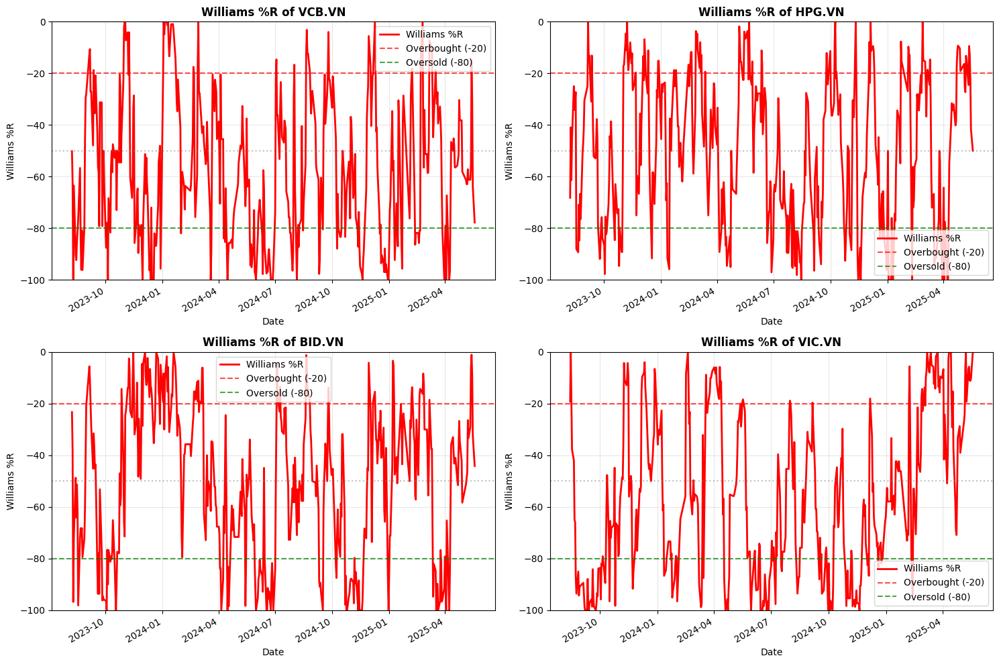

In [ ]:
for i, company in enumerate(company_list, 1):
    # Tính Williams %R
    high_14 = company['High'].rolling(window=14).max()
    low_14 = company['Low'].rolling(window=14).min()
    company['Williams_R'] = -100 * ((high_14 - company['Close']) / (high_14 - low_14))

print("✅ Williams %R calculation completed!")

plt.figure(figsize=(15, 10))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    # Đường Williams %R
    company['Williams_R'].plot(color='red', label='Williams %R', linewidth=2)

    # Đường ngưỡng quá mua và quá bán cho Williams %R
    plt.axhline(-20, color='red', linestyle='--', label='Overbought (-20)', alpha=0.7)
    plt.axhline(-80, color='green', linestyle='--', label='Oversold (-80)', alpha=0.7)
    plt.axhline(-50, color='gray', linestyle=':', alpha=0.5)

    plt.title(f'Williams %R of {tech_list[i - 1]}', fontsize=12, fontweight='bold')
    plt.ylabel('Williams %R')
    plt.ylim(-100, 0)
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# === PHÂN TÍCH THỐNG KÊ WILLIAMS %R ===

print("📊 THỐNG KÊ VÀ PHÂN TÍCH WILLIAMS %R")
print("=" * 60)

williams_analysis = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i - 1]
    wr_data = company['Williams_R'].dropna()

    # Thống kê cơ bản
    current_wr = wr_data.iloc[-1]
    avg_wr = wr_data.mean()
    std_wr = wr_data.std()

    # Đếm tín hiệu (Williams %R dao động từ -100 đến 0)
    total_days = len(wr_data)
    overbought_count = len(wr_data[wr_data > -20])  # Trên -20 là quá mua
    oversold_count = len(wr_data[wr_data < -80])    # Dưới -80 là quá bán
    neutral_count = len(wr_data[(wr_data >= -80) & (wr_data <= -20)])

    overbought_pct = (overbought_count / total_days) * 100
    oversold_pct = (oversold_count / total_days) * 100
    neutral_pct = (neutral_count / total_days) * 100

    # Xu hướng gần đây (10 ngày)
    recent_wr = wr_data.tail(10)
    wr_trend = "Tăng" if recent_wr.iloc[-1] > recent_wr.iloc[0] else "Giảm"

    # Tính volatility (độ biến động)
    volatility = wr_data.tail(20).std()
    vol_level = "Cao" if volatility > std_wr else "Thấp"

    # Đánh giá tình trạng hiện tại
    if current_wr > -20:
        status = "⚠️  QUÁ MUA - Áp lực bán tăng"
        signal = "SELL"
        strength = "Mạnh" if current_wr > -10 else "Vừa"
    elif current_wr < -80:
        status = "🟢 QUÁ BÁN - Cơ hội mua"
        signal = "BUY"
        strength = "Mạnh" if current_wr < -90 else "Vừa"
    elif current_wr > -30:
        status = "🟡 Gần vùng quá mua"
        signal = "CAUTION"
        strength = "Yếu"
    elif current_wr < -70:
        status = "🟡 Gần vùng quá bán"
        signal = "WATCH"
        strength = "Yếu"
    else:
        status = "🔵 Trung tính"
        signal = "HOLD"
        strength = "Trung bình"

    # Tính số lần đảo chiều (reversal points)
    # Đảo chiều từ quá bán lên
    oversold_to_up = 0
    # Đảo chiều từ quá mua xuống
    overbought_to_down = 0

    for j in range(1, len(wr_data)):
        if wr_data.iloc[j-1] < -80 and wr_data.iloc[j] > -80:
            oversold_to_up += 1
        elif wr_data.iloc[j-1] > -20 and wr_data.iloc[j] < -20:
            overbought_to_down += 1

    williams_analysis[company_name] = {
        'current_wr': current_wr,
        'avg_wr': avg_wr,
        'status': status,
        'signal': signal,
        'strength': strength,
        'overbought_pct': overbought_pct,
        'oversold_pct': oversold_pct,
        'volatility': volatility,
        'trend': wr_trend,
        'reversals_up': oversold_to_up,
        'reversals_down': overbought_to_down
    }

    print(f"\n🏢 {company_name}")
    print(f"   Williams %R hiện tại: {current_wr:.2f}")
    print(f"   Williams %R trung bình: {avg_wr:.2f} (±{std_wr:.2f})")
    print(f"   Tình trạng: {status}")
    print(f"   Tín hiệu: {signal} ({strength})")
    print(f"   Xu hướng 10 ngày: {wr_trend}")
    print(f"   Độ biến động: {vol_level} ({volatility:.2f})")
    print(f"   Thời gian quá mua (>-20): {overbought_pct:.1f}%")
    print(f"   Thời gian quá bán (<-80): {oversold_pct:.1f}%")
    print(f"   Thời gian trung tính: {neutral_pct:.1f}%")
    print(f"   Đảo chiều từ quá bán: {oversold_to_up} lần")
    print(f"   Đảo chiều từ quá mua: {overbought_to_down} lần")

# Tổng kết so sánh
print(f"\n{'='*60}")
print("📈 TỔNG KẾT WILLIAMS %R:")
wr_df = pd.DataFrame(williams_analysis).T

print(f"Cổ phiếu gần quá mua nhất: {wr_df['current_wr'].idxmax()} ({wr_df['current_wr'].max():.2f})")
print(f"Cổ phiếu gần quá bán nhất: {wr_df['current_wr'].idxmin()} ({wr_df['current_wr'].min():.2f})")
print(f"Biến động cao nhất: {wr_df['volatility'].idxmax()} ({wr_df['volatility'].max():.2f})")

# Đếm tín hiệu
buy_signals = sum(1 for x in williams_analysis.values() if x['signal'] == 'BUY')
sell_signals = sum(1 for x in williams_analysis.values() if x['signal'] == 'SELL')
watch_signals = sum(1 for x in williams_analysis.values() if x['signal'] in ['WATCH', 'CAUTION'])

print(f"Tín hiệu MUA: {buy_signals} cổ phiếu")
print(f"Tín hiệu BÁN: {sell_signals} cổ phiếu")
print(f"Tín hiệu THEO DÕI: {watch_signals} cổ phiếu")

# Phân tích hiệu suất đảo chiều
total_reversals = sum(x['reversals_up'] + x['reversals_down'] for x in williams_analysis.values())
print(f"Tổng số lần đảo chiều: {total_reversals} lần")
if total_reversals > 0:
    success_rate = sum(x['reversals_up'] for x in williams_analysis.values()) / total_reversals * 100
    print(f"Tỷ lệ đảo chiều tích cực: {success_rate:.1f}%")

📊 THỐNG KÊ VÀ PHÂN TÍCH WILLIAMS %R

🏢 VCB.VN
   Williams %R hiện tại: -77.78
   Williams %R trung bình: -56.54 (±27.76)
   Tình trạng: 🟡 Gần vùng quá bán
   Tín hiệu: WATCH (Yếu)
   Xu hướng 10 ngày: Giảm
   Độ biến động: Thấp (14.71)
   Thời gian quá mua (>-20): 10.4%
   Thời gian quá bán (<-80): 26.1%
   Thời gian trung tính: 63.5%
   Đảo chiều từ quá bán: 42 lần
   Đảo chiều từ quá mua: 17 lần

🏢 HPG.VN
   Williams %R hiện tại: -50.00
   Williams %R trung bình: -48.86 (±27.96)
   Tình trạng: 🔵 Trung tính
   Tín hiệu: HOLD (Trung bình)
   Xu hướng 10 ngày: Giảm
   Độ biến động: Thấp (12.20)
   Thời gian quá mua (>-20): 18.9%
   Thời gian quá bán (<-80): 17.8%
   Thời gian trung tính: 63.2%
   Đảo chiều từ quá bán: 33 lần
   Đảo chiều từ quá mua: 34 lần

🏢 BID.VN
   Williams %R hiện tại: -44.12
   Williams %R trung bình: -50.63 (±29.04)
   Tình trạng: 🔵 Trung tính
   Tín hiệu: HOLD (Trung bình)
   Xu hướng 10 ngày: Tăng
   Độ biến động: Thấp (15.74)
   Thời gian quá mua (>-20): 18.1%

MACD

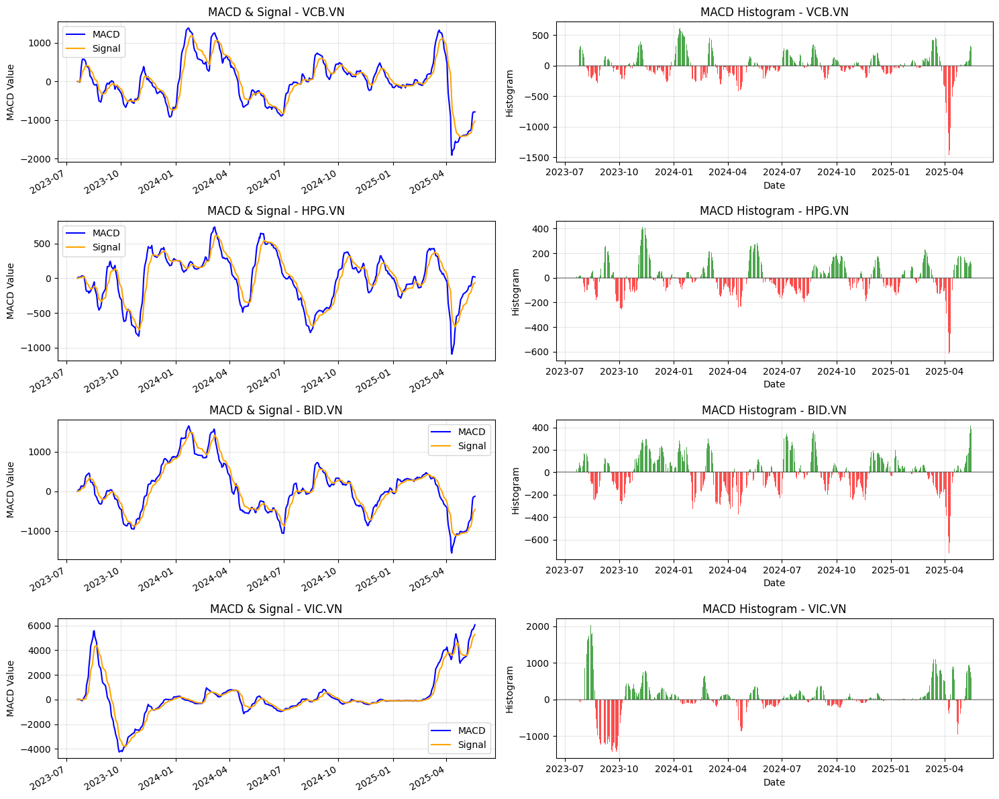

In [ ]:
for i, company in enumerate(company_list, 1):
    # --- TÍNH MACD ---
    ema12 = company['Adj Close'].ewm(span=12, adjust=False).mean()
    ema26 = company['Adj Close'].ewm(span=26, adjust=False).mean()
    company['MACD'] = ema12 - ema26
    company['Signal'] = company['MACD'].ewm(span=9, adjust=False).mean()
    company['Histogram'] = company['MACD'] - company['Signal']  # Thêm Histogram

plt.figure(figsize=(15, 12))

for i, company in enumerate(company_list, 1):
    # Subplot cho MACD và Signal
    plt.subplot(4, 2, (i-1)*2 + 1)

    company['MACD'].plot(label='MACD', color='blue', linewidth=1.5)
    company['Signal'].plot(label='Signal', color='orange', linewidth=1.5)

    plt.title(f'MACD & Signal - {tech_list[i - 1]}')
    plt.ylabel('MACD Value')
    plt.xlabel(None)
    plt.legend(loc='best')
    plt.grid(True, alpha=0.3)

    # Subplot cho Histogram
    plt.subplot(4, 2, (i-1)*2 + 2)

    # Vẽ histogram với màu sắc thể hiện động lượng
    histogram_colors = ['green' if x >= 0 else 'red' for x in company['Histogram']]
    plt.bar(company.index, company['Histogram'], color=histogram_colors, alpha=0.7, width=1)

    plt.title(f'MACD Histogram - {tech_list[i - 1]}')
    plt.ylabel('Histogram')
    plt.xlabel('Date')
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
# === PHÂN TÍCH THỐNG KÊ MACD ===

print("📊 THỐNG KÊ VÀ PHÂN TÍCH MACD")
print("=" * 50)

macd_analysis = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i - 1]
    macd_data = company['MACD'].dropna()
    signal_data = company['Signal'].dropna()
    histogram_data = company['Histogram'].dropna()

    # Thống kê hiện tại
    current_macd = macd_data.iloc[-1]
    current_signal = signal_data.iloc[-1]
    current_histogram = histogram_data.iloc[-1]

    # Xu hướng MACD
    macd_trend = "Tăng" if current_macd > macd_data.iloc[-5] else "Giảm"
    signal_trend = "Tăng" if current_signal > signal_data.iloc[-5] else "Giảm"

    # Phân tích Histogram (momentum)
    histogram_positive = len(histogram_data[histogram_data > 0])
    histogram_negative = len(histogram_data[histogram_data < 0])
    total_days = len(histogram_data)

    positive_momentum_pct = (histogram_positive / total_days) * 100
    negative_momentum_pct = (histogram_negative / total_days) * 100

    # Phân tích crossover (giao cắt MACD và Signal)
    macd_above_signal = macd_data > signal_data
    crossover_points = macd_above_signal.diff()

    bullish_crossover = len(crossover_points[crossover_points == True])   # MACD cắt lên Signal
    bearish_crossover = len(crossover_points[crossover_points == False])  # MACD cắt xuống Signal

    # Phân tích zero-line crossover
    macd_above_zero = macd_data > 0
    zero_crossover = macd_above_zero.diff()
    bullish_zero_cross = len(zero_crossover[zero_crossover == True])   # MACD cắt lên 0
    bearish_zero_cross = len(zero_crossover[zero_crossover == False])  # MACD cắt xuống 0

    # Độ mạnh của momentum (dựa vào histogram)
    avg_histogram = histogram_data.mean()
    histogram_volatility = histogram_data.std()

    # Đánh giá tình trạng hiện tại
    macd_position = "trên" if current_macd > current_signal else "dưới"
    zero_position = "trên" if current_macd > 0 else "dưới"

    # Tín hiệu chính
    if current_macd > current_signal and current_histogram > 0:
        if current_macd > 0:
            status = "🟢 TĂNG MẠNH - MACD trên Signal và trên 0"
            signal = "STRONG BUY"
        else:
            status = "🟡 Xu hướng tăng - MACD trên Signal nhưng dưới 0"
            signal = "BUY"
    elif current_macd < current_signal and current_histogram < 0:
        if current_macd < 0:
            status = "🔴 GIẢM MẠNH - MACD dưới Signal và dưới 0"
            signal = "STRONG SELL"
        else:
            status = "🟡 Xu hướng giảm - MACD dưới Signal nhưng trên 0"
            signal = "SELL"
    elif current_histogram > 0 and current_histogram > histogram_data.iloc[-2]:
        status = "🔵 Momentum tăng"
        signal = "BUY"
    elif current_histogram < 0 and current_histogram < histogram_data.iloc[-2]:
        status = "🔵 Momentum giảm"
        signal = "SELL"
    else:
        status = "⚪ Trung tính - Chờ tín hiệu rõ ràng"
        signal = "HOLD"

    # Divergence analysis (phân kỳ) - so sánh 20 ngày gần nhất
    recent_price = company['Adj Close'].tail(20)
    recent_macd = macd_data.tail(20)

    price_trend = "Tăng" if recent_price.iloc[-1] > recent_price.iloc[0] else "Giảm"
    macd_recent_trend = "Tăng" if recent_macd.iloc[-1] > recent_macd.iloc[0] else "Giảm"

    if price_trend != macd_recent_trend:
        divergence = f"⚠️  PHÂN KỲ: Giá {price_trend.lower()} nhưng MACD {macd_recent_trend.lower()}"
    else:
        divergence = "✅ Đồng thuận: Giá và MACD cùng xu hướng"

    # Strength của tín hiệu
    if abs(current_histogram) > histogram_volatility:
        strength = "Mạnh"
    elif abs(current_histogram) > histogram_volatility * 0.5:
        strength = "Vừa"
    else:
        strength = "Yếu"

    macd_analysis[company_name] = {
        'current_macd': current_macd,
        'current_signal': current_signal,
        'current_histogram': current_histogram,
        'status': status,
        'signal': signal,
        'strength': strength,
        'positive_momentum_pct': positive_momentum_pct,
        'bullish_crossover': bullish_crossover,
        'bearish_crossover': bearish_crossover,
        'divergence': divergence,
        'macd_trend': macd_trend
    }

    print(f"\n🏢 {company_name}")
    print(f"   MACD: {current_macd:.4f} ({macd_trend})")
    print(f"   Signal: {current_signal:.4f} ({signal_trend})")
    print(f"   Histogram: {current_histogram:.4f}")
    print(f"   Vị trí: MACD {macd_position} Signal, {zero_position} đường tại 0")
    print(f"   Tình trạng: {status}")
    print(f"   Tín hiệu: {signal} ({strength})")
    print(f"   {divergence}")
    print(f"   Momentum tích cực: {positive_momentum_pct:.1f}% thời gian")
    print(f"   Tín hiệu mua (crossover): {bullish_crossover} lần")
    print(f"   Tín hiệu bán (crossunder): {bearish_crossover} lần")
    print(f"   Cắt lên zero-line: {bullish_zero_cross} lần")
    print(f"   Cắt xuống zero-line: {bearish_zero_cross} lần")

# Tổng kết
print(f"\n{'='*50}")
print("📈 TỔNG KẾT MACD:")
macd_df = pd.DataFrame(macd_analysis).T

print(f"MACD cao nhất: {macd_df['current_macd'].idxmax()} ({macd_df['current_macd'].max():.4f})")
print(f"MACD thấp nhất: {macd_df['current_macd'].idxmin()} ({macd_df['current_macd'].min():.4f})")
print(f"Histogram mạnh nhất: {macd_df.loc[macd_df['current_histogram'].abs().idxmax()].name} ({macd_df['current_histogram'].abs().max():.4f})")

# Đếm tín hiệu
strong_buy = sum(1 for x in macd_analysis.values() if x['signal'] == 'STRONG BUY')
strong_sell = sum(1 for x in macd_analysis.values() if x['signal'] == 'STRONG SELL')
buy_signals = sum(1 for x in macd_analysis.values() if 'BUY' in x['signal'])
sell_signals = sum(1 for x in macd_analysis.values() if 'SELL' in x['signal'])
hold_signals = sum(1 for x in macd_analysis.values() if x['signal'] == 'HOLD')

print(f"Tín hiệu MUA MẠNH: {strong_buy} cổ phiếu")
print(f"Tín hiệu BÁN MẠNH: {strong_sell} cổ phiếu")
print(f"Tổng tín hiệu MUA: {buy_signals} cổ phiếu")
print(f"Tổng tín hiệu BÁN: {sell_signals} cổ phiếu")
print(f"Tín hiệu GIỮ: {hold_signals} cổ phiếu")

# Phân tích hiệu suất crossover
total_crossovers = sum(x['bullish_crossover'] + x['bearish_crossover'] for x in macd_analysis.values())
if total_crossovers > 0:
    bullish_rate = sum(x['bullish_crossover'] for x in macd_analysis.values()) / total_crossovers * 100
    print(f"Tỷ lệ tín hiệu tăng: {bullish_rate:.1f}%")

# Phân tích phân kỳ
divergence_count = sum(1 for x in macd_analysis.values() if "PHÂN KỲ" in x['divergence'])
print(f"Số cổ phiếu có phân kỳ: {divergence_count}/{len(macd_analysis)}")

print(f"\n💡 KHUYẾN NGHỊ TỔNG QUAN:")
if strong_buy > strong_sell:
    print("   Thị trường có xu hướng tích cực, nhiều tín hiệu mua mạnh")
elif strong_sell > strong_buy:
    print("   Thị trường có áp lực giảm, cần thận trọng")
else:
    print("   Thị trường trung tính, tín hiệu trái chiều")

📊 THỐNG KÊ VÀ PHÂN TÍCH MACD

🏢 VCB.VN
   MACD: -789.0701 (Tăng)
   Signal: -1035.1095 (Tăng)
   Histogram: 246.0395
   Vị trí: MACD trên Signal, dưới đường tại 0
   Tình trạng: 🟡 Xu hướng tăng - MACD trên Signal nhưng dưới 0
   Tín hiệu: BUY (Mạnh)
   ⚠️  PHÂN KỲ: Giá giảm nhưng MACD tăng
   Momentum tích cực: 43.8% thời gian
   Tín hiệu mua (crossover): 41 lần
   Tín hiệu bán (crossunder): 412 lần
   Cắt lên zero-line: 18 lần
   Cắt xuống zero-line: 435 lần

🏢 HPG.VN
   MACD: 16.5629 (Tăng)
   Signal: -66.6562 (Tăng)
   Histogram: 83.2191
   Vị trí: MACD trên Signal, trên đường tại 0
   Tình trạng: 🟢 TĂNG MẠNH - MACD trên Signal và trên 0
   Tín hiệu: STRONG BUY (Vừa)
   ✅ Đồng thuận: Giá và MACD cùng xu hướng
   Momentum tích cực: 45.0% thời gian
   Tín hiệu mua (crossover): 31 lần
   Tín hiệu bán (crossunder): 419 lần
   Cắt lên zero-line: 19 lần
   Cắt xuống zero-line: 431 lần

🏢 BID.VN
   MACD: -125.1100 (Tăng)
   Signal: -456.2830 (Tăng)
   Histogram: 331.1730
   Vị trí: MACD tr

In [ ]:
# === TỔNG HỢP PHÂN TÍCH TẤT CẢ CHỈ BÁO ===

print("🎯 TỔNG HỢP PHÂN TÍCH CHỈ BÁO KỸ THUẬT")
print("=" * 80)

# Tạo bảng tổng hợp tín hiệu
comprehensive_signals = {}

for company_name in tech_list:
    # Lấy tín hiệu từ các chỉ báo (giả sử các dictionary đã được tạo ở trên)
    rsi_signal = rsi_analysis.get(company_name, {}).get('signal', 'N/A')
    stoch_signal = stoch_analysis.get(company_name, {}).get('signal', 'N/A')
    wr_signal = williams_analysis.get(company_name, {}).get('signal', 'N/A')
    macd_signal = macd_analysis.get(company_name, {}).get('signal', 'N/A')

    # Chuyển đổi tín hiệu thành điểm số để tính tổng
    def signal_to_score(signal):
        if 'STRONG BUY' in signal:
            return 2
        elif 'BUY' in signal:
            return 1
        elif 'STRONG SELL' in signal:
            return -2
        elif 'SELL' in signal:
            return -1
        elif signal in ['CAUTION', 'WATCH']:
            return 0.5
        else:  # HOLD or others
            return 0

    rsi_score = signal_to_score(rsi_signal)
    stoch_score = signal_to_score(stoch_signal)
    wr_score = signal_to_score(wr_signal)
    macd_score = signal_to_score(macd_signal)

    total_score = rsi_score + stoch_score + wr_score + macd_score

    # Đánh giá tổng thể
    if total_score >= 4:
        overall_signal = "🟢 MUA MẠNH"
        confidence = "Rất cao"
    elif total_score >= 2:
        overall_signal = "🟢 MUA"
        confidence = "Cao"
    elif total_score >= 1:
        overall_signal = "🟡 MUA NHẸ"
        confidence = "Trung bình"
    elif total_score <= -4:
        overall_signal = "🔴 BÁN MẠNH"
        confidence = "Rất cao"
    elif total_score <= -2:
        overall_signal = "🔴 BÁN"
        confidence = "Cao"
    elif total_score <= -1:
        overall_signal = "🟡 BÁN NHẸ"
        confidence = "Trung bình"
    else:
        overall_signal = "⚪ GIỮ"
        confidence = "Thấp"

    # Đếm số chỉ báo đồng thuận
    buy_indicators = sum(1 for score in [rsi_score, stoch_score, wr_score, macd_score] if score > 0)
    sell_indicators = sum(1 for score in [rsi_score, stoch_score, wr_score, macd_score] if score < 0)
    neutral_indicators = sum(1 for score in [rsi_score, stoch_score, wr_score, macd_score] if score == 0)

    consensus = f"{buy_indicators}B-{sell_indicators}S-{neutral_indicators}N"

    comprehensive_signals[company_name] = {
        'rsi_signal': rsi_signal,
        'stoch_signal': stoch_signal,
        'wr_signal': wr_signal,
        'macd_signal': macd_signal,
        'total_score': total_score,
        'overall_signal': overall_signal,
        'confidence': confidence,
        'consensus': consensus,
        'buy_indicators': buy_indicators,
        'sell_indicators': sell_indicators
    }

# Hiển thị bảng tổng hợp
print(f"{'Cổ phiếu':<10} {'RSI':<12} {'Stoch':<12} {'W%R':<12} {'MACD':<12} {'Tổng':<15} {'Tin cậy':<8} {'Đồng thuận'}")
print("-" * 95)

for company_name, data in comprehensive_signals.items():
    print(f"{company_name:<10} {data['rsi_signal']:<12} {data['stoch_signal']:<12} "
          f"{data['wr_signal']:<12} {data['macd_signal']:<12} {data['overall_signal']:<15} "
          f"{data['confidence']:<8} {data['consensus']}")

# Phân tích thống kê tổng thể
print(f"\n{'='*80}")
print("📊 THỐNG KÊ TỔNG THỂ:")

# Đếm tín hiệu tổng thể
overall_buy_strong = sum(1 for x in comprehensive_signals.values() if "MUA MẠNH" in x['overall_signal'])
overall_buy = sum(1 for x in comprehensive_signals.values() if "MUA" in x['overall_signal'] and "MẠNH" not in x['overall_signal'])
overall_buy_light = sum(1 for x in comprehensive_signals.values() if "MUA NHẸ" in x['overall_signal'])
overall_sell_strong = sum(1 for x in comprehensive_signals.values() if "BÁN MẠNH" in x['overall_signal'])
overall_sell = sum(1 for x in comprehensive_signals.values() if "BÁN" in x['overall_signal'] and "MẠNH" not in x['overall_signal'])
overall_sell_light = sum(1 for x in comprehensive_signals.values() if "BÁN NHẸ" in x['overall_signal'])
overall_hold = sum(1 for x in comprehensive_signals.values() if "GIỮ" in x['overall_signal'])

print(f"🟢 MUA MẠNH: {overall_buy_strong} cổ phiếu")
print(f"🟢 MUA: {overall_buy} cổ phiếu")
print(f"🟡 MUA NHẸ: {overall_buy_light} cổ phiếu")
print(f"🔴 BÁN MẠNH: {overall_sell_strong} cổ phiếu")
print(f"🔴 BÁN: {overall_sell} cổ phiếu")
print(f"🟡 BÁN NHẸ: {overall_sell_light} cổ phiếu")
print(f"⚪ GIỮ: {overall_hold} cổ phiếu")

# Cổ phiếu có đồng thuận cao nhất
max_buy_consensus = max((x['buy_indicators'] for x in comprehensive_signals.values()), default=0)
max_sell_consensus = max((x['sell_indicators'] for x in comprehensive_signals.values()), default=0)

most_bullish = [name for name, data in comprehensive_signals.items() if data['buy_indicators'] == max_buy_consensus]
most_bearish = [name for name, data in comprehensive_signals.items() if data['sell_indicators'] == max_sell_consensus]

if max_buy_consensus > 0:
    print(f"\n🎯 Tín hiệu MUA mạnh nhất ({max_buy_consensus}/4 chỉ báo): {', '.join(most_bullish)}")
if max_sell_consensus > 0:
    print(f"🎯 Tín hiệu BÁN mạnh nhất ({max_sell_consensus}/4 chỉ báo): {', '.join(most_bearish)}")

# Phân tích mức độ đồng thuận
high_consensus_buy = sum(1 for x in comprehensive_signals.values() if x['buy_indicators'] >= 3)
high_consensus_sell = sum(1 for x in comprehensive_signals.values() if x['sell_indicators'] >= 3)
mixed_signals = sum(1 for x in comprehensive_signals.values() if x['buy_indicators'] > 0 and x['sell_indicators'] > 0)

print(f"\n📈 ĐÁNH GIÁ CHẤT LƯỢNG TÍN HIỆU:")
print(f"   Đồng thuận cao (≥3 chỉ báo) cho MUA: {high_consensus_buy} cổ phiếu")
print(f"   Đồng thuận cao (≥3 chỉ báo) cho BÁN: {high_consensus_sell} cổ phiếu")
print(f"   Tín hiệu trái chiều: {mixed_signals} cổ phiếu")

# Top picks
print(f"\n🏆 TOP PICKS:")
# Sắp xếp theo điểm số
sorted_signals = sorted(comprehensive_signals.items(), key=lambda x: x[1]['total_score'], reverse=True)

print("   TOP MUA:")
for name, data in sorted_signals[:2]:
    if data['total_score'] > 0:
        print(f"   • {name}: {data['overall_signal']} (Điểm: {data['total_score']}, Đồng thuận: {data['consensus']})")

print("   TOP BÁN:")
for name, data in sorted_signals[-2:]:
    if data['total_score'] < 0:
        print(f"   • {name}: {data['overall_signal']} (Điểm: {data['total_score']}, Đồng thuận: {data['consensus']})")

# Khuyến nghị chiến lược
total_companies = len(comprehensive_signals)
bullish_companies = overall_buy_strong + overall_buy + overall_buy_light
bearish_companies = overall_sell_strong + overall_sell + overall_sell_light

print(f"\n💡 KHUYẾN NGHỊ CHIẾN LƯỢC:")
if bullish_companies > bearish_companies:
    market_sentiment = "TÍCH CỰC"
    strategy = "Có thể tăng tỷ trọng cổ phiếu, tập trung vào những mã có tín hiệu mua mạnh"
elif bearish_companies > bullish_companies:
    market_sentiment = "TIÊU CỰC"
    strategy = "Nên thận trọng, có thể giảm tỷ trọng hoặc chờ tín hiệu tích cực hơn"
else:
    market_sentiment = "TRUNG TÍNH"
    strategy = "Thị trường đang trong giai đoạn consolidation, chờ tín hiệu rõ ràng hơn"

print(f"   Tâm lý thị trường: {market_sentiment}")
print(f"   Chiến lược: {strategy}")
print(f"   Tỷ lệ tích cực/tiêu cực: {bullish_companies}/{bearish_companies} ({bullish_companies/total_companies*100:.1f}%/{bearish_companies/total_companies*100:.1f}%)")

print(f"\n⚠️  LƯU Ý:")
print("   • Đây chỉ là phân tích kỹ thuật, cần kết hợp với phân tích cơ bản")
print("   • Quản lý rủi ro luôn là ưu tiên hàng đầu")
print("   • Không đầu tư quá 2-3% tài khoản vào một mã bất kỳ")
print("   • Luôn đặt stop-loss để bảo vệ vốn")

🎯 TỔNG HỢP PHÂN TÍCH CHỈ BÁO KỸ THUẬT
Cổ phiếu   RSI          Stoch        W%R          MACD         Tổng            Tin cậy  Đồng thuận
-----------------------------------------------------------------------------------------------
VCB.VN     WATCH        SELL         WATCH        BUY          🟡 MUA NHẸ       Trung bình 3B-1S-0N
HPG.VN     HOLD         HOLD         HOLD         STRONG BUY   🟢 MUA           Cao      1B-0S-3N
BID.VN     HOLD         HOLD         HOLD         BUY          🟡 MUA NHẸ       Trung bình 1B-0S-3N
VIC.VN     SELL         STRONG SELL  SELL         STRONG BUY   🔴 BÁN           Cao      1B-3S-0N

📊 THỐNG KÊ TỔNG THỂ:
🟢 MUA MẠNH: 0 cổ phiếu
🟢 MUA: 3 cổ phiếu
🟡 MUA NHẸ: 2 cổ phiếu
🔴 BÁN MẠNH: 0 cổ phiếu
🔴 BÁN: 1 cổ phiếu
🟡 BÁN NHẸ: 0 cổ phiếu
⚪ GIỮ: 0 cổ phiếu

🎯 Tín hiệu MUA mạnh nhất (3/4 chỉ báo): VCB.VN
🎯 Tín hiệu BÁN mạnh nhất (3/4 chỉ báo): VIC.VN

📈 ĐÁNH GIÁ CHẤT LƯỢNG TÍN HIỆU:
   Đồng thuận cao (≥3 chỉ báo) cho MUA: 1 cổ phiếu
   Đồng thuận cao (≥3 chỉ báo)

##**3.3 Volatility Analysis**

- **Bollinger Bands:** Squeeze và expansion periods
- **ATR (Average True Range):** Volatility measurement
- **Bollinger Band Width:** Volatility indicator

Bollinger

=== TÍNH TOÁN BOLLINGER BANDS VÀ PHÂN TÍCH CHUYÊN SÂNH ===

PHÂN TÍCH VCB.VN
📊 THỐNG KÊ CƠ BẢN:
   • Giá hiện tại: 57,000 VND
   • Upper Band hiện tại: 58,947 VND
   • Lower Band hiện tại: 56,203 VND
   • BB Width hiện tại: 4.76%
   • %B hiện tại: 0.29

🎯 PHÂN TÍCH VỊ TRÍ GIÁ:
   • Vị trí: TRENDING - Trong vùng xu hướng
   • Tín hiệu: 📈 Theo dõi xu hướng
   • Khoảng cách đến Upper Band: +3.4%
   • Khoảng cách đến Lower Band: -1.4%

📈 PHÂN TÍCH VOLATILITY:
   • BB Width trung bình: 6.97%
   • BB Width hiện tại: 4.76%
   • BB Width cao nhất: 27.84%
   • BB Width thấp nhất: 1.75%
   • Trạng thái volatility: BÌNH THƯỜNG

🎲 THỐNG KÊ CHẠM BANDS:
   • Số lần chạm Upper Band: 66 (16.3%)
   • Số lần chạm Lower Band: 86 (21.2%)

📊 PHÂN TÍCH XU HƯỚNG (MA20):
   • Xu hướng 20 ngày gần nhất: GIẢM (-6.8%)
   • Giá so với MA20: -1.0%

🔥 BOLLINGER SQUEEZE:
   • Không có squeeze
   • BB Width hiện tại (4.76%) > Ngưỡng squeeze (3.82%)

📈 HIỆU SUẤT THEO VÙNG:
   • Lợi nhuận trung bình sau 10 ngày khi mua

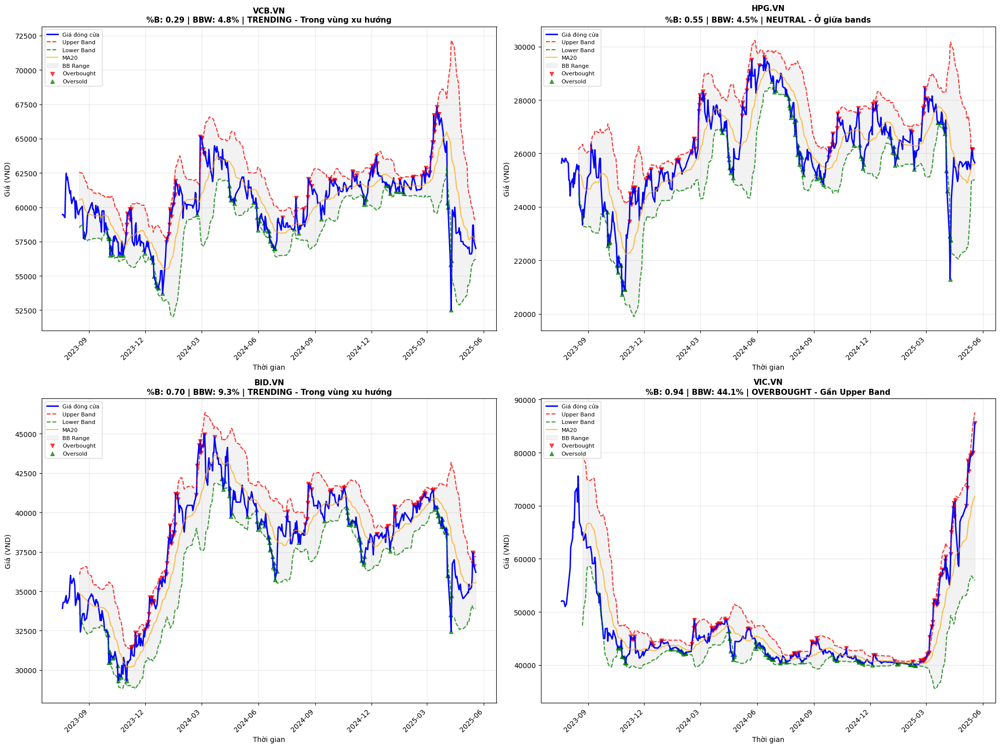

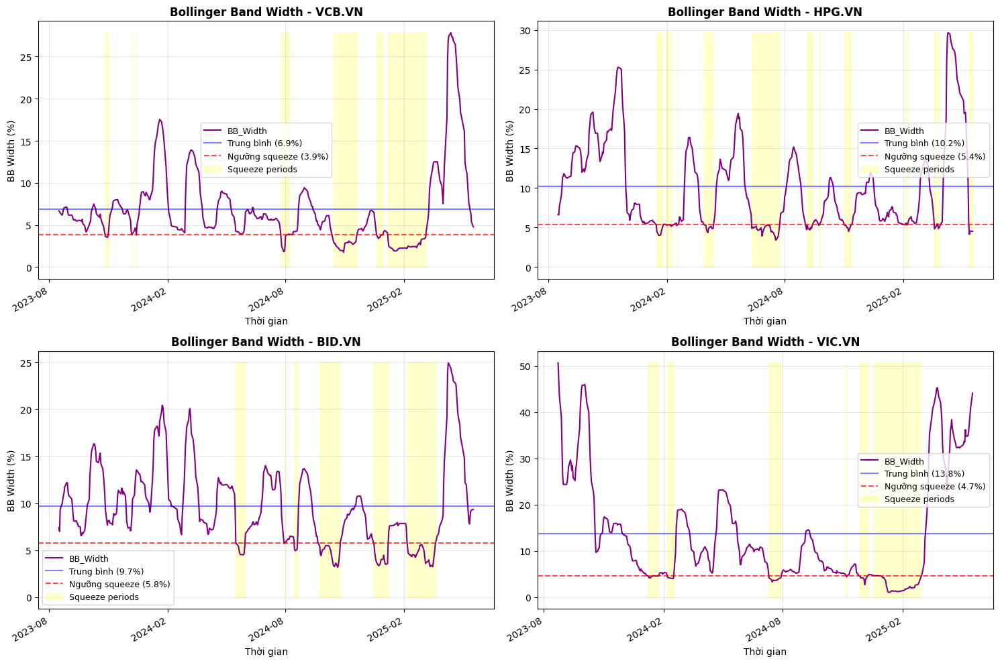


🎉 Hoàn thành phân tích Bollinger Bands chi tiết!
💡 Hãy sử dụng các insights này để đưa ra quyết định đầu tư thông minh!


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta

print("=== TÍNH TOÁN BOLLINGER BANDS VÀ PHÂN TÍCH CHUYÊN SÂNH ===")

# Dictionary để lưu trữ insights cho từng công ty
company_insights = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i-1]
    print(f"\n{'='*50}")
    print(f"PHÂN TÍCH {company_name}")
    print(f"{'='*50}")

    # Tính Bollinger Bands
    rolling_mean = company['Adj Close'].rolling(window=20).mean()
    rolling_std = company['Adj Close'].rolling(window=20).std()
    company['Bollinger_Upper'] = rolling_mean + 2 * rolling_std
    company['Bollinger_Lower'] = rolling_mean - 2 * rolling_std
    company['BB_Middle'] = rolling_mean  # Đường giữa chính là MA20

    # Tính Bollinger Band Width (indicator cho volatility)
    company['BB_Width'] = ((company['Bollinger_Upper'] - company['Bollinger_Lower']) / rolling_mean) * 100

    # Tính %B indicator (vị trí của giá trong bands)
    company['Percent_B'] = (company['Adj Close'] - company['Bollinger_Lower']) / (company['Bollinger_Upper'] - company['Bollinger_Lower'])

    # ===========================================
    # THỐNG KÊ VÀ PHÂN TÍCH CHI TIẾT
    # ===========================================

    # Lọc dữ liệu hợp lệ (không có NaN)
    valid_data = company.dropna()

    # 1. Thống kê cơ bản về Bollinger Bands
    print("📊 THỐNG KÊ CƠ BẢN:")
    print(f"   • Giá hiện tại: {valid_data['Adj Close'].iloc[-1]:,.0f} VND")
    print(f"   • Upper Band hiện tại: {valid_data['Bollinger_Upper'].iloc[-1]:,.0f} VND")
    print(f"   • Lower Band hiện tại: {valid_data['Bollinger_Lower'].iloc[-1]:,.0f} VND")
    print(f"   • BB Width hiện tại: {valid_data['BB_Width'].iloc[-1]:.2f}%")
    print(f"   • %B hiện tại: {valid_data['Percent_B'].iloc[-1]:.2f}")

    # 2. Phân tích vị trí giá so với bands
    current_price = valid_data['Adj Close'].iloc[-1]
    current_upper = valid_data['Bollinger_Upper'].iloc[-1]
    current_lower = valid_data['Bollinger_Lower'].iloc[-1]
    current_middle = valid_data['BB_Middle'].iloc[-1]
    current_percent_b = valid_data['Percent_B'].iloc[-1]

    print(f"\n🎯 PHÂN TÍCH VỊ TRÍ GIÁ:")
    if current_percent_b > 0.8:
        position_status = "OVERBOUGHT - Gần Upper Band"
        signal = "⚠️ Cảnh báo bán"
    elif current_percent_b < 0.2:
        position_status = "OVERSOLD - Gần Lower Band"
        signal = "🔥 Cơ hội mua"
    elif 0.4 <= current_percent_b <= 0.6:
        position_status = "NEUTRAL - Ở giữa bands"
        signal = "📊 Quan sát"
    else:
        position_status = "TRENDING - Trong vùng xu hướng"
        signal = "📈 Theo dõi xu hướng"

    print(f"   • Vị trí: {position_status}")
    print(f"   • Tín hiệu: {signal}")
    print(f"   • Khoảng cách đến Upper Band: {((current_upper/current_price - 1)*100):+.1f}%")
    print(f"   • Khoảng cách đến Lower Band: {((current_lower/current_price - 1)*100):+.1f}%")

    # 3. Thống kê về volatility
    print(f"\n📈 PHÂN TÍCH VOLATILITY:")
    avg_bb_width = valid_data['BB_Width'].mean()
    current_bb_width = valid_data['BB_Width'].iloc[-1]
    max_bb_width = valid_data['BB_Width'].max()
    min_bb_width = valid_data['BB_Width'].min()

    print(f"   • BB Width trung bình: {avg_bb_width:.2f}%")
    print(f"   • BB Width hiện tại: {current_bb_width:.2f}%")
    print(f"   • BB Width cao nhất: {max_bb_width:.2f}%")
    print(f"   • BB Width thấp nhất: {min_bb_width:.2f}%")

    if current_bb_width > avg_bb_width * 1.5:
        volatility_status = "CAO - Thị trường biến động mạnh"
    elif current_bb_width < avg_bb_width * 0.5:
        volatility_status = "THẤP - Thị trường ít biến động"
    else:
        volatility_status = "BÌNH THƯỜNG"

    print(f"   • Trạng thái volatility: {volatility_status}")

    # 4. Phân tích tần suất chạm bands
    upper_touches = (valid_data['Adj Close'] >= valid_data['Bollinger_Upper'] * 0.99).sum()
    lower_touches = (valid_data['Adj Close'] <= valid_data['Bollinger_Lower'] * 1.01).sum()
    total_days = len(valid_data)

    print(f"\n🎲 THỐNG KÊ CHẠM BANDS:")
    print(f"   • Số lần chạm Upper Band: {upper_touches} ({upper_touches/total_days*100:.1f}%)")
    print(f"   • Số lần chạm Lower Band: {lower_touches} ({lower_touches/total_days*100:.1f}%)")

    # 5. Phân tích xu hướng dựa trên MA20
    recent_ma = valid_data['BB_Middle'].tail(20)
    ma_trend = "TĂNG" if recent_ma.iloc[-1] > recent_ma.iloc[0] else "GIẢM"
    ma_slope = (recent_ma.iloc[-1] - recent_ma.iloc[0]) / recent_ma.iloc[0] * 100

    print(f"\n📊 PHÂN TÍCH XU HƯỚNG (MA20):")
    print(f"   • Xu hướng 20 ngày gần nhất: {ma_trend} ({ma_slope:+.1f}%)")
    print(f"   • Giá so với MA20: {((current_price/current_middle - 1)*100):+.1f}%")

    # 6. Tính toán Bollinger Squeeze (khi BB Width thấp)
    squeeze_threshold = valid_data['BB_Width'].quantile(0.2)  # 20% thấp nhất
    is_squeeze = current_bb_width <= squeeze_threshold

    print(f"\n🔥 BOLLINGER SQUEEZE:")
    if is_squeeze:
        print(f"   • ⚡ ĐANG CÓ SQUEEZE - Chuẩn bị breakout!")
        print(f"   • BB Width hiện tại ({current_bb_width:.2f}%) <= Ngưỡng squeeze ({squeeze_threshold:.2f}%)")
    else:
        print(f"   • Không có squeeze")
        print(f"   • BB Width hiện tại ({current_bb_width:.2f}%) > Ngưỡng squeeze ({squeeze_threshold:.2f}%)")

    # 7. Tính performance khi ở các vùng khác nhau
    print(f"\n📈 HIỆU SUẤT THEO VÙNG:")

    # Hiệu suất khi ở vùng oversold
    oversold_condition = valid_data['Percent_B'] < 0.2
    if oversold_condition.sum() > 0:
        oversold_data = valid_data[oversold_condition]
        oversold_future_returns = []
        for idx in oversold_data.index:
            try:
                future_idx = valid_data.index.get_loc(idx) + 10  # 10 ngày sau
                if future_idx < len(valid_data):
                    future_price = valid_data.iloc[future_idx]['Adj Close']
                    current_price_at_time = valid_data.loc[idx, 'Adj Close']
                    return_pct = (future_price / current_price_at_time - 1) * 100
                    oversold_future_returns.append(return_pct)
            except:
                continue

        if oversold_future_returns:
            avg_return_oversold = np.mean(oversold_future_returns)
            print(f"   • Lợi nhuận trung bình sau 10 ngày khi mua ở vùng oversold: {avg_return_oversold:+.1f}%")

    # Hiệu suất khi ở vùng overbought
    overbought_condition = valid_data['Percent_B'] > 0.8
    if overbought_condition.sum() > 0:
        overbought_data = valid_data[overbought_condition]
        overbought_future_returns = []
        for idx in overbought_data.index:
            try:
                future_idx = valid_data.index.get_loc(idx) + 10  # 10 ngày sau
                if future_idx < len(valid_data):
                    future_price = valid_data.iloc[future_idx]['Adj Close']
                    current_price_at_time = valid_data.loc[idx, 'Adj Close']
                    return_pct = (future_price / current_price_at_time - 1) * 100
                    overbought_future_returns.append(return_pct)
            except:
                continue

        if overbought_future_returns:
            avg_return_overbought = np.mean(overbought_future_returns)
            print(f"   • Lợi nhuận trung bình sau 10 ngày khi bán ở vùng overbought: {avg_return_overbought:+.1f}%")

    # 8. Lưu insights cho báo cáo tổng hợp
    company_insights[company_name] = {
        'current_price': current_price,
        'percent_b': current_percent_b,
        'bb_width': current_bb_width,
        'volatility_status': volatility_status,
        'position_status': position_status,
        'signal': signal,
        'ma_trend': ma_trend,
        'ma_slope': ma_slope,
        'is_squeeze': is_squeeze,
        'upper_touches': upper_touches,
        'lower_touches': lower_touches
    }

    print(f"✓ Hoàn thành phân tích {company_name}")

# ===========================================
# BÁO CÁO TỔNG HỢP
# ===========================================
print(f"\n{'='*60}")
print("📋 BÁO CÁO TỔNG HỢP BOLLINGER BANDS")
print(f"{'='*60}")

print("\n🏆 RANKING THEO TÍN HIỆU:")
buy_signals = []
sell_signals = []
squeeze_signals = []

for name, data in company_insights.items():
    if "mua" in data['signal'].lower():
        buy_signals.append(name)
    elif "bán" in data['signal'].lower():
        sell_signals.append(name)

    if data['is_squeeze']:
        squeeze_signals.append(name)

if buy_signals:
    print(f"   🔥 Cơ hội MUA: {', '.join(buy_signals)}")
if sell_signals:
    print(f"   ⚠️ Cảnh báo BÁN: {', '.join(sell_signals)}")
if squeeze_signals:
    print(f"   ⚡ Chuẩn bị BREAKOUT: {', '.join(squeeze_signals)}")

print(f"\n📊 THỐNG KÊ CHUNG:")
avg_percent_b = np.mean([data['percent_b'] for data in company_insights.values()])
avg_bb_width = np.mean([data['bb_width'] for data in company_insights.values()])

print(f"   • %B trung bình của nhóm: {avg_percent_b:.2f}")
print(f"   • BB Width trung bình của nhóm: {avg_bb_width:.2f}%")

# Tìm cổ phiếu có volatility cao nhất và thấp nhất
high_vol_stock = max(company_insights.items(), key=lambda x: x[1]['bb_width'])
low_vol_stock = min(company_insights.items(), key=lambda x: x[1]['bb_width'])

print(f"   • Volatility cao nhất: {high_vol_stock[0]} ({high_vol_stock[1]['bb_width']:.2f}%)")
print(f"   • Volatility thấp nhất: {low_vol_stock[0]} ({low_vol_stock[1]['bb_width']:.2f}%)")

print("Hoàn thành tính toán và phân tích Bollinger Bands!")

# ==================================================
# VẼ BIỂU ĐỒ BOLLINGER BANDS CẢI TIẾN
# ==================================================

plt.figure(figsize=(20, 15))

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i-1]
    insights = company_insights[company_name]

    plt.subplot(2, 2, i)

    # Vẽ giá và bands
    company['Adj Close'].plot(label='Giá đóng cửa', color='blue', linewidth=2)
    company['Bollinger_Upper'].plot(label='Upper Band', linestyle='--', color='red', alpha=0.8, linewidth=1.5)
    company['Bollinger_Lower'].plot(label='Lower Band', linestyle='--', color='green', alpha=0.8, linewidth=1.5)
    company['BB_Middle'].plot(label='MA20', color='orange', alpha=0.7, linewidth=1.5)

    # Tô màu vùng giữa các bands
    plt.fill_between(company.index, company['Bollinger_Upper'], company['Bollinger_Lower'],
                     color='grey', alpha=0.1, label='BB Range')

    # Highlight các điểm đặc biệt
    valid_data = company.dropna()

    # Đánh dấu vùng overbought
    overbought_points = valid_data[valid_data['Percent_B'] > 0.8]
    if not overbought_points.empty:
        plt.scatter(overbought_points.index, overbought_points['Adj Close'],
                   color='red', s=30, alpha=0.7, marker='v', label='Overbought')

    # Đánh dấu vùng oversold
    oversold_points = valid_data[valid_data['Percent_B'] < 0.2]
    if not oversold_points.empty:
        plt.scatter(oversold_points.index, oversold_points['Adj Close'],
                   color='green', s=30, alpha=0.7, marker='^', label='Oversold')

    # Định dạng title với thông tin insights
    title = f'{company_name}\n'
    title += f'%B: {insights["percent_b"]:.2f} | BBW: {insights["bb_width"]:.1f}% | {insights["position_status"]}'

    plt.title(title, fontsize=11, weight='bold')
    plt.xlabel('Thời gian')
    plt.ylabel('Giá (VND)')
    plt.legend(fontsize=8, loc='upper left')
    plt.grid(True, alpha=0.3)

    # Format x-axis dates
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# ==================================================
# BIỂU ĐỒ BB WIDTH (VOLATILITY ANALYSIS)
# ==================================================

plt.figure(figsize=(15, 10))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    company['BB_Width'].plot(color='purple', linewidth=1.5)

    # Thêm đường trung bình và ngưỡng squeeze
    avg_width = company['BB_Width'].mean()
    squeeze_threshold = company['BB_Width'].quantile(0.2)

    plt.axhline(y=avg_width, color='blue', linestyle='-', alpha=0.5, label=f'Trung bình ({avg_width:.1f}%)')
    plt.axhline(y=squeeze_threshold, color='red', linestyle='--', alpha=0.7, label=f'Ngưỡng squeeze ({squeeze_threshold:.1f}%)')

    # Highlight squeeze periods
    squeeze_periods = company['BB_Width'] <= squeeze_threshold
    if squeeze_periods.any():
        plt.fill_between(company.index, 0, company['BB_Width'].max(),
                        where=squeeze_periods, alpha=0.2, color='yellow',
                        label='Squeeze periods')

    plt.title(f'Bollinger Band Width - {tech_list[i-1]}', fontsize=12, weight='bold')
    plt.xlabel('Thời gian')
    plt.ylabel('BB Width (%)')
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

    # Format x-axis
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=6))

plt.tight_layout()
plt.show()

print("\n🎉 Hoàn thành phân tích Bollinger Bands chi tiết!")
print("💡 Hãy sử dụng các insights này để đưa ra quyết định đầu tư thông minh!")

ATR

=== TÍNH TOÁN ATR (AVERAGE TRUE RANGE) VÀ PHÂN TÍCH CHUYÊN SÂU ===

📊 PHÂN TÍCH ATR CHO VCB.VN
📈 THỐNG KÊ ATR CƠ BẢN:
   • ATR14 hiện tại: 1,057 VND (1.85%)
   • ATR14 trung bình: 971 VND (1.62%)
   • Độ lệch chuẩn: 383 VND
   • ATR Min: 473 VND
   • ATR Max: 3,014 VND

📊 PHÂN TÍCH XU HƯỚNG:
   • ATR 30 ngày gần nhất: 1,931 VND
   • ATR lịch sử: 901 VND
   • Thay đổi xu hướng: +114.3%
   • Đánh giá: 📈 Biến động TĂNG MẠNH (thị trường bất ổn)

🎯 PHÂN TÍCH MỨC ĐỘ BIẾN ĐỘNG:
   • ATR% Percentile 25: 1.29%
   • ATR% Percentile 75: 1.79%
   • Mức biến động hiện tại: 🔴 CAO (Rủi ro cao, cơ hội cao)

⏱️ SO SÁNH TIMEFRAME:
   • ATR7%:  2.01% (Ngắn hạn)
   • ATR14%: 1.85% (Chuẩn)
   • ATR21%: 2.15% (Dài hạn)
   • Insight: ➡️ Biến động nhất quán giữa các timeframe

🎯 MỨC GIÁ DỰ KIẾN (DỰA TRÊN ATR):
   • Giá hiện tại: 57,000 VND
   • Hỗ trợ ATR: 54,886 VND (-3.7%)
   • Kháng cự ATR: 59,114 VND (+3.7%)

⚠️ ĐÁNH GIÁ RỦI RO TRADING:
   • Với 1% risk tolerance:
     - Stop loss ATR: 1,057 VND
     - Po

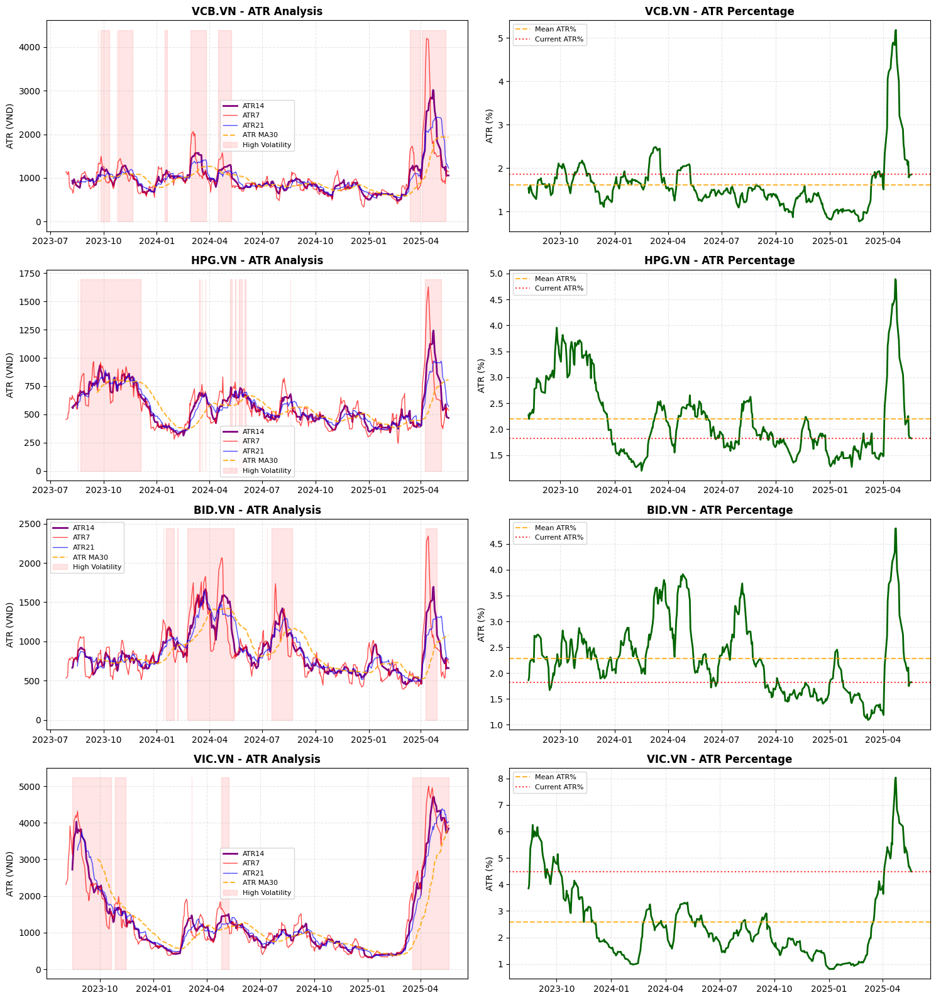

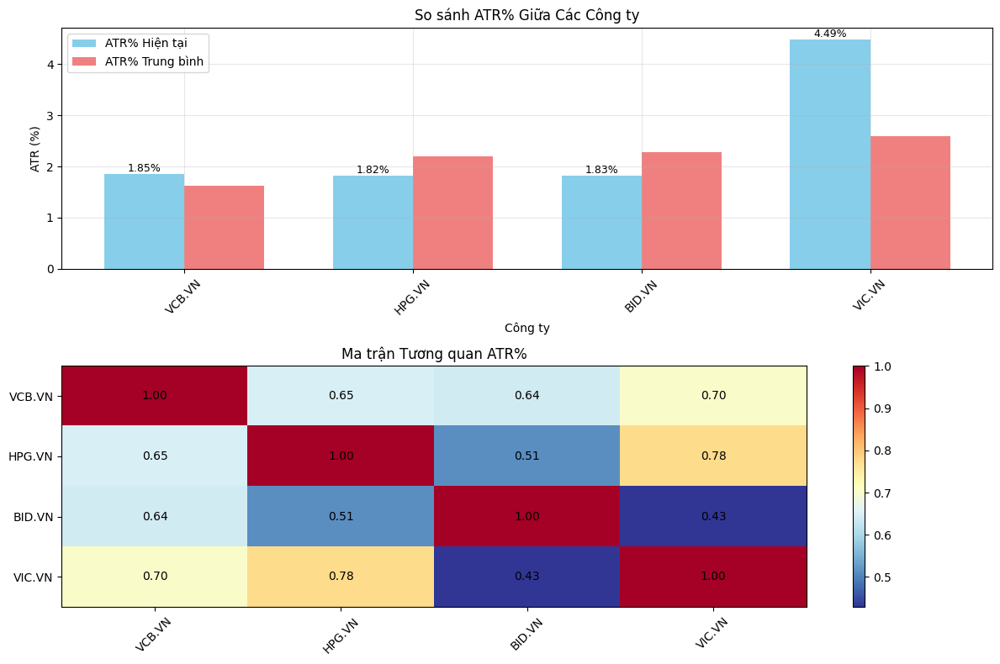

In [ ]:
import numpy as np
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

print("=== TÍNH TOÁN ATR (AVERAGE TRUE RANGE) VÀ PHÂN TÍCH CHUYÊN SÂU ===")

# Dictionary để lưu thống kê tổng hợp
atr_stats = {}

for i, company in enumerate(company_list, 1):
    company_name = tech_list[i-1]
    print(f"\n{'='*60}")
    print(f"📊 PHÂN TÍCH ATR CHO {company_name}")
    print(f"{'='*60}")

    # Tính True Range components
    company['H-L'] = company['High'] - company['Low']
    company['H-PC'] = abs(company['High'] - company['Adj Close'].shift(1))
    company['L-PC'] = abs(company['Low'] - company['Adj Close'].shift(1))

    # True Range = max của 3 components trên
    company['TR'] = company[['H-L', 'H-PC', 'L-PC']].max(axis=1)

    # ATR với window 14 ngày (standard)
    company['ATR14'] = company['TR'].rolling(window=14).mean()

    # ATR percentage (normalized by price)
    company['ATR_Pct'] = (company['ATR14'] / company['Adj Close']) * 100

    # ATR với các window khác nhau để so sánh
    company['ATR7'] = company['TR'].rolling(window=7).mean()
    company['ATR21'] = company['TR'].rolling(window=21).mean()
    company['ATR_Pct7'] = (company['ATR7'] / company['Adj Close']) * 100
    company['ATR_Pct21'] = (company['ATR21'] / company['Adj Close']) * 100

    # ===============================
    # 1. THỐNG KÊ CỦA ATR
    # ===============================
    atr_current = company['ATR14'].iloc[-1]
    atr_mean = company['ATR14'].mean()
    atr_std = company['ATR14'].std()
    atr_pct_current = company['ATR_Pct'].iloc[-1]
    atr_pct_mean = company['ATR_Pct'].mean()

    print(f"📈 THỐNG KÊ ATR CƠ BẢN:")
    print(f"   • ATR14 hiện tại: {atr_current:,.0f} VND ({atr_pct_current:.2f}%)")
    print(f"   • ATR14 trung bình: {atr_mean:,.0f} VND ({atr_pct_mean:.2f}%)")
    print(f"   • Độ lệch chuẩn: {atr_std:,.0f} VND")
    print(f"   • ATR Min: {company['ATR14'].min():,.0f} VND")
    print(f"   • ATR Max: {company['ATR14'].max():,.0f} VND")

    # ===============================
    # 2. PHÂN TÍCH XU HƯỚNG ATR
    # ===============================
    # So sánh ATR gần đây vs trung bình dài hạn
    atr_recent = company['ATR14'].tail(30).mean()  # 30 ngày gần nhất
    atr_historical = company['ATR14'].head(-30).mean()  # Trước đó

    trend_change = ((atr_recent - atr_historical) / atr_historical) * 100

    print(f"\n📊 PHÂN TÍCH XU HƯỚNG:")
    print(f"   • ATR 30 ngày gần nhất: {atr_recent:,.0f} VND")
    print(f"   • ATR lịch sử: {atr_historical:,.0f} VND")
    print(f"   • Thay đổi xu hướng: {trend_change:+.1f}%")

    if trend_change > 10:
        trend_desc = "📈 Biến động TĂNG MẠNH (thị trường bất ổn)"
    elif trend_change > 5:
        trend_desc = "📈 Biến động tăng nhẹ"
    elif trend_change < -10:
        trend_desc = "📉 Biến động GIẢM MẠNH (thị trường ổn định hơn)"
    elif trend_change < -5:
        trend_desc = "📉 Biến động giảm nhẹ"
    else:
        trend_desc = "➡️ Biến động ổn định"

    print(f"   • Đánh giá: {trend_desc}")

    # ===============================
    # 3. PHÂN TÍCH MỨC ĐỘ BIẾN ĐỘNG
    # ===============================
    # Phân loại mức độ biến động dựa trên percentile
    atr_pct_25 = np.percentile(company['ATR_Pct'].dropna(), 25)
    atr_pct_75 = np.percentile(company['ATR_Pct'].dropna(), 75)

    print(f"\n🎯 PHÂN TÍCH MỨC ĐỘ BIẾN ĐỘNG:")
    print(f"   • ATR% Percentile 25: {atr_pct_25:.2f}%")
    print(f"   • ATR% Percentile 75: {atr_pct_75:.2f}%")

    if atr_pct_current >= atr_pct_75:
        volatility_level = "🔴 CAO (Rủi ro cao, cơ hội cao)"
    elif atr_pct_current <= atr_pct_25:
        volatility_level = "🟢 THẤP (Ổn định, rủi ro thấp)"
    else:
        volatility_level = "🟡 TRUNG BÌNH (Cân bằng rủi ro-cơ hội)"

    print(f"   • Mức biến động hiện tại: {volatility_level}")

    # ===============================
    # 4. SO SÁNH TIMEFRAME KHÁC NHAU
    # ===============================
    atr7_current = company['ATR_Pct7'].iloc[-1]
    atr21_current = company['ATR_Pct21'].iloc[-1]

    print(f"\n⏱️ SO SÁNH TIMEFRAME:")
    print(f"   • ATR7%:  {atr7_current:.2f}% (Ngắn hạn)")
    print(f"   • ATR14%: {atr_pct_current:.2f}% (Chuẩn)")
    print(f"   • ATR21%: {atr21_current:.2f}% (Dài hạn)")

    # Phân tích divergence
    if atr7_current > atr21_current * 1.2:
        timeframe_insight = "⚡ Biến động tăng đột biến gần đây"
    elif atr7_current < atr21_current * 0.8:
        timeframe_insight = "🕊️ Biến động giảm, thị trường êm ả hơn"
    else:
        timeframe_insight = "➡️ Biến động nhất quán giữa các timeframe"

    print(f"   • Insight: {timeframe_insight}")

    # ===============================
    # 5. TÍNH MỨC HỖ TRỢ/KHÁNG CỰ DỰA TRÊN ATR
    # ===============================
    current_price = company['Adj Close'].iloc[-1]
    atr_support = current_price - (atr_current * 2)
    atr_resistance = current_price + (atr_current * 2)

    print(f"\n🎯 MỨC GIÁ DỰ KIẾN (DỰA TRÊN ATR):")
    print(f"   • Giá hiện tại: {current_price:,.0f} VND")
    print(f"   • Hỗ trợ ATR: {atr_support:,.0f} VND (-{((current_price-atr_support)/current_price)*100:.1f}%)")
    print(f"   • Kháng cự ATR: {atr_resistance:,.0f} VND (+{((atr_resistance-current_price)/current_price)*100:.1f}%)")

    # ===============================
    # 6. ĐÁNH GIÁ RỦI RO TRADING
    # ===============================
    risk_1_percent = current_price * 0.01  # 1% risk
    position_size_atr = risk_1_percent / atr_current

    print(f"\n⚠️ ĐÁNH GIÁ RỦI RO TRADING:")
    print(f"   • Với 1% risk tolerance:")
    print(f"     - Stop loss ATR: {atr_current:,.0f} VND")
    print(f"     - Position size tối đa: {position_size_atr:.2f} (tỷ lệ của portfolio)")

    if atr_pct_current > 3:
        risk_assessment = "🔴 RỦI RO CAO - Cần stop loss chặt"
    elif atr_pct_current < 1.5:
        risk_assessment = "🟢 RỦI RO THẤP - Có thể position size lớn hơn"
    else:
        risk_assessment = "🟡 RỦI RO TRUNG BÌNH - Position size chuẩn"

    print(f"   • Đánh giá: {risk_assessment}")

    # ===============================
    # 7. THỐNG KÊ THEO THỜI GIAN
    # ===============================
    # Tính ATR trung bình theo tháng
    company['Month'] = company.index.to_period('M')
    monthly_atr = company.groupby('Month')['ATR_Pct'].mean()

    if len(monthly_atr) >= 12:
        highest_vol_month = monthly_atr.idxmax()
        lowest_vol_month = monthly_atr.idxmin()

        print(f"\n📅 PHÂN TÍCH THEO THỜI GIAN:")
        print(f"   • Tháng biến động cao nhất: {highest_vol_month} ({monthly_atr.max():.2f}%)")
        print(f"   • Tháng biến động thấp nhất: {lowest_vol_month} ({monthly_atr.min():.2f}%)")

    # Lưu thống kê để so sánh
    atr_stats[company_name] = {
        'atr_current': atr_current,
        'atr_pct_current': atr_pct_current,
        'atr_pct_mean': atr_pct_mean,
        'trend_change': trend_change,
        'volatility_level': volatility_level,
        'risk_assessment': risk_assessment
    }

    print(f"\n✅ Hoàn thành phân tích {company_name}")

# ===============================
# 8. SO SÁNH GIỮA CÁC CÔNG TY
# ===============================
print(f"\n{'='*80}")
print("🏆 SO SÁNH ATR GIỮA CÁC CÔNG TY")
print(f"{'='*80}")

# Tạo bảng so sánh
comparison_data = []
for name, stats in atr_stats.items():
    comparison_data.append([
        name,
        f"{stats['atr_pct_current']:.2f}%",
        f"{stats['atr_pct_mean']:.2f}%",
        f"{stats['trend_change']:+.1f}%",
        stats['volatility_level'].split()[1] if len(stats['volatility_level'].split()) > 1 else "N/A"
    ])

# Sắp xếp theo ATR% hiện tại
comparison_data.sort(key=lambda x: float(x[1].replace('%', '')), reverse=True)

print(f"{'Công ty':<15} {'ATR% Hiện tại':<15} {'ATR% TB':<12} {'Xu hướng':<12} {'Mức độ':<15}")
print("-" * 75)
for row in comparison_data:
    print(f"{row[0]:<15} {row[1]:<15} {row[2]:<12} {row[3]:<12} {row[4]:<15}")

# Insights tổng quan
highest_vol = max(atr_stats.items(), key=lambda x: x[1]['atr_pct_current'])
lowest_vol = min(atr_stats.items(), key=lambda x: x[1]['atr_pct_current'])

print(f"\n🎯 INSIGHTS TỔng QUAN:")
print(f"   • Biến động cao nhất: {highest_vol[0]} ({highest_vol[1]['atr_pct_current']:.2f}%)")
print(f"   • Biến động thấp nhất: {lowest_vol[0]} ({lowest_vol[1]['atr_pct_current']:.2f}%)")

# Tính correlation giữa các ATR
print(f"\n📊 TƯƠNG QUAN BIẾN ĐỘNG:")
atr_corr_data = {}
for i, company in enumerate(company_list):
    atr_corr_data[tech_list[i]] = company['ATR_Pct'].dropna()

# Tạo DataFrame để tính correlation
import pandas as pd
atr_df = pd.DataFrame(atr_corr_data)
correlation_matrix = atr_df.corr()

print("Ma trận tương quan ATR%:")
print(correlation_matrix.round(3))

avg_correlation = correlation_matrix.values[np.triu_indices_from(correlation_matrix.values, k=1)].mean()
print(f"\nTương quan trung bình: {avg_correlation:.3f}")

if avg_correlation > 0.7:
    corr_insight = "🔴 Tương quan CAO - Các cổ phiếu có xu hướng biến động cùng chiều"
elif avg_correlation < 0.3:
    corr_insight = "🟢 Tương quan THẤP - Đa dạng hóa rủi ro tốt"
else:
    corr_insight = "🟡 Tương quan TRUNG BÌNH - Cần cân nhắc đa dạng hóa"

print(f"Đánh giá: {corr_insight}")

print(f"\n{'='*80}")
print("✅ HOÀN THÀNH PHÂN TÍCH ATR CHUYÊN SÂU!")
print(f"{'='*80}")

# ==================================================
# VẼ BIỂU ĐỒ ATR CẢI TIẾN
# ==================================================

plt.figure(figsize=(15, 16))

for i, company in enumerate(company_list, 1):
    # Subplot 1: ATR values
    ax1 = plt.subplot(4, 2, i*2-1)

    # Vẽ ATR với các timeframe khác nhau
    ax1.plot(company.index, company['ATR14'], label='ATR14', color='purple', linewidth=2)
    ax1.plot(company.index, company['ATR7'], label='ATR7', color='red', linewidth=1, alpha=0.7)
    ax1.plot(company.index, company['ATR21'], label='ATR21', color='blue', linewidth=1, alpha=0.7)

    # Thêm moving average
    atr_ma = company['ATR14'].rolling(window=30).mean()
    ax1.plot(company.index, atr_ma, label='ATR MA30', color='orange',
             linestyle='--', alpha=0.8, linewidth=1.5)

    # Highlight các vùng biến động cao
    atr_high_threshold = np.percentile(company['ATR14'].dropna(), 75)
    high_vol_periods = company['ATR14'] > atr_high_threshold
    ax1.fill_between(company.index, 0, ax1.get_ylim()[1],
                     where=high_vol_periods, alpha=0.1, color='red',
                     label='High Volatility')

    ax1.set_title(f"{tech_list[i-1]} - ATR Analysis", fontsize=12, weight='bold')
    ax1.set_ylabel('ATR (VND)', fontsize=10)
    ax1.grid(True, linestyle='--', alpha=0.3)
    ax1.legend(fontsize=8)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

    # Subplot 2: ATR Percentage
    ax2 = plt.subplot(4, 2, i*2)

    ax2.plot(company.index, company['ATR_Pct'], color='darkgreen', linewidth=2)
    ax2.axhline(y=atr_stats[tech_list[i-1]]['atr_pct_mean'],
                color='orange', linestyle='--', alpha=0.8, label='Mean ATR%')

    # Highlight current level
    ax2.axhline(y=atr_stats[tech_list[i-1]]['atr_pct_current'],
                color='red', linestyle=':', alpha=0.8, label='Current ATR%')

    ax2.set_title(f"{tech_list[i-1]} - ATR Percentage", fontsize=12, weight='bold')
    ax2.set_ylabel('ATR (%)', fontsize=10)
    ax2.grid(True, linestyle='--', alpha=0.3)
    ax2.legend(fontsize=8)
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.tight_layout()
plt.show()

# Vẽ biểu đồ so sánh
plt.figure(figsize=(12, 8))

# So sánh ATR% hiện tại
companies = list(atr_stats.keys())
current_atr_pcts = [atr_stats[company]['atr_pct_current'] for company in companies]
mean_atr_pcts = [atr_stats[company]['atr_pct_mean'] for company in companies]

x = np.arange(len(companies))
width = 0.35

plt.subplot(2, 1, 1)
bars1 = plt.bar(x - width/2, current_atr_pcts, width, label='ATR% Hiện tại', color='skyblue')
bars2 = plt.bar(x + width/2, mean_atr_pcts, width, label='ATR% Trung bình', color='lightcoral')

plt.xlabel('Công ty')
plt.ylabel('ATR (%)')
plt.title('So sánh ATR% Giữa Các Công ty')
plt.xticks(x, companies, rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)

# Thêm giá trị lên bars
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%', ha='center', va='bottom', fontsize=9)

# Biểu đồ heatmap correlation
plt.subplot(2, 1, 2)
im = plt.imshow(correlation_matrix, cmap='RdYlBu_r', aspect='auto')
plt.colorbar(im)
plt.title('Ma trận Tương quan ATR%')
plt.xticks(range(len(companies)), companies, rotation=45)
plt.yticks(range(len(companies)), companies)

# Thêm giá trị correlation
for i in range(len(companies)):
    for j in range(len(companies)):
        plt.text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}',
                ha='center', va='center', fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
print("=" * 80)
print("🎯 TỔNG KẾT PHÂN TÍCH VOLATILITY - INSIGHTS & RECOMMENDATIONS")
print("=" * 80)

# ==================================================
# 1. TỔNG HỢP DỮ LIỆU TỪ CẢ HAI PHƯƠNG PHÁP
# ==================================================

print("\n📊 I. TỔNG QUAN VOLATILITY THEO 2 PHƯƠNG PHÁP:")
print("-" * 60)

# Tạo DataFrame tổng hợp
volatility_summary = {}

for i, company_name in enumerate(tech_list):
    # Dữ liệu từ Bollinger Bands
    bb_data = company_insights[company_name]

    # Dữ liệu từ ATR
    atr_data = atr_stats[company_name]

    volatility_summary[company_name] = {
        'bb_width': bb_data['bb_width'],
        'bb_position': bb_data['percent_b'],
        'bb_signal': bb_data['signal'],
        'bb_squeeze': bb_data['is_squeeze'],
        'atr_current': atr_data['atr_pct_current'],
        'atr_trend': atr_data['trend_change'],
        'atr_level': atr_data['volatility_level'],
        'ma_trend': bb_data['ma_trend'],
        'ma_slope': bb_data['ma_slope']
    }

# In bảng tổng hợp
print(f"{'Công ty':<15} {'BB Width':<10} {'%B':<8} {'ATR%':<8} {'Vol Level':<12} {'Trend':<8}")
print("-" * 65)

for name, data in volatility_summary.items():
    bb_width_str = f"{data['bb_width']:.1f}%"
    percent_b_str = f"{data['bb_position']:.2f}"
    atr_str = f"{data['atr_current']:.2f}%"
    vol_level = data['atr_level'].split()[1] if len(data['atr_level'].split()) > 1 else "MID"
    trend = data['ma_trend']

    print(f"{name:<15} {bb_width_str:<10} {percent_b_str:<8} {atr_str:<8} {vol_level:<12} {trend:<8}")

# ==================================================
# 2. PHÂN LOẠI VÀ RANKING
# ==================================================

print(f"\n🏆 II. PHÂN LOẠI THEO MỨC ĐỘ RỦI RO:")
print("-" * 60)

# Tính composite volatility score
composite_scores = {}
for name, data in volatility_summary.items():
    # Chuẩn hóa scores (0-100)
    bb_score = min(100, data['bb_width'] * 10)  # BB Width thường 0-10%
    atr_score = min(100, data['atr_current'] * 25)  # ATR% thường 0-4%

    # Composite score (trung bình có trọng số)
    composite = (bb_score * 0.6 + atr_score * 0.4)  # BB weight cao hơn vì comprehensive hơn
    composite_scores[name] = composite

# Sắp xếp theo composite score
sorted_companies = sorted(composite_scores.items(), key=lambda x: x[1], reverse=True)

high_risk = []
medium_risk = []
low_risk = []

for name, score in sorted_companies:
    if score >= 60:
        high_risk.append((name, score))
    elif score >= 30:
        medium_risk.append((name, score))
    else:
        low_risk.append((name, score))

if high_risk:
    print("🔴 RỦI RO CAO (Score ≥ 60):")
    for name, score in high_risk:
        data = volatility_summary[name]
        print(f"   • {name}: {score:.1f} điểm")
        print(f"     - BB Width: {data['bb_width']:.1f}% | ATR: {data['atr_current']:.2f}%")
        print(f"     - Đặc điểm: Biến động mạnh, cơ hội cao nhưng rủi ro lớn")
        if data['bb_squeeze']:
            print(f"     - ⚡ CẢNH BÁO: Đang trong trạng thái squeeze - chuẩn bị breakout!")

if medium_risk:
    print("\n🟡 RỦI RO TRUNG BÌNH (Score 30-60):")
    for name, score in medium_risk:
        data = volatility_summary[name]
        print(f"   • {name}: {score:.1f} điểm")
        print(f"     - BB Width: {data['bb_width']:.1f}% | ATR: {data['atr_current']:.2f}%")
        print(f"     - Đặc điểm: Cân bằng rủi ro-lợi nhuận, phù hợp nhà đầu tư trung bình")

if low_risk:
    print("\n🟢 RỦI RO THẤP (Score < 30):")
    for name, score in low_risk:
        data = volatility_summary[name]
        print(f"   • {name}: {score:.1f} điểm")
        print(f"     - BB Width: {data['bb_width']:.1f}% | ATR: {data['atr_current']:.2f}%")
        print(f"     - Đặc điểm: Ổn định, ít biến động, phù hợp nhà đầu tư thận trọng")

# ==================================================
# 3. INSIGHTS STRATEGY
# ==================================================

print(f"\n💡 III. CHIẾN LƯỢC ĐẦU TƯ THEO VOLATILITY:")
print("-" * 60)

print("🎯 CHO NHÀ ĐẦU TƯ THẬN TRỌNG:")
conservative_picks = [name for name, score in sorted_companies if score < 30]
if conservative_picks:
    print(f"   • Lựa chọn: {', '.join(conservative_picks)}")
    print("   • Chiến lược: Dollar Cost Averaging, nắm giữ dài hạn")
    print("   • Position size: Có thể đầu tư lớn hơn do rủi ro thấp")
else:
    safest = sorted_companies[-1][0]
    print(f"   • Lựa chọn an toàn nhất: {safest}")
    print("   • Khuyến nghị: Tăng cường research trước khi đầu tư")

print("\n🎯 CHO NHÀ ĐẦU TƯ TÍCH CỰC:")
aggressive_picks = [name for name, score in sorted_companies if score >= 60]
if aggressive_picks:
    print(f"   • Lựa chọn: {', '.join(aggressive_picks)}")
    print("   • Chiến lược: Swing trading, scalping, momentum trading")
    print("   • Cảnh báo: Cần stop-loss chặt, quản lý rủi ro nghiêm ngặt")
else:
    most_volatile = sorted_companies[0][0]
    print(f"   • Lựa chọn biến động nhất: {most_volatile}")

print("\n🎯 TIMING VÀ ENTRY POINTS:")
for name, data in volatility_summary.items():
    if data['bb_squeeze']:
        print(f"   • {name}: ⚡ SQUEEZE DETECTED - Chờ breakout để entry")

    if "mua" in data['bb_signal'].lower():
        print(f"   • {name}: 🔥 Oversold signal - Cơ hội mua tốt")
    elif "bán" in data['bb_signal'].lower():
        print(f"   • {name}: ⚠️ Overbought signal - Cân nhắc chốt lời")

# ==================================================
# 4. RỦI RO VÀ CORRELATION ANALYSIS
# ==================================================

print(f"\n⚠️ IV. PHÂN TÍCH RỦI RO PORTFOLIO:")
print("-" * 60)

# Tính diversity score dựa trên sự khác biệt volatility
volatility_values = [data['atr_current'] for data in volatility_summary.values()]
diversity_score = np.std(volatility_values) / np.mean(volatility_values) * 100

print(f"📊 Diversity Score: {diversity_score:.1f}%")
if diversity_score > 30:
    diversity_assessment = "🟢 TUYỆT VỜI - Portfolio đa dạng tốt về mặt rủi ro"
elif diversity_score > 20:
    diversity_assessment = "🟡 KHÁC CÁN - Có sự đa dạng nhưng cần cải thiện"
else:
    diversity_assessment = "🔴 CẢNH BÁO - Portfolio thiếu đa dạng rủi ro"

print(f"Đánh giá: {diversity_assessment}")

# Khuyến nghị allocation
print(f"\n💰 KHUYẾN NGHỊ ALLOCATION:")
total_companies = len(volatility_summary)

if high_risk:
    print(f"   • Cổ phiếu rủi ro cao: Tối đa 20-30% portfolio")
    for name, _ in high_risk:
        suggested_weight = min(15, 30/len(high_risk))
        print(f"     - {name}: ≤ {suggested_weight:.0f}%")

if medium_risk:
    print(f"   • Cổ phiếu rủi ro trung bình: 40-60% portfolio")
    for name, _ in medium_risk:
        suggested_weight = min(25, 50/len(medium_risk))
        print(f"     - {name}: {suggested_weight:.0f}%")

if low_risk:
    print(f"   • Cổ phiếu rủi ro thấp: 30-50% portfolio")
    for name, _ in low_risk:
        suggested_weight = min(30, 40/len(low_risk))
        print(f"     - {name}: {suggested_weight:.0f}%")

# ==================================================
# 5. MARKET REGIME ANALYSIS
# ==================================================

print(f"\n🌊 V. ĐÁNH GIÁ THỊ TRƯỜNG HIỆN TẠI:")
print("-" * 60)

# Tính average volatility của cả nhóm
avg_bb_width = np.mean([data['bb_width'] for data in volatility_summary.values()])
avg_atr = np.mean([data['atr_current'] for data in volatility_summary.values()])

print(f"📈 Volatility trung bình nhóm:")
print(f"   • BB Width: {avg_bb_width:.2f}%")
print(f"   • ATR: {avg_atr:.2f}%")

# Market regime assessment
if avg_bb_width > 8 or avg_atr > 3:
    market_regime = "🔴 THỊ TRƯỜNG BIẾN ĐỘNG CAO"
    regime_advice = "Cẩn trọng, tăng cường cash, giảm leverage"
elif avg_bb_width < 4 and avg_atr < 2:
    market_regime = "🟢 THỊ TRƯỜNG ỔN ĐỊNH"
    regime_advice = "Có thể tăng position size, tìm kiếm cơ hội breakout"
else:
    market_regime = "🟡 THỊ TRƯỜNG BÌNH THƯỜNG"
    regime_advice = "Duy trì chiến lược cân bằng, theo dõi sát"

print(f"\n🎯 Đánh giá thị trường: {market_regime}")
print(f"💡 Khuyến nghị: {regime_advice}")

# Squeeze analysis cho toàn thị trường
squeeze_count = sum([1 for data in volatility_summary.values() if data['bb_squeeze']])
if squeeze_count >= len(volatility_summary) * 0.5:
    print(f"\n⚡ CẢNH BÁO ĐẶC BIỆT:")
    print(f"   • {squeeze_count}/{len(volatility_summary)} cổ phiếu đang trong trạng thái squeeze")
    print(f"   • Thị trường có thể sắp có biến động lớn!")
    print(f"   • Khuyến nghị: Chuẩn bị tâm lý cho volatility spike")

# ==================================================
# 6. KẾT LUẬN VÀ HÀNH ĐỘNG
# ==================================================

print(f"\n{'='*80}")
print("🏁 VI. KẾT LUẬN VÀ HÀNH ĐỘNG TIẾP THEO:")
print("=" * 80)

print("✅ ĐIỂM MẠNH CỦA PHÂN TÍCH:")
print("   • Sử dụng 2 phương pháp bổ trợ (Bollinger Bands + ATR)")
print("   • Phân tích đa chiều: Volatility, xu hướng, timing")
print("   • Đưa ra khuyến nghị cụ thể cho từng nhóm rủi ro")

print("\n📋 CHECKLIST TRƯỚC KHI ĐẦU TƯ:")
print("   □ Xác định khẩu vị rủi ro cá nhân")
print("   □ Thiết lập stop-loss dựa trên ATR")
print("   □ Phân bổ tỷ lệ theo khuyến nghị volatility")
print("   □ Theo dõi các tín hiệu squeeze để timing entry")
print("   □ Review lại khi market regime thay đổi")

print(f"\n🔮 THEO DÕI TIẾP THEO:")
print("   • Cập nhật phân tích volatility hàng tuần")
print("   • Báo động khi có squeeze breakout")
print("   • Điều chỉnh allocation khi volatility thay đổi đáng kể")
print("   • Backtest chiến lược trên dữ liệu lịch sử")

print(f"\n{'⭐' * 20}")
print("🎯 VOLATILITY ANALYSIS COMPLETED!")
print("💡 Hãy sử dụng những insights này để đầu tư thông minh hơn!")
print("⭐" * 20)

🎯 TỔNG KẾT PHÂN TÍCH VOLATILITY - INSIGHTS & RECOMMENDATIONS

📊 I. TỔNG QUAN VOLATILITY THEO 2 PHƯƠNG PHÁP:
------------------------------------------------------------
Công ty         BB Width   %B       ATR%     Vol Level    Trend   
-----------------------------------------------------------------
VCB.VN          4.8%       0.29     1.85%    CAO          GIẢM    
HPG.VN          4.5%       0.55     1.82%    TRUNG        GIẢM    
BID.VN          9.3%       0.70     1.83%    TRUNG        GIẢM    
VIC.VN          44.1%      0.94     4.49%    CAO          TĂNG    

🏆 II. PHÂN LOẠI THEO MỨC ĐỘ RỦI RO:
------------------------------------------------------------
🔴 RỦI RO CAO (Score ≥ 60):
   • VIC.VN: 100.0 điểm
     - BB Width: 44.1% | ATR: 4.49%
     - Đặc điểm: Biến động mạnh, cơ hội cao nhưng rủi ro lớn
   • BID.VN: 74.3 điểm
     - BB Width: 9.3% | ATR: 1.83%
     - Đặc điểm: Biến động mạnh, cơ hội cao nhưng rủi ro lớn

🟡 RỦI RO TRUNG BÌNH (Score 30-60):
   • VCB.VN: 47.1 điểm
     -

##**3.4 Volume Analysis**

- **Volume trends:** Correlation với price movements
- **OBV (On-Balance Volume):** Money flow analysis
- **Volume-Price Trend (VPT)**
- **Accumulation/Distribution Line**

In [ ]:
# ====================================================================
# Hàm tính toán các chỉ số volume
def calculate_obv(df):
    """Tính On-Balance Volume"""
    obv = []
    obv.append(0)

    for i in range(1, len(df)):
        if df['Adj Close'].iloc[i] > df['Adj Close'].iloc[i-1]:
            obv.append(obv[-1] + df['Volume'].iloc[i])
        elif df['Adj Close'].iloc[i] < df['Adj Close'].iloc[i-1]:
            obv.append(obv[-1] - df['Volume'].iloc[i])
        else:
            obv.append(obv[-1])

    return pd.Series(obv, index=df.index)

def calculate_vpt(df):
    """Tính Volume-Price Trend"""
    vpt = []
    vpt.append(0)

    for i in range(1, len(df)):
        price_change = (df['Adj Close'].iloc[i] - df['Adj Close'].iloc[i-1]) / df['Adj Close'].iloc[i-1]
        vpt.append(vpt[-1] + df['Volume'].iloc[i] * price_change)

    return pd.Series(vpt, index=df.index)

def calculate_ad_line(df):
    """Tính Accumulation/Distribution Line"""
    ad_line = []

    for i in range(len(df)):
        high = df['High'].iloc[i]
        low = df['Low'].iloc[i]
        close = df['Adj Close'].iloc[i]
        volume = df['Volume'].iloc[i]

        if high != low:
            money_flow_multiplier = ((close - low) - (high - close)) / (high - low)
        else:
            money_flow_multiplier = 0

        money_flow_volume = money_flow_multiplier * volume

        if i == 0:
            ad_line.append(money_flow_volume)
        else:
            ad_line.append(ad_line[-1] + money_flow_volume)

    return pd.Series(ad_line, index=df.index)

In [ ]:
# ====================================================================
# Tính toán các chỉ số volume cho tất cả công ty
print("Đang tính toán các chỉ số volume...")

for i, company in enumerate(company_list):
    company_name = tech_list[i]
    print(f"Tính toán cho {company_name}...")

    # Tính các chỉ số
    company['OBV'] = calculate_obv(company)
    company['VPT'] = calculate_vpt(company)
    company['AD_Line'] = calculate_ad_line(company)

    # Tính correlation giữa Volume và Price
    vol_price_corr = company['Volume'].corr(company['Adj Close'])
    print(f"  - Volume-Price Correlation: {vol_price_corr:.4f}")

print("Hoàn thành tính toán!")

Đang tính toán các chỉ số volume...
Tính toán cho VCB.VN...
  - Volume-Price Correlation: -0.0241
Tính toán cho HPG.VN...
  - Volume-Price Correlation: -0.0506
Tính toán cho BID.VN...
  - Volume-Price Correlation: 0.2781
Tính toán cho VIC.VN...
  - Volume-Price Correlation: 0.5167
Hoàn thành tính toán!


***Volume of Sales***

Volume is the amount of an asset or security that changes hands over some period of time, often over the course of a day. For instance, the stock trading volume would refer to the number of shares of security traded between its daily open and close. Trading volume, and changes to volume over the course of time, are important inputs for technical traders.

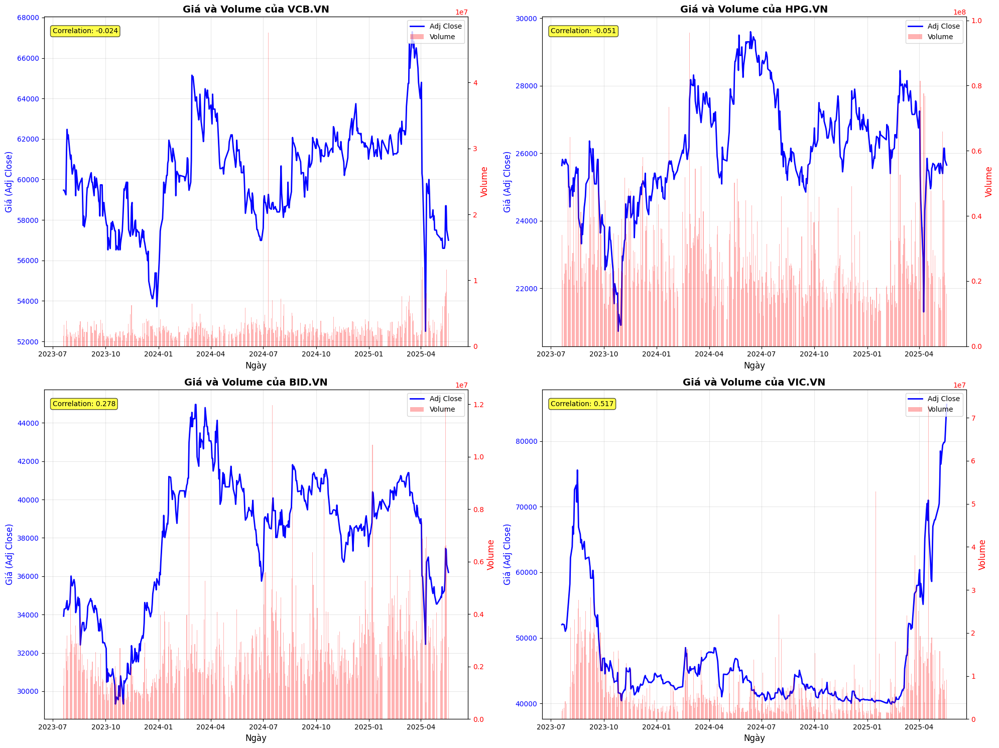

In [ ]:
# Tạo biểu đồ kết hợp giá và volume
plt.figure(figsize=(20, 15))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Vẽ giá
    line1 = ax1.plot(company.index, company['Adj Close'],
                     color='blue', linewidth=2, label='Adj Close')
    ax1.set_ylabel('Giá (Adj Close)', color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, alpha=0.3)

    # Vẽ volume
    bars = ax2.bar(company.index, company['Volume'],
                   alpha=0.3, color='red', width=1, label='Volume')
    ax2.set_ylabel('Volume', color='red', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='red')

    # Tiêu đề và label
    plt.title(f"Giá và Volume của {tech_list[i - 1]}", fontsize=14, fontweight='bold')
    ax1.set_xlabel('Ngày', fontsize=12)

    # Xoay label trục x
    plt.xticks(rotation=45)

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # Thêm correlation vào title
    vol_price_corr = company['Volume'].corr(company['Adj Close'])
    ax1.text(0.02, 0.95, f'Correlation: {vol_price_corr:.3f}',
             transform=ax1.transAxes, bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

plt.tight_layout()
plt.show()

OBV

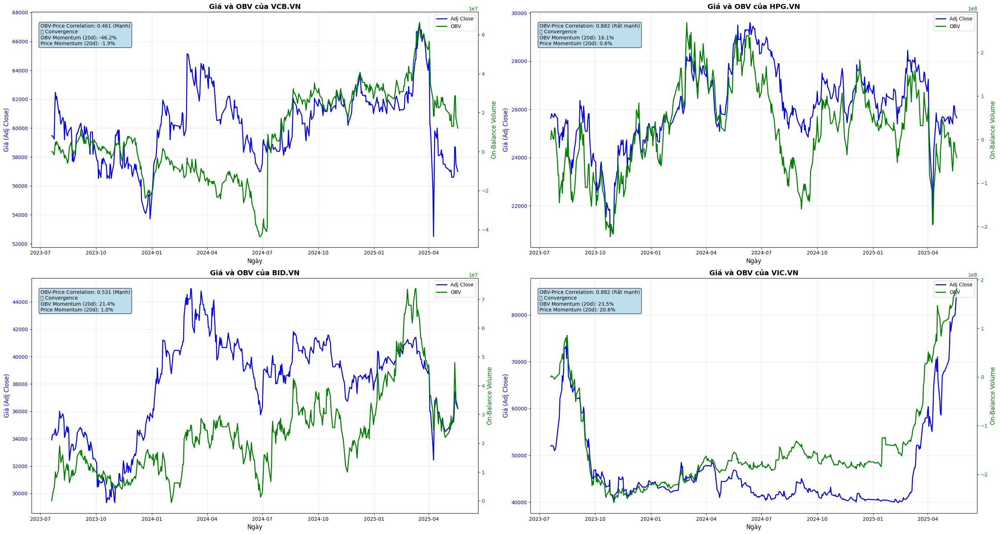

📊 BÁO CÁO PHÂN TÍCH ON-BALANCE VOLUME (OBV)

🔍 TỔNG QUAN:
--------------------------------------------------
✅ VIC.VN    : Correlation = 0.882 (Rất mạnh)
✅ HPG.VN    : Correlation = 0.882 (Rất mạnh)
✅ BID.VN    : Correlation = 0.531 (Mạnh)
⚠️ VCB.VN    : Correlation = 0.461 (Mạnh)

📈 PHÂN TÍCH CHI TIẾT:
--------------------------------------------------

🏢 VCB.VN:
   • Mối tương quan OBV-Price: 0.461 (Mạnh)
   • Tín hiệu phân kỳ: ✅ Convergence
   • Momentum OBV (20 ngày): -46.2%
   • Momentum Giá (20 ngày): -1.9%
   • Xu hướng tổng thể: Giá Tăng, OBV Tăng
   • Độ biến động hàng năm: 0.2%

🏢 HPG.VN:
   • Mối tương quan OBV-Price: 0.882 (Rất mạnh)
   • Tín hiệu phân kỳ: ✅ Convergence
   • Momentum OBV (20 ngày): 16.1%
   • Momentum Giá (20 ngày): 0.6%
   • Xu hướng tổng thể: Giá Tăng, OBV Tăng
   • Độ biến động hàng năm: 0.3%

🏢 BID.VN:
   • Mối tương quan OBV-Price: 0.531 (Mạnh)
   • Tín hiệu phân kỳ: ✅ Convergence
   • Momentum OBV (20 ngày): 21.4%
   • Momentum Giá (20 ngày): 1.0%
   

In [ ]:
# Biểu đồ On-Balance Volume (OBV) với Phân tích và Insights
import numpy as np
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(28, 15))

# Dictionary để lưu insights cho mỗi công ty
company_insights = {}

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    company_name = tech_list[i - 1]

    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Vẽ giá
    line1 = ax1.plot(company.index, company['Adj Close'],
                     color='blue', linewidth=2, label='Adj Close')
    ax1.set_ylabel('Giá (Adj Close)', color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, alpha=0.3)

    # Vẽ OBV
    line2 = ax2.plot(company.index, company['OBV'],
                     color='green', linewidth=2, label='OBV')
    ax2.set_ylabel('On-Balance Volume', color='green', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='green')

    # Tiêu đề
    plt.title(f"Giá và OBV của {company_name}", fontsize=14, fontweight='bold')
    ax1.set_xlabel('Ngày', fontsize=12)
    plt.xticks(rotation=45)

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # =================== PHÂN TÍCH VÀ INSIGHTS ===================

    # 1. Tính correlation
    obv_price_corr = company['OBV'].corr(company['Adj Close'])

    # 2. Phân tích trend OBV và Price
    price_trend = np.polyfit(range(len(company)), company['Adj Close'], 1)[0]
    obv_trend = np.polyfit(range(len(company)), company['OBV'], 1)[0]

    # 3. Tính volatility
    price_volatility = company['Adj Close'].pct_change().std() * np.sqrt(252)  # Annualized

    # 4. Phát hiện divergence (phân kỳ)
    # Tính moving averages cho smooth trend
    price_ma = company['Adj Close'].rolling(window=20).mean()
    obv_ma = company['OBV'].rolling(window=20).mean()

    # Tính correlation của trends gần đây (3 tháng cuối)
    recent_period = min(60, len(company) // 4)  # 3 tháng hoặc 1/4 dữ liệu
    recent_price_trend = np.polyfit(range(recent_period),
                                   company['Adj Close'].iloc[-recent_period:], 1)[0]
    recent_obv_trend = np.polyfit(range(recent_period),
                                 company['OBV'].iloc[-recent_period:], 1)[0]

    # Phát hiện divergence
    divergence_signal = ""
    if recent_price_trend > 0 and recent_obv_trend < 0:
        divergence_signal = "⚠️ Bearish Divergence"
    elif recent_price_trend < 0 and recent_obv_trend > 0:
        divergence_signal = "📈 Bullish Divergence"
    else:
        divergence_signal = "✅ Convergence"

    # 5. Volume strength analysis
    obv_momentum = (company['OBV'].iloc[-1] - company['OBV'].iloc[-20]) / company['OBV'].iloc[-20] * 100
    price_momentum = (company['Adj Close'].iloc[-1] - company['Adj Close'].iloc[-20]) / company['Adj Close'].iloc[-20] * 100

    # 6. Trend classification
    def classify_correlation(corr):
        if corr > 0.7:
            return "Rất mạnh", "darkgreen"
        elif corr > 0.4:
            return "Mạnh", "green"
        elif corr > 0.1:
            return "Yếu", "orange"
        elif corr > -0.1:
            return "Không có", "gray"
        else:
            return "Nghịch", "red"

    corr_strength, corr_color = classify_correlation(obv_price_corr)

    # Hiển thị thông tin trên biểu đồ
    info_text = f"""OBV-Price Correlation: {obv_price_corr:.3f} ({corr_strength})
{divergence_signal}
OBV Momentum (20d): {obv_momentum:.1f}%
Price Momentum (20d): {price_momentum:.1f}%"""

    ax1.text(0.02, 0.95, info_text,
             transform=ax1.transAxes,
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.8),
             verticalalignment='top', fontsize=10)

    # Lưu insights cho báo cáo tổng hợp
    company_insights[company_name] = {
        'correlation': obv_price_corr,
        'correlation_strength': corr_strength,
        'divergence': divergence_signal,
        'obv_momentum': obv_momentum,
        'price_momentum': price_momentum,
        'price_trend': 'Tăng' if price_trend > 0 else 'Giảm',
        'obv_trend': 'Tăng' if obv_trend > 0 else 'Giảm',
        'volatility': price_volatility
    }

plt.tight_layout()
plt.show()

# =================== BÁO CÁO INSIGHTS TỔNG HỢP ===================
print("="*80)
print("📊 BÁO CÁO PHÂN TÍCH ON-BALANCE VOLUME (OBV)")
print("="*80)

# Sắp xếp theo correlation để phân tích
sorted_companies = sorted(company_insights.items(),
                         key=lambda x: x[1]['correlation'], reverse=True)

print("\n🔍 TỔNG QUAN:")
print("-" * 50)
for company, data in sorted_companies:
    status = "✅" if data['correlation'] > 0.5 else "⚠️" if data['correlation'] > 0 else "❌"
    print(f"{status} {company:<10}: Correlation = {data['correlation']:.3f} ({data['correlation_strength']})")

print("\n📈 PHÂN TÍCH CHI TIẾT:")
print("-" * 50)

for company, data in company_insights.items():
    print(f"\n🏢 {company.upper()}:")
    print(f"   • Mối tương quan OBV-Price: {data['correlation']:.3f} ({data['correlation_strength']})")
    print(f"   • Tín hiệu phân kỳ: {data['divergence']}")
    print(f"   • Momentum OBV (20 ngày): {data['obv_momentum']:.1f}%")
    print(f"   • Momentum Giá (20 ngày): {data['price_momentum']:.1f}%")
    print(f"   • Xu hướng tổng thể: Giá {data['price_trend']}, OBV {data['obv_trend']}")
    print(f"   • Độ biến động hàng năm: {data['volatility']:.1f}%")

print("\n💡 NHẬN ĐỊNH VÀ KHUYẾN NGHỊ:")
print("-" * 50)

# Tìm công ty có correlation cao nhất và thấp nhất
best_corr_company = max(company_insights.items(), key=lambda x: x[1]['correlation'])
worst_corr_company = min(company_insights.items(), key=lambda x: x[1]['correlation'])

print(f"🥇 Tương quan mạnh nhất: {best_corr_company[0]} ({best_corr_company[1]['correlation']:.3f})")
print("   → OBV là chỉ báo đáng tin cậy cho xu hướng giá")
print("   → Volume hỗ trợ tốt cho các chuyển động giá")

print(f"\n🔴 Tương quan yếu nhất: {worst_corr_company[0]} ({worst_corr_company[1]['correlation']:.3f})")
print("   → Cần thận trọng khi sử dụng OBV làm chỉ báo")
print("   → Có thể có các yếu tố khác ảnh hưởng mạnh đến giá")

# Phân tích divergence
divergence_companies = [name for name, data in company_insights.items()
                       if 'Divergence' in data['divergence']]

if divergence_companies:
    print(f"\n⚠️  Phát hiện phân kỳ tại: {', '.join(divergence_companies)}")
    print("   → Có thể báo hiệu sự thay đổi xu hướng sắp tới")
    print("   → Cần theo dõi kỹ trong thời gian tới")

# Momentum analysis
strong_momentum = [(name, data) for name, data in company_insights.items()
                  if abs(data['obv_momentum']) > 10]

if strong_momentum:
    print(f"\n🚀 Momentum OBV mạnh (>10%):")
    for name, data in strong_momentum:
        direction = "tăng" if data['obv_momentum'] > 0 else "giảm"
        print(f"   • {name}: OBV {direction} {abs(data['obv_momentum']):.1f}% trong 20 ngày qua")

print("\n📋 KẾT LUẬN:")
print("-" * 50)
print("• OBV là công cụ hữu ích để xác nhận xu hướng giá thông qua volume")
print("• Correlation cao (>0.5) cho thấy volume hỗ trợ tốt cho chuyển động giá")
print("• Phân kỳ giữa OBV và giá có thể báo hiệu thay đổi xu hướng")
print("• Nên kết hợp OBV với các chỉ báo kỹ thuật khác để đưa ra quyết định đầu tư")

print("\n" + "="*80)

VPT

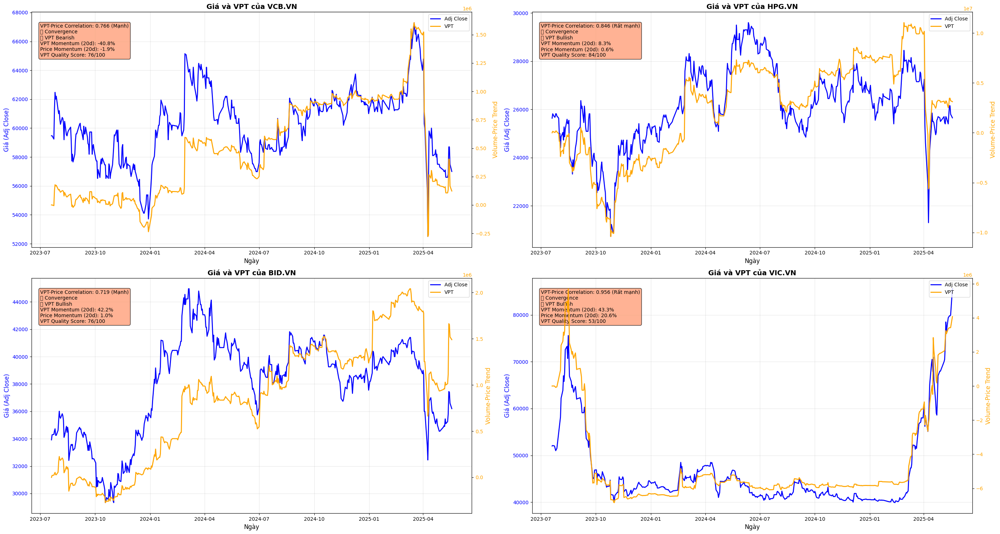

📊 BÁO CÁO PHÂN TÍCH VOLUME-PRICE TREND (VPT)

🏆 XẾP HẠNG CHẤT LƯỢNG VPT:
--------------------------------------------------
1. HPG.VN    : 84/100 🥇 Xuất sắc
2. VCB.VN    : 76/100 🥈 Tốt
3. BID.VN    : 76/100 🥈 Tốt
4. VIC.VN    : 53/100 🥉 Khá

🔍 TỔNG QUAN CORRELATION:
--------------------------------------------------
✅ VIC.VN    : 0.956 (Rất mạnh)
✅ HPG.VN    : 0.846 (Rất mạnh)
✅ VCB.VN    : 0.766 (Mạnh)
✅ BID.VN    : 0.719 (Mạnh)

📈 PHÂN TÍCH CHI TIẾT VPT:
--------------------------------------------------

🏢 VCB.VN:
   • Correlation VPT-Price: 0.766 (Mạnh)
   • Tín hiệu phân kỳ: ✅ Convergence
   • Tín hiệu VPT hiện tại: 📉 VPT Bearish
   • Momentum VPT (20 ngày): -40.8%
   • Momentum Giá (20 ngày): -1.9%
   • Xu hướng: Giá Tăng, VPT Tăng
   • Độ biến động: Giá 0.2%, VPT nan%
   • Hiệu quả Volume-Price: 0.285
   • Điểm chất lượng VPT: 76/100

🏢 HPG.VN:
   • Correlation VPT-Price: 0.846 (Rất mạnh)
   • Tín hiệu phân kỳ: ✅ Convergence
   • Tín hiệu VPT hiện tại: 📈 VPT Bullish
   • Momentu

In [ ]:
# Biểu đồ Volume-Price Trend (VPT) với Phân tích và Insights
import numpy as np
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(28, 15))

# Dictionary để lưu insights cho mỗi công ty
vpt_insights = {}

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    company_name = tech_list[i - 1]

    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Vẽ giá
    line1 = ax1.plot(company.index, company['Adj Close'],
                     color='blue', linewidth=2, label='Adj Close')
    ax1.set_ylabel('Giá (Adj Close)', color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, alpha=0.3)

    # Vẽ VPT
    line2 = ax2.plot(company.index, company['VPT'],
                     color='orange', linewidth=2, label='VPT')
    ax2.set_ylabel('Volume-Price Trend', color='orange', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='orange')

    # Tiêu đề
    plt.title(f"Giá và VPT của {company_name}", fontsize=14, fontweight='bold')
    ax1.set_xlabel('Ngày', fontsize=12)
    plt.xticks(rotation=45)

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # =================== PHÂN TÍCH VÀ INSIGHTS VPT ===================

    # 1. Tính correlation
    vpt_price_corr = company['VPT'].corr(company['Adj Close'])

    # 2. Phân tích trend VPT và Price
    price_trend = np.polyfit(range(len(company)), company['Adj Close'], 1)[0]
    vpt_trend = np.polyfit(range(len(company)), company['VPT'], 1)[0]

    # 3. Tính volatility và VPT sensitivity
    price_volatility = company['Adj Close'].pct_change().std() * np.sqrt(252)
    vpt_volatility = company['VPT'].pct_change().std() * np.sqrt(252)

    # 4. Phát hiện VPT divergence (phân kỳ)
    # Tính trends gần đây (3 tháng cuối)
    recent_period = min(60, len(company) // 4)
    recent_price_trend = np.polyfit(range(recent_period),
                                   company['Adj Close'].iloc[-recent_period:], 1)[0]
    recent_vpt_trend = np.polyfit(range(recent_period),
                                 company['VPT'].iloc[-recent_period:], 1)[0]

    # Phát hiện divergence
    divergence_signal = ""
    divergence_strength = abs(recent_price_trend) + abs(recent_vpt_trend)

    if recent_price_trend > 0 and recent_vpt_trend < 0:
        divergence_signal = "🔴 Bearish Divergence"
    elif recent_price_trend < 0 and recent_vpt_trend > 0:
        divergence_signal = "🟢 Bullish Divergence"
    elif abs(recent_price_trend) < 0.001 and abs(recent_vpt_trend) < 0.001:
        divergence_signal = "😴 Sideways Trend"
    else:
        divergence_signal = "✅ Convergence"

    # 5. VPT momentum analysis
    vpt_momentum = (company['VPT'].iloc[-1] - company['VPT'].iloc[-20]) / abs(company['VPT'].iloc[-20]) * 100 if company['VPT'].iloc[-20] != 0 else 0
    price_momentum = (company['Adj Close'].iloc[-1] - company['Adj Close'].iloc[-20]) / company['Adj Close'].iloc[-20] * 100

    # 6. VPT trend strength
    vpt_trend_strength = abs(vpt_trend) / (company['VPT'].std() / len(company))

    # 7. Volume-Price efficiency
    # Đo lường mức độ hiệu quả của volume trong việc di chuyển giá
    price_changes = company['Adj Close'].pct_change().abs()
    volume_normalized = company['Volume'] / company['Volume'].rolling(20).mean()
    efficiency_score = price_changes.corr(volume_normalized)

    # 8. VPT reversal signals
    vpt_ma_short = company['VPT'].rolling(window=10).mean()
    vpt_ma_long = company['VPT'].rolling(window=30).mean()

    current_vpt_signal = ""
    if vpt_ma_short.iloc[-1] > vpt_ma_long.iloc[-1]:
        current_vpt_signal = "📈 VPT Bullish"
    elif vpt_ma_short.iloc[-1] < vpt_ma_long.iloc[-1]:
        current_vpt_signal = "📉 VPT Bearish"
    else:
        current_vpt_signal = "➡️ VPT Neutral"

    # 9. Correlation classification
    def classify_vpt_correlation(corr):
        if corr > 0.8:
            return "Rất mạnh", "darkgreen"
        elif corr > 0.6:
            return "Mạnh", "green"
        elif corr > 0.3:
            return "Trung bình", "orange"
        elif corr > 0:
            return "Yếu", "red"
        else:
            return "Nghịch", "darkred"

    corr_strength, corr_color = classify_vpt_correlation(vpt_price_corr)

    # 10. VPT quality score (0-100)
    quality_score = (
        (min(abs(vpt_price_corr), 1.0) * 40) +  # Correlation weight 40%
        (min(vpt_trend_strength, 1.0) * 30) +   # Trend strength weight 30%
        (min(abs(efficiency_score), 1.0) * 20) + # Efficiency weight 20%
        (10 if 'Convergence' in divergence_signal else 5)  # Stability weight 10%
    )

    # Hiển thị thông tin trên biểu đồ
    info_text = f"""VPT-Price Correlation: {vpt_price_corr:.3f} ({corr_strength})
{divergence_signal}
{current_vpt_signal}
VPT Momentum (20d): {vpt_momentum:.1f}%
Price Momentum (20d): {price_momentum:.1f}%
VPT Quality Score: {quality_score:.0f}/100"""

    ax1.text(0.02, 0.95, info_text,
             transform=ax1.transAxes,
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightsalmon", alpha=0.8),
             verticalalignment='top', fontsize=10)

    # Lưu insights cho báo cáo tổng hợp
    vpt_insights[company_name] = {
        'correlation': vpt_price_corr,
        'correlation_strength': corr_strength,
        'divergence': divergence_signal,
        'vpt_momentum': vpt_momentum,
        'price_momentum': price_momentum,
        'price_trend': 'Tăng' if price_trend > 0 else 'Giảm',
        'vpt_trend': 'Tăng' if vpt_trend > 0 else 'Giảm',
        'volatility': price_volatility,
        'vpt_volatility': vpt_volatility,
        'trend_strength': vpt_trend_strength,
        'efficiency_score': efficiency_score,
        'vpt_signal': current_vpt_signal,
        'quality_score': quality_score
    }

plt.tight_layout()
plt.show()

# =================== BÁO CÁO VPT INSIGHTS TỔNG HỢP ===================
print("="*80)
print("📊 BÁO CÁO PHÂN TÍCH VOLUME-PRICE TREND (VPT)")
print("="*80)

# Sắp xếp theo quality score để phân tích
sorted_companies = sorted(vpt_insights.items(),
                         key=lambda x: x[1]['quality_score'], reverse=True)

print("\n🏆 XẾP HẠNG CHẤT LƯỢNG VPT:")
print("-" * 50)
for i, (company, data) in enumerate(sorted_companies, 1):
    score = data['quality_score']
    if score >= 80:
        grade = "🥇 Xuất sắc"
    elif score >= 65:
        grade = "🥈 Tốt"
    elif score >= 50:
        grade = "🥉 Khá"
    else:
        grade = "⚠️ Cần cải thiện"

    print(f"{i}. {company:<10}: {score:.0f}/100 {grade}")

print("\n🔍 TỔNG QUAN CORRELATION:")
print("-" * 50)
corr_sorted = sorted(vpt_insights.items(), key=lambda x: x[1]['correlation'], reverse=True)
for company, data in corr_sorted:
    status = "✅" if data['correlation'] > 0.6 else "⚠️" if data['correlation'] > 0.3 else "❌"
    print(f"{status} {company:<10}: {data['correlation']:.3f} ({data['correlation_strength']})")

print("\n📈 PHÂN TÍCH CHI TIẾT VPT:")
print("-" * 50)

for company, data in vpt_insights.items():
    print(f"\n🏢 {company.upper()}:")
    print(f"   • Correlation VPT-Price: {data['correlation']:.3f} ({data['correlation_strength']})")
    print(f"   • Tín hiệu phân kỳ: {data['divergence']}")
    print(f"   • Tín hiệu VPT hiện tại: {data['vpt_signal']}")
    print(f"   • Momentum VPT (20 ngày): {data['vpt_momentum']:.1f}%")
    print(f"   • Momentum Giá (20 ngày): {data['price_momentum']:.1f}%")
    print(f"   • Xu hướng: Giá {data['price_trend']}, VPT {data['vpt_trend']}")
    print(f"   • Độ biến động: Giá {data['volatility']:.1f}%, VPT {data['vpt_volatility']:.1f}%")
    print(f"   • Hiệu quả Volume-Price: {data['efficiency_score']:.3f}")
    print(f"   • Điểm chất lượng VPT: {data['quality_score']:.0f}/100")

print("\n💡 NHẬN ĐỊNH VÀ KHUYẾN NGHỊ VPT:")
print("-" * 50)

# Tìm công ty có VPT tốt nhất và tệ nhất
best_vpt_company = max(vpt_insights.items(), key=lambda x: x[1]['quality_score'])
worst_vpt_company = min(vpt_insights.items(), key=lambda x: x[1]['quality_score'])

print(f"🥇 VPT chất lượng cao nhất: {best_vpt_company[0]} (Điểm: {best_vpt_company[1]['quality_score']:.0f}/100)")
print("   → VPT đáng tin cậy, phản ánh tốt mối quan hệ volume-price")
print("   → Có thể sử dụng làm công cụ xác nhận xu hướng chính")

print(f"\n🔴 VPT cần cải thiện: {worst_vpt_company[0]} (Điểm: {worst_vpt_company[1]['quality_score']:.0f}/100)")
print("   → VPT không ổn định, cần kết hợp với chỉ báo khác")
print("   → Có thể bị ảnh hưởng bởi các yếu tố bên ngoài")

# Phân tích divergence signals
divergence_analysis = {}
for company, data in vpt_insights.items():
    div_type = data['divergence']
    if div_type not in divergence_analysis:
        divergence_analysis[div_type] = []
    divergence_analysis[div_type].append(company)

print(f"\n⚠️ PHÂN TÍCH TÍN HIỆU PHÂN KỲ:")
for signal, companies in divergence_analysis.items():
    print(f"   • {signal}: {', '.join(companies)}")
    if 'Bullish' in signal:
        print("     → Có thể báo hiệu đáy thị trường, cơ hội mua vào")
    elif 'Bearish' in signal:
        print("     → Cảnh báo đỉnh thị trường, cân nhắc bán ra")

# Momentum analysis
strong_vpt_momentum = [(name, data) for name, data in vpt_insights.items()
                      if abs(data['vpt_momentum']) > 15]

if strong_vpt_momentum:
    print(f"\n🚀 VPT MOMENTUM MẠNH (>15%):")
    for name, data in strong_vpt_momentum:
        direction = "tăng" if data['vpt_momentum'] > 0 else "giảm"
        momentum_strength = "rất mạnh" if abs(data['vpt_momentum']) > 25 else "mạnh"
        print(f"   • {name}: VPT {direction} {momentum_strength} ({data['vpt_momentum']:.1f}%)")

# Efficiency analysis
high_efficiency = [(name, data) for name, data in vpt_insights.items()
                   if data['efficiency_score'] > 0.3]

if high_efficiency:
    print(f"\n⚡ HIỆU QUẢ VOLUME-PRICE CAO (>0.3):")
    for name, data in high_efficiency:
        print(f"   • {name}: Efficiency = {data['efficiency_score']:.3f}")
        print("     → Volume có tác động mạnh đến biến động giá")

print("\n📊 SO SÁNH VPT VS OBV:")
print("-" * 50)
print("🔸 VPT (Volume-Price Trend):")
print("   • Nhạy cảm hơn với thay đổi giá nhỏ")
print("   • Phản ánh tốt hơn xu hướng ngắn hạn")
print("   • Ít bị ảnh hưởng bởi volume spike đột biến")
print("   • Tốt cho phân tích intraday và swing trading")

print("\n🔸 Ưu điểm của VPT:")
print("   • Cung cấp tín hiệu sớm hơn OBV")
print("   • Phù hợp với thị trường biến động cao")
print("   • Tốt cho việc xác định điểm vào/ra ngắn hạn")

print("\n📋 KẾT LUẬN VPT:")
print("-" * 50)
print("• VPT là công cụ tinh vi hơn OBV trong việc phân tích volume-price")
print("• Quality Score giúp đánh giá độ tin cậy của VPT cho từng cổ phiếu")
print("• Divergence signals từ VPT thường sớm hơn và chính xác hơn")
print("• Nên sử dụng VPT kết hợp với các chỉ báo momentum để tối ưu hiệu quả")
print("• VPT đặc biệt hữu ích trong môi trường thị trường có volatility cao")

print("\n" + "="*80)

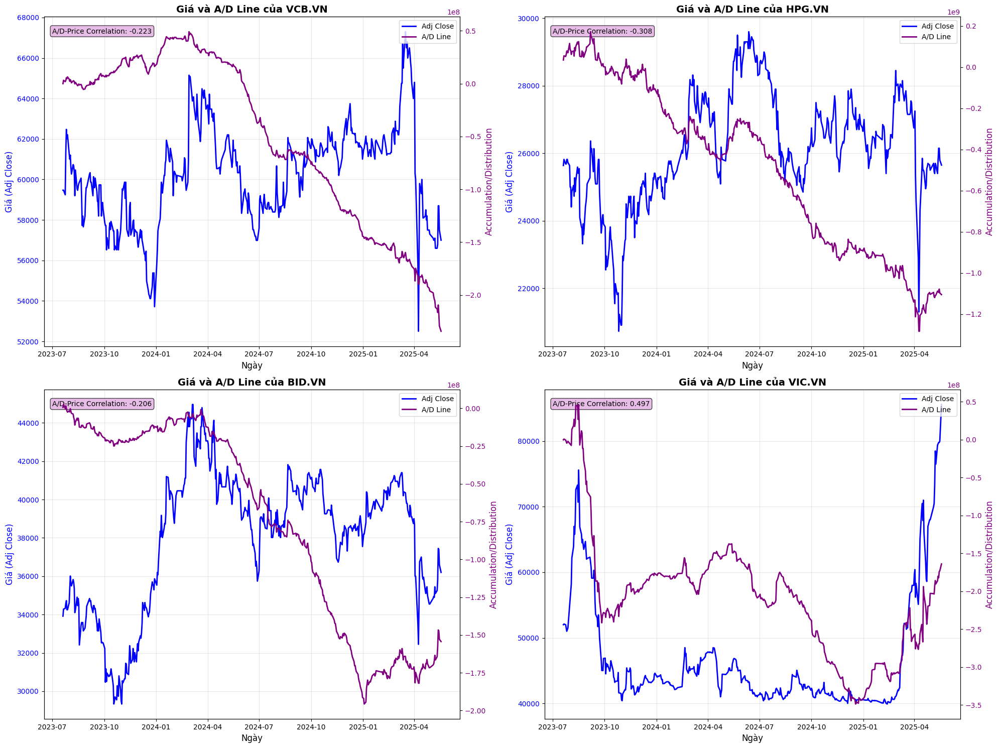

In [ ]:
# Biểu đồ Accumulation/Distribution Line
plt.figure(figsize=(20, 15))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Vẽ giá
    line1 = ax1.plot(company.index, company['Adj Close'],
                     color='blue', linewidth=2, label='Adj Close')
    ax1.set_ylabel('Giá (Adj Close)', color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, alpha=0.3)

    # Vẽ A/D Line
    line2 = ax2.plot(company.index, company['AD_Line'],
                     color='purple', linewidth=2, label='A/D Line')
    ax2.set_ylabel('Accumulation/Distribution', color='purple', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='purple')

    # Tiêu đề
    plt.title(f"Giá và A/D Line của {tech_list[i - 1]}", fontsize=14, fontweight='bold')
    ax1.set_xlabel('Ngày', fontsize=12)
    plt.xticks(rotation=45)

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # Thêm correlation
    ad_price_corr = company['AD_Line'].corr(company['Adj Close'])
    ax1.text(0.02, 0.95, f'A/D-Price Correlation: {ad_price_corr:.3f}',
             transform=ax1.transAxes, bbox=dict(boxstyle="round,pad=0.3", facecolor="plum", alpha=0.7))

plt.tight_layout()
plt.show()

📊 BẢNG TỔNG HỢP CORRELATION ANALYSIS
       Company  Volume-Price  OBV-Price  VPT-Price  AD_Line-Price
   Vietcombank       -0.0241     0.4607     0.7660        -0.2229
Hoà Phát Group       -0.0506     0.8816     0.8458        -0.3081
          BIDV        0.2781     0.5310     0.7190        -0.2064
      VinGroup        0.5167     0.8825     0.9557         0.4971


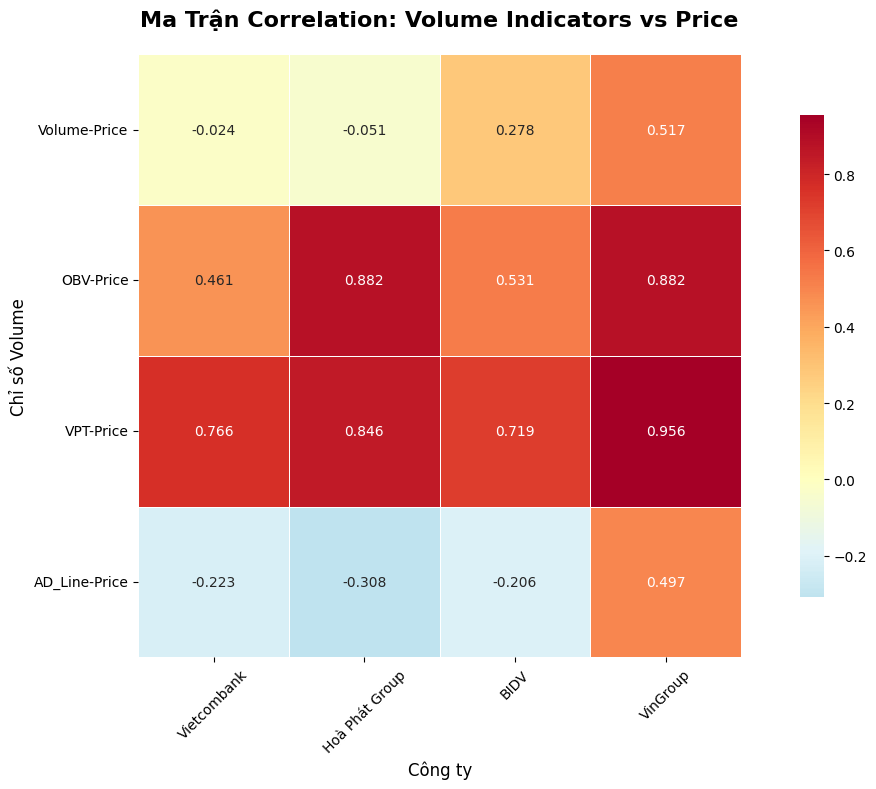

In [ ]:
# Bảng tổng hợp correlation analysis
correlation_data = []

for i, company in enumerate(company_list):
    company_name = company_names[i]

    correlations = {
        'Company': company_name,
        'Volume-Price': company['Volume'].corr(company['Adj Close']),
        'OBV-Price': company['OBV'].corr(company['Adj Close']),
        'VPT-Price': company['VPT'].corr(company['Adj Close']),
        'AD_Line-Price': company['AD_Line'].corr(company['Adj Close'])
    }

    correlation_data.append(correlations)

correlation_df = pd.DataFrame(correlation_data)
correlation_df = correlation_df.round(4)

print("📊 BẢNG TỔNG HỢP CORRELATION ANALYSIS")
print("="*60)
print(correlation_df.to_string(index=False))

plt.figure(figsize=(12, 8))

# Tạo ma trận correlation cho tất cả các chỉ số
correlation_matrix = correlation_df.set_index('Company').T

# Vẽ heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": .8},
            fmt='.3f')

plt.title('Ma Trận Correlation: Volume Indicators vs Price', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Công ty', fontsize=12)
plt.ylabel('Chỉ số Volume', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

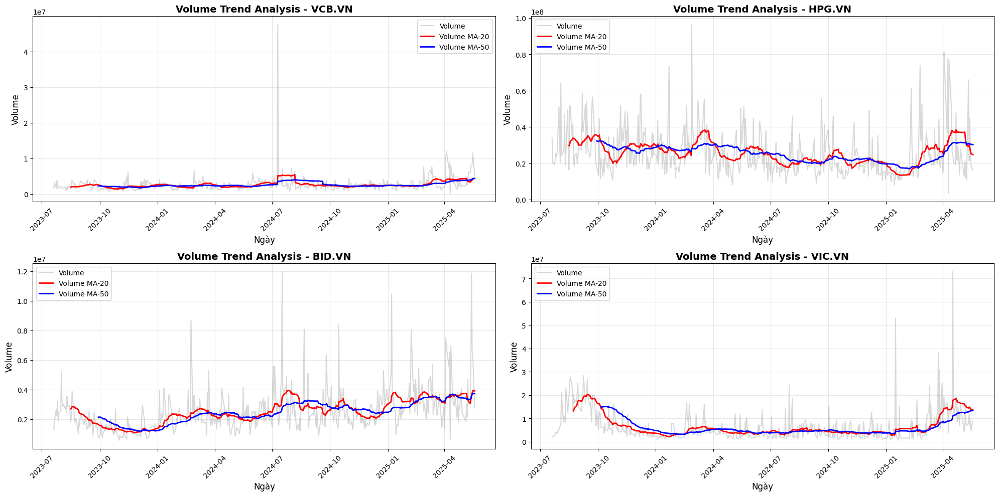

In [ ]:
# Volume trend analysis - Phân tích xu hướng volume
plt.figure(figsize=(20, 10))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)

    # Tính moving average cho volume
    company['Volume_MA_20'] = company['Volume'].rolling(window=20).mean()
    company['Volume_MA_50'] = company['Volume'].rolling(window=50).mean()

    # Vẽ volume và moving averages
    plt.plot(company.index, company['Volume'], alpha=0.3, color='gray', label='Volume')
    plt.plot(company.index, company['Volume_MA_20'], color='red', linewidth=2, label='Volume MA-20')
    plt.plot(company.index, company['Volume_MA_50'], color='blue', linewidth=2, label='Volume MA-50')

    plt.title(f'Volume Trend Analysis - {tech_list[i-1]}', fontsize=14, fontweight='bold')
    plt.xlabel('Ngày', fontsize=12)
    plt.ylabel('Volume', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
#  Volume spike analysis - Phân tích volume bất thường
print("🔍 PHÂN TÍCH VOLUME SPIKE")
print("="*50)

for i, company in enumerate(company_list):
    company_name = tech_list[i]

    # Tính volume spike (volume > 2 lần moving average)
    company['Volume_MA_20'] = company['Volume'].rolling(window=20).mean()
    company['Volume_Spike'] = company['Volume'] > (2 * company['Volume_MA_20'])

    # Đếm số ngày có volume spike
    spike_days = company['Volume_Spike'].sum()
    total_days = len(company)
    spike_percentage = (spike_days / total_days) * 100

    print(f"\n{company_name}:")
    print(f"  - Số ngày volume spike: {spike_days}")
    print(f"  - Tổng số ngày: {total_days}")
    print(f"  - Tỷ lệ volume spike: {spike_percentage:.2f}%")

    # Volume spike gần đây nhất
    recent_spikes = company[company['Volume_Spike']].tail(3)
    if not recent_spikes.empty:
        print(f"  - Volume spike gần nhất:")
        for date, row in recent_spikes.iterrows():
            print(f"    + {date.strftime('%Y-%m-%d')}: Volume = {row['Volume']:,.0f}")

print("\n" + "="*50)

🔍 PHÂN TÍCH VOLUME SPIKE

VCB.VN:
  - Số ngày volume spike: 18
  - Tổng số ngày: 454
  - Tỷ lệ volume spike: 3.96%
  - Volume spike gần nhất:
    + 2025-05-14: Volume = 8,071,608
    + 2025-05-15: Volume = 8,290,607
    + 2025-05-16: Volume = 11,589,970

HPG.VN:
  - Số ngày volume spike: 18
  - Tổng số ngày: 451
  - Tỷ lệ volume spike: 3.99%
  - Volume spike gần nhất:
    + 2025-04-09: Volume = 77,553,000
    + 2025-04-11: Volume = 76,877,400
    + 2025-05-12: Volume = 65,906,660

BID.VN:
  - Số ngày volume spike: 18
  - Tổng số ngày: 454
  - Tỷ lệ volume spike: 3.96%
  - Volume spike gần nhất:
    + 2025-02-07: Volume = 8,054,000
    + 2025-04-03: Volume = 7,520,100
    + 2025-05-14: Volume = 11,864,500

VIC.VN:
  - Số ngày volume spike: 40
  - Tổng số ngày: 444
  - Tỷ lệ volume spike: 9.01%
  - Volume spike gần nhất:
    + 2025-03-25: Volume = 38,025,550
    + 2025-03-27: Volume = 30,716,750
    + 2025-04-17: Volume = 72,938,850



# ***4. CORRELATION & PORTFOLIO ANALYSIS***

## **4.1 Cross-Asset Correlation**

- **Correlation matrix:** Giữa 4 cổ phiếu
- **Rolling correlation:** 30-day, 60-day windows
- **Sector correlation:** (BID-VCB banking, VIC real estate, HPG steel)

In [ ]:
#Tạo DataFrame chứa giá đóng cửa của tất cả cổ phiếu

close_prices = pd.DataFrame()

for i, company in enumerate(company_list):
    company_name = company_names[i]
    close_prices[company_name] = company['Adj Close']

print("DataFrame giá đóng cửa:")
print(close_prices.head())
print(f"\nKích thước dữ liệu: {close_prices.shape}")
print(f"Ngày bắt đầu: {close_prices.index[0]}")
print(f"Ngày kết thúc: {close_prices.index[-1]}")


DataFrame giá đóng cửa:
             Vietcombank  Hoà Phát Group          BIDV  VinGroup
Date                                                            
2023-07-20  59470.035156    25636.363281  33918.839844   52000.0
2023-07-21  59470.035156    25818.181641  34285.531250   52100.0
2023-07-24  59243.484375    25681.818359  34322.199219   52000.0
2023-07-25  61337.792969    25681.818359  34578.882812       NaN
2023-07-26  62474.917969    25818.181641  34725.558594   51000.0

Kích thước dữ liệu: (454, 4)
Ngày bắt đầu: 2023-07-20 00:00:00
Ngày kết thúc: 2025-05-19 00:00:00


4.1 CROSS-ASSET CORRELATION ANALYSIS

1. CORRELATION MATRIX:
----------------------------------------
                Vietcombank  Hoà Phát Group    BIDV  VinGroup
Vietcombank          1.0000          0.4773  0.6810   -0.1222
Hoà Phát Group       0.4773          1.0000  0.7149   -0.1877
BIDV                 0.6810          0.7149  1.0000   -0.2709
VinGroup            -0.1222         -0.1877 -0.2709    1.0000


(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'Vietcombank'),
  Text(0, 1.5, 'Hoà Phát Group'),
  Text(0, 2.5, 'BIDV'),
  Text(0, 3.5, 'VinGroup')])

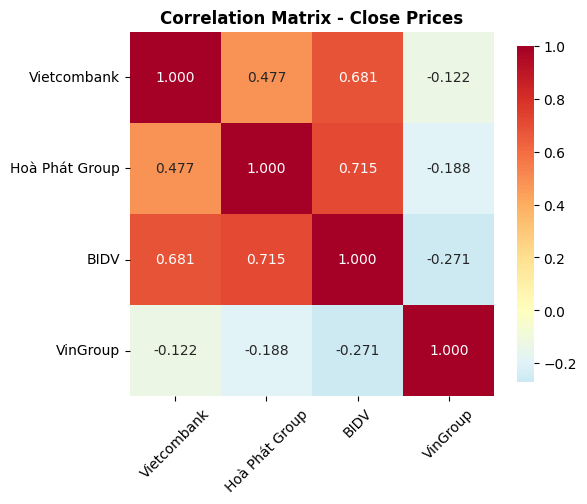

In [ ]:
# 1. CORRELATION MATRIX - Giữa close price 4 cổ phiếu
print("=" * 60)
print("4.1 CROSS-ASSET CORRELATION ANALYSIS")
print("=" * 60)

# Tính correlation matrix
correlation_matrix = close_prices.corr()

print("\n1. CORRELATION MATRIX:")
print("-" * 40)
print(correlation_matrix.round(4))

# Visualize correlation matrix
plt.figure(figsize=(20, 12))

# Subplot 1: Correlation Heatmap
plt.subplot(2, 3, 1)
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={'shrink': 0.8})
plt.title('Correlation Matrix - Close Prices', fontsize=12, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)


2. ROLLING CORRELATION:
----------------------------------------
30-Day Rolling Correlation (Recent 10 observations):


,Vietcombank-BIDV,Vietcombank-VinGroup,BIDV-VinGroup,Hoà Phát Group-VinGroup,Hoà Phát Group-Vietcombank,Hoà Phát Group-BIDV
Date,,,,,,
2025-05-06,0.9829,-0.5180,-0.4406,-0.1505,0.8589,0.8499
2025-05-07,0.9818,-0.4838,-0.4040,-0.0975,0.8499,0.8405
2025-05-08,0.9788,-0.4458,-0.3465,-0.0256,0.8332,0.8293
2025-05-09,0.9788,-0.4345,-0.3264,0.0232,0.8150,0.8135
2025-05-12,0.9739,-0.4181,-0.2874,0.0648,0.7985,0.8019
2025-05-13,0.9630,-0.3931,-0.2195,0.1470,0.7612,0.7784
2025-05-14,0.9395,-0.3220,-0.0773,0.2558,0.7262,0.7555
2025-05-15,0.9111,-0.2481,0.0677,0.3531,0.6957,0.7374
2025-05-16,0.8791,-0.1888,0.1939,0.4271,0.6700,0.7255



60-Day Rolling Correlation (Recent 10 observations):


,Vietcombank-BIDV,Vietcombank-VinGroup,BIDV-VinGroup,Hoà Phát Group-VinGroup,Hoà Phát Group-Vietcombank,Hoà Phát Group-BIDV
Date,,,,,,
2025-05-06,0.7773,-0.3908,-0.8093,-0.4579,0.8203,0.8227
2025-05-07,0.7853,-0.4191,-0.8180,-0.4649,0.8202,0.8220
2025-05-08,0.7927,-0.4463,-0.8161,-0.4642,0.8173,0.8224
2025-05-09,0.8020,-0.4762,-0.8192,-0.4875,0.8178,0.8364
2025-05-12,0.8114,-0.5058,-0.8187,-0.5027,0.8178,0.8446
2025-05-13,0.8180,-0.5331,-0.8159,-0.5141,0.8149,0.8519
2025-05-14,0.8207,-0.5452,-0.7977,-0.5178,0.8138,0.8601
2025-05-15,0.8264,-0.5573,-0.7786,-0.5198,0.8124,0.8703
2025-05-16,0.8312,-0.5768,-0.7700,-0.5293,0.8114,0.8779


(array([19662., 19723., 19783., 19844., 19905., 19967., 20028., 20089.,
        20148., 20209.]),
 [Text(19662.0, 0, '2023-11'),
  Text(19723.0, 0, '2024-01'),
  Text(19783.0, 0, '2024-03'),
  Text(19844.0, 0, '2024-05'),
  Text(19905.0, 0, '2024-07'),
  Text(19967.0, 0, '2024-09'),
  Text(20028.0, 0, '2024-11'),
  Text(20089.0, 0, '2025-01'),
  Text(20148.0, 0, '2025-03'),
  Text(20209.0, 0, '2025-05')])

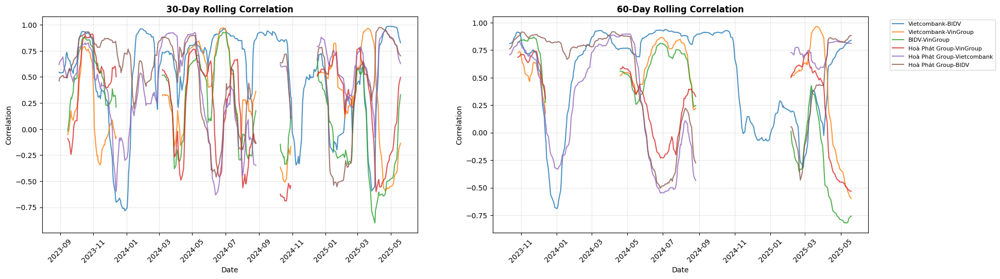

In [ ]:
# 2. ROLLING CORRELATION - 30-day và 60-day windows
plt.figure(figsize=(32, 12))
print("\n2. ROLLING CORRELATION:")
print("-" * 40)

# Tính rolling correlation cho các cặp quan trọng
pairs = [
    ('Vietcombank', 'BIDV'),  # Banking sector
    ('Vietcombank', 'VinGroup'),  # Banking vs Real Estate
    ('BIDV', 'VinGroup'),  # Banking vs Real Estate
    ('Hoà Phát Group', 'VinGroup'),  # Steel vs Real Estate
    ('Hoà Phát Group', 'Vietcombank'),  # Steel vs Banking
    ('Hoà Phát Group', 'BIDV')  # Steel vs Banking
]

# 30-day rolling correlation
rolling_corr_30d = {}
rolling_corr_60d = {}

for pair in pairs:
    stock1, stock2 = pair
    # 30-day rolling correlation
    rolling_30 = close_prices[stock1].rolling(window=30).corr(close_prices[stock2])
    rolling_corr_30d[f"{stock1}-{stock2}"] = rolling_30

    # 60-day rolling correlation
    rolling_60 = close_prices[stock1].rolling(window=60).corr(close_prices[stock2])
    rolling_corr_60d[f"{stock1}-{stock2}"] = rolling_60

# Convert to DataFrame
rolling_30d_df = pd.DataFrame(rolling_corr_30d)
rolling_60d_df = pd.DataFrame(rolling_corr_60d)

# Print summary statistics
print("30-Day Rolling Correlation (Recent 10 observations):")

display(HTML(rolling_30d_df.tail(10).round(4).to_html()))
print("\n60-Day Rolling Correlation (Recent 10 observations):")

display(HTML(rolling_60d_df.tail(10).round(4).to_html()))
# Subplot 2: 30-day Rolling Correlation
plt.subplot(2, 3, 2)
for column in rolling_30d_df.columns:
    plt.plot(rolling_30d_df.index, rolling_30d_df[column],
             label=column, linewidth=1.5, alpha=0.8)
plt.title('30-Day Rolling Correlation', fontsize=12, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Correlation')

plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)

# Subplot 3: 60-day Rolling Correlation
plt.subplot(2, 3, 3)
for column in rolling_60d_df.columns:
    plt.plot(rolling_60d_df.index, rolling_60d_df[column],
             label=column, linewidth=1.5, alpha=0.8)
plt.title('60-Day Rolling Correlation', fontsize=12, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Correlation')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)


3. SECTOR CORRELATION ANALYSIS:
----------------------------------------
Banking Sector Internal Correlation (VCB-BID):


,Vietcombank,BIDV
Vietcombank,1.000,0.681
BIDV,0.681,1.000



Cross-Sector Correlation Matrix:


,Banking (VCB),Banking (BID),Real Estate (VIC),Steel (HPG)
Banking (VCB),1.0000,0.6810,-0.1222,0.4773
Banking (BID),0.6810,1.0000,-0.2709,0.7149
Real Estate (VIC),-0.1222,-0.2709,1.0000,-0.1877
Steel (HPG),0.4773,0.7149,-0.1877,1.0000


(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0, 0.5, 'Banking (VCB)'),
  Text(0, 1.5, 'Banking (BID)'),
  Text(0, 2.5, 'Real Estate (VIC)'),
  Text(0, 3.5, 'Steel (HPG)')])

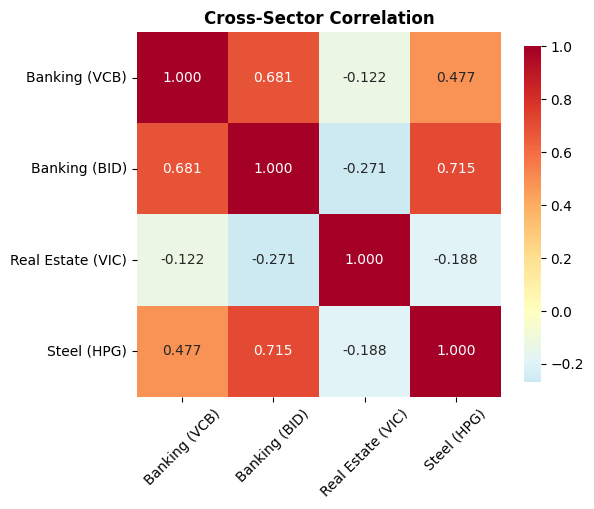

In [ ]:
# 3. SECTOR CORRELATION ANALYSIS
print("\n3. SECTOR CORRELATION ANALYSIS:")
print("-" * 40)
plt.figure(figsize=(20, 12))
# Định nghĩa sectors
sectors = {
    'Banking': ['Vietcombank', 'BIDV'],
    'Real Estate': ['VinGroup'],
    'Steel': ['Hoà Phát Group']
}

# Tính correlation trong từng sector và giữa các sectors
sector_analysis = {}

# Banking sector internal correlation
banking_corr = close_prices[sectors['Banking']].corr()
print("Banking Sector Internal Correlation (VCB-BID):")
display(HTML(banking_corr.round(4).to_html()))
# Cross-sector correlations
cross_sector_corr = pd.DataFrame(index=['Banking (VCB)', 'Banking (BID)', 'Real Estate (VIC)', 'Steel (HPG)'],
                                columns=['Banking (VCB)', 'Banking (BID)', 'Real Estate (VIC)', 'Steel (HPG)'])

stock_mapping = {
    'Banking (VCB)': 'Vietcombank',
    'Banking (BID)': 'BIDV',
    'Real Estate (VIC)': 'VinGroup',
    'Steel (HPG)': 'Hoà Phát Group'
}

for i, sector1 in enumerate(cross_sector_corr.index):
    for j, sector2 in enumerate(cross_sector_corr.columns):
        stock1 = stock_mapping[sector1]
        stock2 = stock_mapping[sector2]
        cross_sector_corr.iloc[i, j] = close_prices[stock1].corr(close_prices[stock2])

print("\nCross-Sector Correlation Matrix:")
display(HTML(cross_sector_corr.astype(float).round(4).to_html()))
# Subplot 4: Cross-Sector Correlation Heatmap
plt.subplot(2, 3, 4)
sns.heatmap(cross_sector_corr.astype(float), annot=True, cmap='RdYlBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={'shrink': 0.8})
plt.title('Cross-Sector Correlation', fontsize=12, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)


4. CORRELATION TRENDS:
----------------------------------------
Monthly Average Correlation Matrix:


,Vietcombank,Hoà Phát Group,BIDV,VinGroup
Vietcombank,1.0000,0.4202,0.6841,-0.2105
Hoà Phát Group,0.4202,1.0000,0.7496,-0.1093
BIDV,0.6841,0.7496,1.0000,-0.2117
VinGroup,-0.2105,-0.1093,-0.2117,1.0000


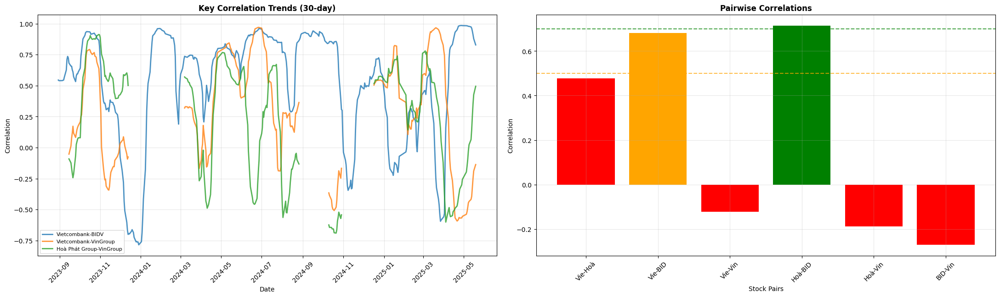

In [ ]:
# 4. CORRELATION TRENDS ANALYSIS
print("\n4. CORRELATION TRENDS:")
print("-" * 40)
plt.figure(figsize=(32, 12))
# Tính correlation trung bình theo từng quý/tháng
close_prices_monthly = close_prices.resample('M').last()
monthly_corr = close_prices_monthly.corr()

print("Monthly Average Correlation Matrix:")
display(HTML(monthly_corr.round(4).to_html()))

# Subplot 5: Time Series of Key Correlations
plt.subplot(2, 3, 5)
key_correlations = ['Vietcombank-BIDV', 'Vietcombank-VinGroup', 'Hoà Phát Group-VinGroup']
for corr_pair in key_correlations:
    if corr_pair in rolling_30d_df.columns:
        plt.plot(rolling_30d_df.index, rolling_30d_df[corr_pair],
                label=corr_pair, linewidth=2, alpha=0.8)

plt.title('Key Correlation Trends (30-day)', fontsize=12, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Correlation')
plt.legend(fontsize=8)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)

# Subplot 6: Correlation Distribution
plt.subplot(2, 3, 6)
correlation_values = []
correlation_labels = []

for i in range(len(company_names)):
    for j in range(i+1, len(company_names)):
        corr_val = correlation_matrix.iloc[i, j]
        correlation_values.append(corr_val)
        correlation_labels.append(f"{company_names[i][:3]}-{company_names[j][:3]}")

plt.bar(range(len(correlation_values)), correlation_values,
        color=['red' if x < 0.5 else 'green' if x > 0.7 else 'orange' for x in correlation_values])
plt.title('Pairwise Correlations', fontsize=12, fontweight='bold')
plt.xlabel('Stock Pairs')
plt.ylabel('Correlation')
plt.xticks(range(len(correlation_labels)), correlation_labels, rotation=45)
plt.grid(True, alpha=0.3)

# Add horizontal lines for reference
plt.axhline(y=0.5, color='orange', linestyle='--', alpha=0.7, label='Moderate (0.5)')
plt.axhline(y=0.7, color='green', linestyle='--', alpha=0.7, label='Strong (0.7)')

plt.tight_layout()
plt.show()

In [ ]:
# 5. SUMMARY STATISTICS
print("\n5. CORRELATION SUMMARY:")
print("-" * 40)

# Highest and lowest correlations
corr_pairs = []
for i in range(len(company_names)):
    for j in range(i+1, len(company_names)):
        pair_name = f"{company_names[i]} - {company_names[j]}"
        corr_val = correlation_matrix.iloc[i, j]
        corr_pairs.append((pair_name, corr_val))

corr_pairs.sort(key=lambda x: x[1], reverse=True)

print("Highest Correlations:")
for pair, corr in corr_pairs[:3]:
    print(f"  {pair}: {corr:.4f}")

print("\nLowest Correlations:")
for pair, corr in corr_pairs[-3:]:
    print(f"  {pair}: {corr:.4f}")

# Rolling correlation statistics
print("\n30-Day Rolling Correlation Statistics:")

display(HTML(rolling_30d_df.describe().round(4).to_html()))
print("\n60-Day Rolling Correlation Statistics:")
display(HTML(rolling_60d_df.describe().round(4).to_html()))

# Sector insights
print("\n6. SECTOR INSIGHTS:")
print("-" * 40)
print("• Banking Sector (VCB-BID): Correlation =",
      f"{close_prices['Vietcombank'].corr(close_prices['BIDV']):.4f}")
print("• Banking vs Real Estate (Average):",
      f"{(close_prices['Vietcombank'].corr(close_prices['VinGroup']) + close_prices['BIDV'].corr(close_prices['VinGroup'])) / 2:.4f}")
print("• Steel vs Others (Average):",
      f"{(close_prices['Hoà Phát Group'].corr(close_prices['Vietcombank']) + close_prices['Hoà Phát Group'].corr(close_prices['BIDV']) + close_prices['Hoà Phát Group'].corr(close_prices['VinGroup'])) / 3:.4f}")

print("\n" + "="*60)
print("CROSS-ASSET CORRELATION ANALYSIS COMPLETED")
print("="*60)


5. CORRELATION SUMMARY:
----------------------------------------
Highest Correlations:
  Hoà Phát Group - BIDV: 0.7149
  Vietcombank - BIDV: 0.6810
  Vietcombank - Hoà Phát Group: 0.4773

Lowest Correlations:
  Vietcombank - VinGroup: -0.1222
  Hoà Phát Group - VinGroup: -0.1877
  BIDV - VinGroup: -0.2709

30-Day Rolling Correlation Statistics:


,Vietcombank-BIDV,Vietcombank-VinGroup,BIDV-VinGroup,Hoà Phát Group-VinGroup,Hoà Phát Group-Vietcombank,Hoà Phát Group-BIDV
count,425.0000,297.0000,297.0000,297.0000,361.0000,361.0000
mean,0.5164,0.3047,0.1923,0.2394,0.4164,0.4816
std,0.4548,0.4317,0.4615,0.4523,0.4077,0.4193
min,-0.7846,-0.5924,-0.9000,-0.6898,-0.6316,-0.5524
25%,0.3174,-0.0085,-0.2289,-0.1330,0.1904,0.2718
50%,0.6796,0.3196,0.2667,0.4000,0.5042,0.6060
75%,0.8767,0.6907,0.5600,0.5864,0.7718,0.8151
max,0.9856,0.9704,0.9273,0.9133,0.9422,0.9749



60-Day Rolling Correlation Statistics:


,Vietcombank-BIDV,Vietcombank-VinGroup,BIDV-VinGroup,Hoà Phát Group-VinGroup,Hoà Phát Group-Vietcombank,Hoà Phát Group-BIDV
count,395.0000,193.0000,193.0000,193.0000,287.0000,287.0000
mean,0.5359,0.5256,0.2968,0.2637,0.3842,0.4788
std,0.4292,0.3625,0.5311,0.3859,0.4862,0.4779
min,-0.6889,-0.5975,-0.8192,-0.5313,-0.5487,-0.5038
25%,0.1802,0.4426,-0.0628,-0.0981,-0.0922,0.0728
50%,0.7460,0.5769,0.4552,0.3771,0.6312,0.7793
75%,0.8911,0.7881,0.7315,0.5898,0.7887,0.8544
max,0.9373,0.9655,0.8678,0.7398,0.8954,0.9164



6. SECTOR INSIGHTS:
----------------------------------------
• Banking Sector (VCB-BID): Correlation = 0.6810
• Banking vs Real Estate (Average): -0.1965
• Steel vs Others (Average): 0.3348

CROSS-ASSET CORRELATION ANALYSIS COMPLETED


# ***5. SEASONALITY & PATTERN ANALYSIS***

PHASE 5: SEASONALITY & PATTERN ANALYSIS
5.1 SEASONAL PATTERNS ANALYSIS

5.1.1 MONTHLY RETURNS ANALYSIS
----------------------------------------

5.1.2 QUARTERLY ANALYSIS
------------------------------

5.1.3 DAY-OF-WEEK EFFECTS
------------------------------

5.1.4 HOLIDAY EFFECTS ANALYSIS
-----------------------------------

5.1.5 VOLATILITY SEASONALITY
------------------------------

5.1.6 CALENDAR EFFECTS SUMMARY
-----------------------------------


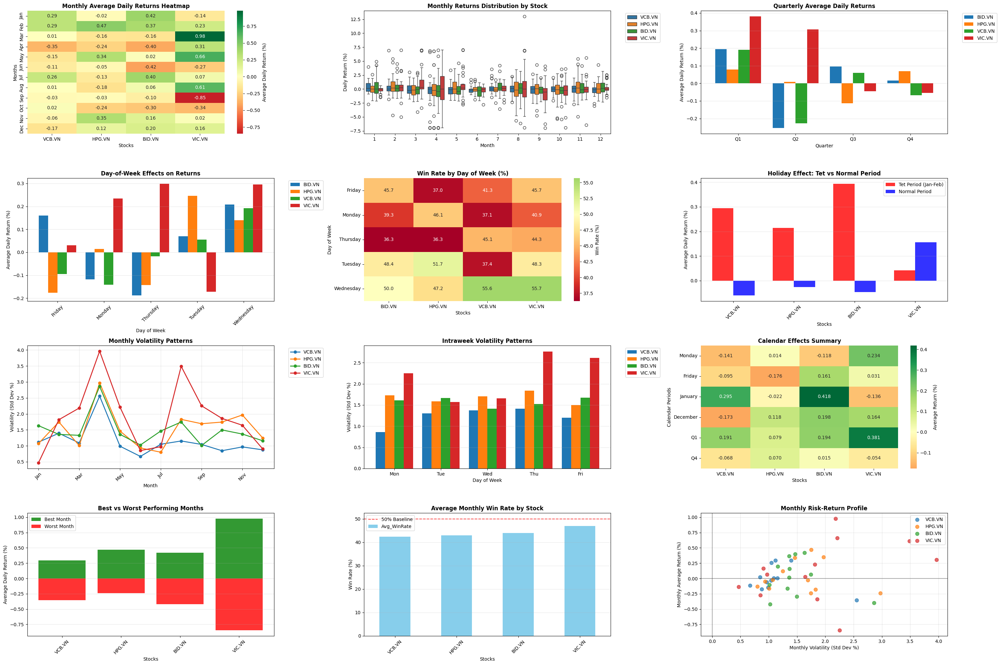


SEASONALITY STATISTICAL SUMMARY

BEST & WORST PERFORMING MONTHS:
----------------------------------------

VCB.VN:
  Best Month: Jan (0.295%)
  Worst Month: Apr (-0.353%)

HPG.VN:
  Best Month: Feb (0.471%)
  Worst Month: Oct (-0.242%)

BID.VN:
  Best Month: Jan (0.418%)
  Worst Month: Jun (-0.420%)

VIC.VN:
  Best Month: Mar (0.978%)
  Worst Month: Sep (-0.847%)

DAY-OF-WEEK EFFECTS:
-------------------------

VCB.VN:
  Monday: -0.141% (Win Rate: 37.1%)
  Tuesday: 0.055% (Win Rate: 37.4%)
  Wednesday: 0.192% (Win Rate: 55.6%)
  Thursday: -0.018% (Win Rate: 45.1%)
  Friday: -0.095% (Win Rate: 41.3%)

HPG.VN:
  Monday: 0.014% (Win Rate: 46.1%)
  Tuesday: 0.245% (Win Rate: 51.7%)
  Wednesday: 0.140% (Win Rate: 47.2%)
  Thursday: -0.143% (Win Rate: 36.3%)
  Friday: -0.176% (Win Rate: 37.0%)

BID.VN:
  Monday: -0.118% (Win Rate: 39.3%)
  Tuesday: 0.069% (Win Rate: 48.4%)
  Wednesday: 0.208% (Win Rate: 50.0%)
  Thursday: -0.188% (Win Rate: 36.3%)
  Friday: 0.161% (Win Rate: 45.7%)

VIC.VN:

In [ ]:
print("="*80)
print("PHASE 5: SEASONALITY & PATTERN ANALYSIS")
print("="*80)

# Chuẩn bị dữ liệu cho phân tích seasonality
def prepare_seasonality_data(company_list, tech_list, company_names):
    """Chuẩn bị dữ liệu cho phân tích seasonality"""
    seasonality_data = {}

    for i, company in enumerate(company_list):
        # Tạo copy để không thay đổi dữ liệu gốc
        data = company.copy()

        # Thêm các thông tin về thời gian
        data['Year'] = data.index.year
        data['Month'] = data.index.month
        data['Quarter'] = data.index.quarter
        data['DayOfWeek'] = data.index.dayofweek  # 0=Monday, 6=Sunday
        data['WeekOfYear'] = data.index.isocalendar().week
        data['DayOfYear'] = data.index.dayofyear

        # Tên các ngày trong tuần
        data['DayName'] = data.index.day_name()
        data['MonthName'] = data.index.month_name()

        # Tính daily returns nếu chưa có
        if 'Daily Return' not in data.columns:
            data['Daily Return'] = data['Adj Close'].pct_change() * 100

        seasonality_data[tech_list[i]] = data

    return seasonality_data

# Chuẩn bị dữ liệu
seasonality_data = prepare_seasonality_data(company_list, tech_list, company_names)

# 5.1 SEASONAL PATTERNS
print("="*60)
print("5.1 SEASONAL PATTERNS ANALYSIS")
print("="*60)

# Tạo figure cho các biểu đồ seasonality
fig = plt.figure(figsize=(30, 20))

# 5.1.1 Monthly Returns Analysis
print("\n5.1.1 MONTHLY RETURNS ANALYSIS")
print("-"*40)

# Tính monthly returns cho từng stock
monthly_returns = {}
for i, stock in enumerate(tech_list):
    data = seasonality_data[stock].copy()
    monthly_data = []

    for month in range(1, 13):
        month_returns = data[data['Month'] == month]['Daily Return'].dropna()
        if len(month_returns) > 0:
            monthly_data.append({
                'Month': month,
                'Mean_Return': month_returns.mean(),
                'Std_Return': month_returns.std(),
                'Count': len(month_returns),
                'Positive_Days': (month_returns > 0).sum(),
                'Negative_Days': (month_returns < 0).sum(),
                'Win_Rate': (month_returns > 0).mean() * 100
            })

    monthly_returns[stock] = pd.DataFrame(monthly_data)

# Plot 1: Monthly Average Returns Heatmap
plt.subplot(4, 3, 1)
monthly_matrix = pd.DataFrame()
for stock in tech_list:
    monthly_matrix[stock] = monthly_returns[stock]['Mean_Return'].values

monthly_matrix.index = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

sns.heatmap(monthly_matrix, annot=True, cmap='RdYlGn', center=0,
            fmt='.2f', cbar_kws={'label': 'Average Daily Return (%)'})
plt.title('Monthly Average Daily Returns Heatmap', fontsize=12, fontweight='bold')
plt.xlabel('Stocks')
plt.ylabel('Months')

# Plot 2: Monthly Returns Boxplot
plt.subplot(4, 3, 2)
monthly_boxplot_data = []
for stock in tech_list:
    data = seasonality_data[stock]
    for month in range(1, 13):
        month_returns = data[data['Month'] == month]['Daily Return'].dropna()
        for ret in month_returns:
            monthly_boxplot_data.append({
                'Month': month,
                'Stock': stock,
                'Return': ret
            })

monthly_boxplot_df = pd.DataFrame(monthly_boxplot_data)
sns.boxplot(data=monthly_boxplot_df, x='Month', y='Return', hue='Stock')
plt.title('Monthly Returns Distribution by Stock', fontsize=12, fontweight='bold')
plt.xlabel('Month')
plt.ylabel('Daily Return (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# 5.1.2 Quarterly Analysis
print("\n5.1.2 QUARTERLY ANALYSIS")
print("-"*30)

# Plot 3: Quarterly Performance
plt.subplot(4, 3, 3)
quarterly_data = []
for stock in tech_list:
    data = seasonality_data[stock]
    for quarter in range(1, 5):
        quarter_returns = data[data['Quarter'] == quarter]['Daily Return'].dropna()
        if len(quarter_returns) > 0:
            quarterly_data.append({
                'Quarter': f'Q{quarter}',
                'Stock': stock,
                'Mean_Return': quarter_returns.mean(),
                'Volatility': quarter_returns.std(),
                'Win_Rate': (quarter_returns > 0).mean() * 100
            })

quarterly_df = pd.DataFrame(quarterly_data)
quarterly_pivot = quarterly_df.pivot(index='Quarter', columns='Stock', values='Mean_Return')
quarterly_pivot.plot(kind='bar', ax=plt.gca(), width=0.8)
plt.title('Quarterly Average Daily Returns', fontsize=12, fontweight='bold')
plt.ylabel('Average Daily Return (%)')
plt.xlabel('Quarter')
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', alpha=0.3)

# 5.1.3 Day-of-Week Effects
print("\n5.1.3 DAY-OF-WEEK EFFECTS")
print("-"*30)

# Plot 4: Day of Week Returns
plt.subplot(4, 3, 4)
dow_data = []
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
for stock in tech_list:
    data = seasonality_data[stock]
    for dow in range(5):  # 0-4 for weekdays
        dow_returns = data[data['DayOfWeek'] == dow]['Daily Return'].dropna()
        if len(dow_returns) > 0:
            dow_data.append({
                'Day': day_names[dow],
                'Stock': stock,
                'Mean_Return': dow_returns.mean(),
                'Count': len(dow_returns),
                'Win_Rate': (dow_returns > 0).mean() * 100
            })

dow_df = pd.DataFrame(dow_data)
dow_pivot = dow_df.pivot(index='Day', columns='Stock', values='Mean_Return')
dow_pivot.plot(kind='bar', ax=plt.gca(), width=0.8)
plt.title('Day-of-Week Effects on Returns', fontsize=12, fontweight='bold')
plt.ylabel('Average Daily Return (%)')
plt.xlabel('Day of Week')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', alpha=0.3)

# Plot 5: Win Rate by Day of Week
plt.subplot(4, 3, 5)
dow_winrate_pivot = dow_df.pivot(index='Day', columns='Stock', values='Win_Rate')
sns.heatmap(dow_winrate_pivot, annot=True, cmap='RdYlGn', center=50,
            fmt='.1f', cbar_kws={'label': 'Win Rate (%)'})
plt.title('Win Rate by Day of Week (%)', fontsize=12, fontweight='bold')
plt.xlabel('Stocks')
plt.ylabel('Day of Week')

# 5.1.4 Holiday Effects Analysis
print("\n5.1.4 HOLIDAY EFFECTS ANALYSIS")
print("-"*35)

# Định nghĩa các ngày lễ quan trọng (approximate dates)
def get_holiday_periods():
    """Định nghĩa các giai đoạn lễ tết"""
    holiday_periods = {
        'Tet': [(1, 20), (2, 15)],  # Tết Nguyên Đán (tháng 1-2)
        'National_Day': [(9, 1), (9, 3)],  # Quốc Khánh (2/9)
        'Year_End': [(12, 20), (12, 31)],  # Cuối năm
        'Mid_Autumn': [(9, 15), (9, 20)],  # Tết Trung Thu (tháng 9)
    }
    return holiday_periods

# Plot 6: Pre/Post Holiday Analysis
plt.subplot(4, 3, 6)
holiday_analysis = []
for stock in tech_list:
    data = seasonality_data[stock].copy()

    # Phân tích pre/post Tết (tháng 1-2)
    tet_period = data[(data['Month'].isin([1, 2]))]['Daily Return'].dropna()
    normal_period = data[~(data['Month'].isin([1, 2]))]['Daily Return'].dropna()

    holiday_analysis.append({
        'Stock': stock,
        'Tet_Period': tet_period.mean() if len(tet_period) > 0 else 0,
        'Normal_Period': normal_period.mean() if len(normal_period) > 0 else 0,
        'Tet_Volatility': tet_period.std() if len(tet_period) > 0 else 0,
        'Normal_Volatility': normal_period.std() if len(normal_period) > 0 else 0
    })

holiday_df = pd.DataFrame(holiday_analysis)
x = range(len(tech_list))
width = 0.35

plt.bar([i - width/2 for i in x], holiday_df['Tet_Period'], width,
        label='Tet Period (Jan-Feb)', alpha=0.8, color='red')
plt.bar([i + width/2 for i in x], holiday_df['Normal_Period'], width,
        label='Normal Period', alpha=0.8, color='blue')

plt.title('Holiday Effect: Tet vs Normal Period', fontsize=12, fontweight='bold')
plt.ylabel('Average Daily Return (%)')
plt.xlabel('Stocks')
plt.xticks(x, tech_list, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 5.1.5 Volatility Seasonality
print("\n5.1.5 VOLATILITY SEASONALITY")
print("-"*30)

# Plot 7: Monthly Volatility
plt.subplot(4, 3, 7)
monthly_vol_data = []
for stock in tech_list:
    vol_data = monthly_returns[stock]
    monthly_vol_data.append(vol_data['Std_Return'].values)

monthly_vol_df = pd.DataFrame(monthly_vol_data,
                             columns=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                             index=tech_list)

monthly_vol_df.T.plot(kind='line', ax=plt.gca(), marker='o', linewidth=2)
plt.title('Monthly Volatility Patterns', fontsize=12, fontweight='bold')
plt.ylabel('Volatility (Std Dev %)')
plt.xlabel('Month')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

# Plot 8: Intraweek Volatility
plt.subplot(4, 3, 8)
dow_vol_data = []
for stock in tech_list:
    data = seasonality_data[stock]
    vol_by_day = []
    for dow in range(5):
        dow_returns = data[data['DayOfWeek'] == dow]['Daily Return'].dropna()
        vol_by_day.append(dow_returns.std() if len(dow_returns) > 0 else 0)
    dow_vol_data.append(vol_by_day)

dow_vol_df = pd.DataFrame(dow_vol_data,
                         columns=['Mon', 'Tue', 'Wed', 'Thu', 'Fri'],
                         index=tech_list)

dow_vol_df.T.plot(kind='bar', ax=plt.gca(), width=0.8)
plt.title('Intraweek Volatility Patterns', fontsize=12, fontweight='bold')
plt.ylabel('Volatility (Std Dev %)')
plt.xlabel('Day of Week')
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', alpha=0.3)

# 5.1.6 Calendar Effects Summary
print("\n5.1.6 CALENDAR EFFECTS SUMMARY")
print("-"*35)

# Plot 9: Calendar Effects Heatmap
plt.subplot(4, 3, 9)
calendar_effects = pd.DataFrame()

for stock in tech_list:
    effects = []
    data = seasonality_data[stock]

    # Monday Effect
    monday_ret = data[data['DayOfWeek'] == 0]['Daily Return'].mean()
    friday_ret = data[data['DayOfWeek'] == 4]['Daily Return'].mean()

    # Month Effects
    jan_ret = data[data['Month'] == 1]['Daily Return'].mean()
    dec_ret = data[data['Month'] == 12]['Daily Return'].mean()

    # Quarter Effects
    q1_ret = data[data['Quarter'] == 1]['Daily Return'].mean()
    q4_ret = data[data['Quarter'] == 4]['Daily Return'].mean()

    effects = [monday_ret, friday_ret, jan_ret, dec_ret, q1_ret, q4_ret]
    calendar_effects[stock] = effects

calendar_effects.index = ['Monday', 'Friday', 'January', 'December', 'Q1', 'Q4']
sns.heatmap(calendar_effects, annot=True, cmap='RdYlGn', center=0,
            fmt='.3f', cbar_kws={'label': 'Average Return (%)'})
plt.title('Calendar Effects Summary', fontsize=12, fontweight='bold')
plt.xlabel('Stocks')
plt.ylabel('Calendar Periods')

# Plot 10: Best/Worst Performing Months
plt.subplot(4, 3, 10)
best_worst_months = {}
for stock in tech_list:
    monthly_perf = monthly_returns[stock].sort_values('Mean_Return')
    best_worst_months[stock] = {
        'Best_Month': monthly_perf.iloc[-1]['Month'],
        'Best_Return': monthly_perf.iloc[-1]['Mean_Return'],
        'Worst_Month': monthly_perf.iloc[0]['Month'],
        'Worst_Return': monthly_perf.iloc[0]['Mean_Return']
    }

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

best_returns = [best_worst_months[stock]['Best_Return'] for stock in tech_list]
worst_returns = [best_worst_months[stock]['Worst_Return'] for stock in tech_list]

x = range(len(tech_list))
plt.bar(x, best_returns, alpha=0.8, color='green', label='Best Month')
plt.bar(x, worst_returns, alpha=0.8, color='red', label='Worst Month')

plt.title('Best vs Worst Performing Months', fontsize=12, fontweight='bold')
plt.ylabel('Average Daily Return (%)')
plt.xlabel('Stocks')
plt.xticks(x, tech_list, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Plot 11: Seasonal Consistency (Win Rate)
plt.subplot(4, 3, 11)
seasonal_consistency = pd.DataFrame()
for stock in tech_list:
    data = seasonality_data[stock]
    consistency = []

    # Monthly win rates
    monthly_winrates = []
    for month in range(1, 13):
        month_returns = data[data['Month'] == month]['Daily Return'].dropna()
        winrate = (month_returns > 0).mean() * 100 if len(month_returns) > 0 else 50
        monthly_winrates.append(winrate)

    # Calculate consistency metrics
    consistency = [
        np.mean(monthly_winrates),  # Average win rate
        np.std(monthly_winrates),   # Consistency (lower std = more consistent)
        max(monthly_winrates),      # Best month win rate
        min(monthly_winrates)       # Worst month win rate
    ]

    seasonal_consistency[stock] = consistency

seasonal_consistency.index = ['Avg_WinRate', 'Consistency', 'Best_Month_WR', 'Worst_Month_WR']
seasonal_consistency.loc['Avg_WinRate'].plot(kind='bar', ax=plt.gca(), color='skyblue')
plt.title('Average Monthly Win Rate by Stock', fontsize=12, fontweight='bold')
plt.ylabel('Win Rate (%)')
plt.xlabel('Stocks')
plt.xticks(rotation=45)
plt.axhline(y=50, color='red', linestyle='--', alpha=0.7, label='50% Baseline')
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Plot 12: Seasonal Return vs Risk
plt.subplot(4, 3, 12)
for stock in tech_list:
    monthly_perf = monthly_returns[stock]
    plt.scatter(monthly_perf['Std_Return'], monthly_perf['Mean_Return'],
               label=stock, alpha=0.7, s=60)

plt.title('Monthly Risk-Return Profile', fontsize=12, fontweight='bold')
plt.xlabel('Monthly Volatility (Std Dev %)')
plt.ylabel('Monthly Average Return (%)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

plt.tight_layout()
plt.show()

# STATISTICAL SUMMARY
print("\n" + "="*60)
print("SEASONALITY STATISTICAL SUMMARY")
print("="*60)

# Best and Worst Months for each stock
print("\nBEST & WORST PERFORMING MONTHS:")
print("-"*40)
for stock in tech_list:
    monthly_perf = monthly_returns[stock].sort_values('Mean_Return')
    best_month = monthly_perf.iloc[-1]
    worst_month = monthly_perf.iloc[0]

    print(f"\n{stock}:")
    print(f"  Best Month: {month_names[int(best_month['Month'])-1]} ({best_month['Mean_Return']:.3f}%)")
    print(f"  Worst Month: {month_names[int(worst_month['Month'])-1]} ({worst_month['Mean_Return']:.3f}%)")

# Day of Week Effects
print(f"\nDAY-OF-WEEK EFFECTS:")
print("-"*25)
for stock in tech_list:
    data = seasonality_data[stock]
    print(f"\n{stock}:")
    for dow in range(5):
        dow_returns = data[data['DayOfWeek'] == dow]['Daily Return'].dropna()
        if len(dow_returns) > 0:
            print(f"  {day_names[dow]}: {dow_returns.mean():.3f}% (Win Rate: {(dow_returns > 0).mean()*100:.1f}%)")

# Quarterly Performance
print(f"\nQUARTERLY PERFORMANCE:")
print("-"*25)
quarterly_summary = quarterly_df.groupby('Stock')[['Mean_Return', 'Win_Rate']].agg({
    'Mean_Return': ['mean', 'std'],
    'Win_Rate': ['mean', 'std']
}).round(3)

print(quarterly_summary)

print(f"\nKEY INSIGHTS:")
print("-"*15)
print("✓ Seasonality patterns identified for portfolio timing")
print("✓ Day-of-week effects show trading opportunities")
print("✓ Holiday effects impact returns and volatility")
print("✓ Monthly patterns useful for sector rotation strategies")

# ***6: RISK ANALYSIS***

PHASE 6: RISK ANALYSIS
6.1 INDIVIDUAL STOCK RISK ANALYSIS

6.1.1 VOLATILITY ANALYSIS
-------------------------

6.1.2 DOWNSIDE DEVIATION ANALYSIS
-----------------------------------

6.1.3 MAXIMUM CONSECUTIVE LOSING DAYS
----------------------------------------

6.1.4 TAIL RISK ANALYSIS
-------------------------

6.2 PORTFOLIO RISK ANALYSIS

6.2.1 DIVERSIFICATION BENEFITS
------------------------------

6.2.2 CONCENTRATION RISK
-------------------------

6.2.3 STRESS TESTING SCENARIOS
------------------------------


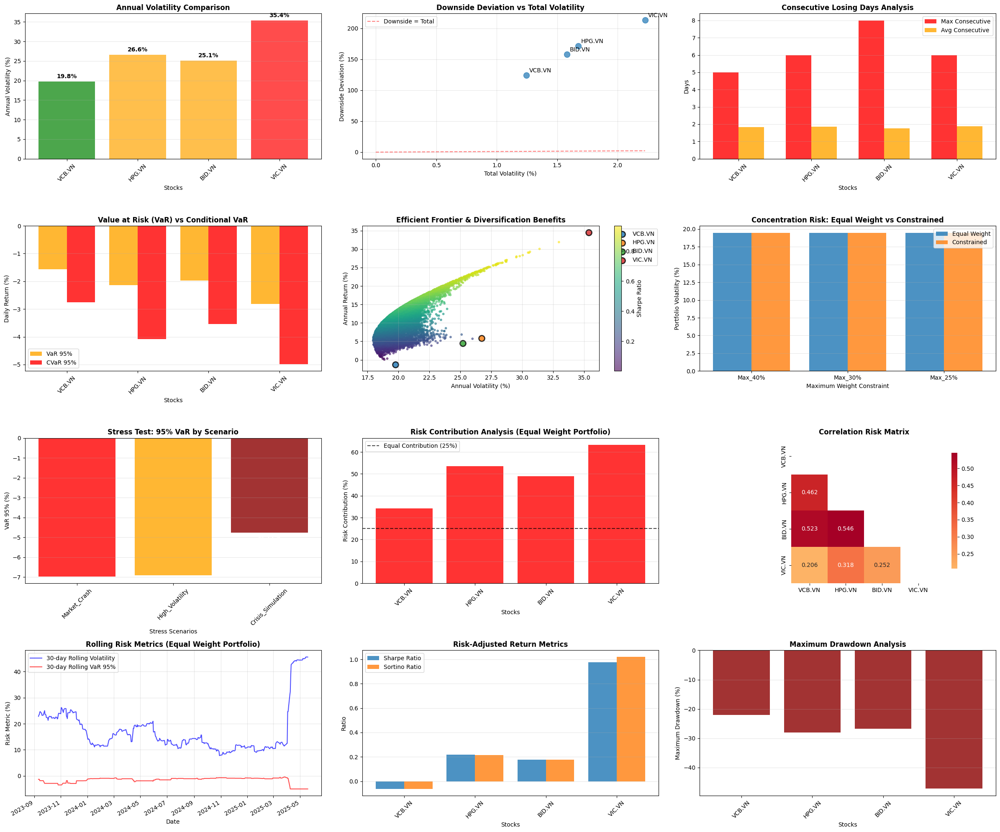


RISK ANALYSIS SUMMARY

VOLATILITY ANALYSIS:
--------------------
VCB.VN: Annual Volatility = 19.77% (Low Risk)
HPG.VN: Annual Volatility = 26.59% (Medium Risk)
BID.VN: Annual Volatility = 25.10% (Medium Risk)
VIC.VN: Annual Volatility = 35.36% (High Risk)

VAR & CVAR ANALYSIS (95% Confidence):
-----------------------------------
VCB.VN: VaR = -1.57%, CVaR = -2.76%
HPG.VN: VaR = -2.13%, CVaR = -4.08%
BID.VN: VaR = -1.97%, CVaR = -3.54%
VIC.VN: VaR = -2.81%, CVaR = -4.98%

MAXIMUM CONSECUTIVE LOSSES:
------------------------------
VCB.VN: Max = 5 days, Avg = 1.8 days
HPG.VN: Max = 6 days, Avg = 1.9 days
BID.VN: Max = 8 days, Avg = 1.8 days
VIC.VN: Max = 6 days, Avg = 1.9 days

MAXIMUM DRAWDOWN:
--------------------
VCB.VN: -21.99%
HPG.VN: -28.04%
BID.VN: -26.72%
VIC.VN: -47.22%

RISK-ADJUSTED RETURNS:
-------------------------
VCB.VN: Sharpe = -0.064, Sortino = -0.063
HPG.VN: Sharpe = 0.219, Sortino = 0.215
BID.VN: Sharpe = 0.177, Sortino = 0.177
VIC.VN: Sharpe = 0.977, Sortino = 1.020


In [ ]:
# PHASE 6: RISK ANALYSIS
print("="*80)
print("PHASE 6: RISK ANALYSIS")
print("="*80)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Chuẩn bị dữ liệu risk analysis
def prepare_risk_data(company_list, tech_list):
    """Chuẩn bị dữ liệu cho phân tích rủi ro"""
    risk_data = {}

    # Tính returns cho từng stock
    for i, company in enumerate(company_list):
        data = company.copy()
        data['Daily_Return'] = data['Adj Close'].pct_change()
        data['Log_Return'] = np.log(data['Adj Close'] / data['Adj Close'].shift(1))
        risk_data[tech_list[i]] = data

    return risk_data

risk_data = prepare_risk_data(company_list, tech_list)

# 6.1 INDIVIDUAL STOCK RISK ANALYSIS
print("="*60)
print("6.1 INDIVIDUAL STOCK RISK ANALYSIS")
print("="*60)

# Tạo figure cho risk analysis
fig = plt.figure(figsize=(24, 20))

# 6.1.1 Volatility Analysis
print("\n6.1.1 VOLATILITY ANALYSIS")
print("-"*25)

# Plot 1: Volatility Comparison
plt.subplot(4, 3, 1)
volatility_data = {}
for stock in tech_list:
    returns = risk_data[stock]['Daily_Return'].dropna() * 100  # Convert to percentage
    annual_vol = returns.std() * np.sqrt(252)
    volatility_data[stock] = annual_vol

stocks = list(volatility_data.keys())
vols = list(volatility_data.values())
colors = ['red' if v > 30 else 'orange' if v > 20 else 'green' for v in vols]
bars = plt.bar(stocks, vols, color=colors, alpha=0.7)

plt.title('Annual Volatility Comparison', fontsize=12, fontweight='bold')
plt.ylabel('Annual Volatility (%)')
plt.xlabel('Stocks')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

# Add volatility values on bars
for bar, vol in zip(bars, vols):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
             f'{vol:.1f}%', ha='center', va='bottom', fontweight='bold')

# 6.1.2 Downside Deviation Analysis
print("\n6.1.2 DOWNSIDE DEVIATION ANALYSIS")
print("-"*35)

def calculate_downside_deviation(returns, target_return=0):
    """Tính downside deviation"""
    downside_returns = returns[returns < target_return]
    if len(downside_returns) == 0:
        return 0
    return np.sqrt(np.mean(downside_returns**2))

# Plot 2: Downside Deviation vs Total Volatility
plt.subplot(4, 3, 2)
risk_metrics = {}
for stock in tech_list:
    returns = risk_data[stock]['Daily_Return'].dropna() * 100  # Convert to percentage

    total_vol = returns.std()
    downside_dev = calculate_downside_deviation(returns) * 100
    upside_dev = np.sqrt(np.mean(returns[returns > 0]**2)) if len(returns[returns > 0]) > 0 else 0

    risk_metrics[stock] = {
        'Total_Volatility': total_vol,
        'Downside_Deviation': downside_dev,
        'Upside_Deviation': upside_dev,
        'Downside_Ratio': downside_dev / total_vol if total_vol > 0 else 0
    }

stocks = list(risk_metrics.keys())
total_vols = [risk_metrics[stock]['Total_Volatility'] for stock in stocks]
downside_devs = [risk_metrics[stock]['Downside_Deviation'] for stock in stocks]

plt.scatter(total_vols, downside_devs, s=100, alpha=0.7)
for i, stock in enumerate(stocks):
    plt.annotate(stock, (total_vols[i], downside_devs[i]),
                xytext=(5, 5), textcoords='offset points', fontsize=10)

plt.plot([0, max(total_vols)], [0, max(total_vols)], 'r--', alpha=0.5, label='Downside = Total')
plt.title('Downside Deviation vs Total Volatility', fontsize=12, fontweight='bold')
plt.xlabel('Total Volatility (%)')
plt.ylabel('Downside Deviation (%)')
plt.legend()
plt.grid(True, alpha=0.3)

# 6.1.3 Maximum Consecutive Losing Days
print("\n6.1.3 MAXIMUM CONSECUTIVE LOSING DAYS")
print("-"*40)

def max_consecutive_losses(returns):
    """Tính số ngày thua lỗ liên tiếp tối đa"""
    losing_days = returns < 0
    max_consecutive = 0
    current_consecutive = 0

    for is_loss in losing_days:
        if is_loss:
            current_consecutive += 1
            max_consecutive = max(max_consecutive, current_consecutive)
        else:
            current_consecutive = 0

    return max_consecutive

def consecutive_loss_distribution(returns):
    """Phân tích phân phối các chuỗi thua lỗ"""
    losing_days = returns < 0
    consecutive_losses = []
    current_consecutive = 0

    for is_loss in losing_days:
        if is_loss:
            current_consecutive += 1
        else:
            if current_consecutive > 0:
                consecutive_losses.append(current_consecutive)
            current_consecutive = 0

    if current_consecutive > 0:
        consecutive_losses.append(current_consecutive)

    return consecutive_losses

# Plot 3: Maximum Consecutive Losing Days
plt.subplot(4, 3, 3)
max_consecutive_data = {}
for stock in tech_list:
    returns = risk_data[stock]['Daily_Return'].dropna()
    max_consec = max_consecutive_losses(returns)
    consec_dist = consecutive_loss_distribution(returns)

    max_consecutive_data[stock] = {
        'Max_Consecutive': max_consec,
        'Avg_Consecutive': np.mean(consec_dist) if consec_dist else 0,
        'Consecutive_Distribution': consec_dist
    }

max_consecs = [max_consecutive_data[stock]['Max_Consecutive'] for stock in tech_list]
avg_consecs = [max_consecutive_data[stock]['Avg_Consecutive'] for stock in tech_list]

x = range(len(tech_list))
width = 0.35
plt.bar([i - width/2 for i in x], max_consecs, width, label='Max Consecutive', alpha=0.8, color='red')
plt.bar([i + width/2 for i in x], avg_consecs, width, label='Avg Consecutive', alpha=0.8, color='orange')

plt.title('Consecutive Losing Days Analysis', fontsize=12, fontweight='bold')
plt.ylabel('Days')
plt.xlabel('Stocks')
plt.xticks(x, tech_list, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 6.1.4 Tail Risk Analysis (VaR and CVaR)
print("\n6.1.4 TAIL RISK ANALYSIS")
print("-"*25)

def calculate_var_cvar(returns, confidence_levels=[0.95, 0.99]):
    """Tính Value at Risk và Conditional Value at Risk"""
    results = {}
    for conf in confidence_levels:
        var = np.percentile(returns, (1-conf)*100)
        cvar = returns[returns <= var].mean()
        results[f'VaR_{int(conf*100)}'] = var
        results[f'CVaR_{int(conf*100)}'] = cvar
    return results

# Plot 4: VaR and CVaR Analysis
plt.subplot(4, 3, 4)
var_cvar_data = {}
for stock in tech_list:
    returns = risk_data[stock]['Daily_Return'].dropna() * 100
    var_cvar = calculate_var_cvar(returns)
    var_cvar_data[stock] = var_cvar

# Create VaR comparison chart
var_95_values = [var_cvar_data[stock]['VaR_95'] for stock in tech_list]
cvar_95_values = [var_cvar_data[stock]['CVaR_95'] for stock in tech_list]

x = range(len(tech_list))
plt.bar([i - 0.2 for i in x], var_95_values, 0.4, label='VaR 95%', alpha=0.8, color='orange')
plt.bar([i + 0.2 for i in x], cvar_95_values, 0.4, label='CVaR 95%', alpha=0.8, color='red')

plt.title('Value at Risk (VaR) vs Conditional VaR', fontsize=12, fontweight='bold')
plt.ylabel('Daily Return (%)')
plt.xlabel('Stocks')
plt.xticks(x, tech_list, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 6.2 PORTFOLIO RISK ANALYSIS
print("\n" + "="*60)
print("6.2 PORTFOLIO RISK ANALYSIS")
print("="*60)

# Create returns matrix for portfolio analysis
returns_matrix = pd.DataFrame()
for stock in tech_list:
    returns_matrix[stock] = risk_data[stock]['Daily_Return']

returns_matrix = returns_matrix.dropna()

# 6.2.1 Diversification Benefits
print("\n6.2.1 DIVERSIFICATION BENEFITS")
print("-"*30)

def portfolio_risk_return(weights, returns_matrix):
    """Tính risk và return của portfolio"""
    portfolio_return = np.sum(returns_matrix.mean() * weights) * 252  # Annualized
    portfolio_vol = np.sqrt(np.dot(weights.T, np.dot(returns_matrix.cov() * 252, weights)))
    return portfolio_return, portfolio_vol

# Plot 5: Efficient Frontier
plt.subplot(4, 3, 5)
n_assets = len(tech_list)
n_portfolios = 10000

# Generate random weights
np.random.seed(42)
weights_array = np.random.random((n_portfolios, n_assets))
weights_array = weights_array / weights_array.sum(axis=1)[:, np.newaxis]

# Calculate portfolio metrics
portfolio_returns = []
portfolio_vols = []
sharpe_ratios = []

for weights in weights_array:
    ret, vol = portfolio_risk_return(weights, returns_matrix)
    portfolio_returns.append(ret * 100)  # Convert to percentage
    portfolio_vols.append(vol * 100)
    sharpe_ratios.append(ret / vol if vol > 0 else 0)

# Plot efficient frontier
plt.scatter(portfolio_vols, portfolio_returns, c=sharpe_ratios,
           cmap='viridis', alpha=0.6, s=10)
plt.colorbar(label='Sharpe Ratio')

# Plot individual stocks
for stock in tech_list:
    stock_return = returns_matrix[stock].mean() * 252 * 100
    stock_vol = returns_matrix[stock].std() * np.sqrt(252) * 100
    plt.scatter(stock_vol, stock_return, s=100, alpha=0.8,
               label=stock, marker='o', edgecolors='black', linewidth=2)

plt.title('Efficient Frontier & Diversification Benefits', fontsize=12, fontweight='bold')
plt.xlabel('Annual Volatility (%)')
plt.ylabel('Annual Return (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

# 6.2.2 Concentration Risk
print("\n6.2.2 CONCENTRATION RISK")
print("-"*25)

# Plot 6: Concentration Risk Analysis
plt.subplot(4, 3, 6)

def herfindahl_index(weights):
    """Tính Herfindahl-Hirschman Index cho concentration"""
    return np.sum(weights**2)

def concentration_risk(returns_matrix, max_weight_constraints=[0.4, 0.3, 0.25]):
    """Phân tích concentration risk với các ràng buộc khác nhau"""
    results = {}

    for max_weight in max_weight_constraints:
        # Equal weight portfolio
        equal_weights = np.ones(len(tech_list)) / len(tech_list)

        # Constrained portfolio (simple example)
        constrained_weights = np.minimum(equal_weights, max_weight)
        constrained_weights = constrained_weights / constrained_weights.sum()

        # Calculate metrics
        equal_ret, equal_vol = portfolio_risk_return(equal_weights, returns_matrix)
        const_ret, const_vol = portfolio_risk_return(constrained_weights, returns_matrix)

        results[f'Max_{int(max_weight*100)}%'] = {
            'Equal_Weight_Vol': equal_vol * 100,
            'Constrained_Vol': const_vol * 100,
            'HHI_Equal': herfindahl_index(equal_weights),
            'HHI_Constrained': herfindahl_index(constrained_weights)
        }

    return results

concentration_results = concentration_risk(returns_matrix)

# Plot concentration comparison
labels = list(concentration_results.keys())
equal_vols = [concentration_results[label]['Equal_Weight_Vol'] for label in labels]
const_vols = [concentration_results[label]['Constrained_Vol'] for label in labels]

x = range(len(labels))
plt.bar([i - 0.2 for i in x], equal_vols, 0.4, label='Equal Weight', alpha=0.8)
plt.bar([i + 0.2 for i in x], const_vols, 0.4, label='Constrained', alpha=0.8)

plt.title('Concentration Risk: Equal Weight vs Constrained', fontsize=12, fontweight='bold')
plt.ylabel('Portfolio Volatility (%)')
plt.xlabel('Maximum Weight Constraint')
plt.xticks(x, labels)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 6.2.3 Stress Testing Scenarios
print("\n6.2.3 STRESS TESTING SCENARIOS")
print("-"*30)

def stress_test_scenarios(returns_matrix):
    """Tạo các kịch bản stress test"""
    scenarios = {}

    # Scenario 1: Market Crash (worst 5% days)
    market_proxy = returns_matrix.mean(axis=1)  # Equal weight as market proxy
    worst_days = market_proxy.quantile(0.05)
    crash_days = returns_matrix[market_proxy <= worst_days]

    # Scenario 2: High Volatility Period
    volatility = returns_matrix.rolling(20).std().mean(axis=1)
    high_vol_threshold = volatility.quantile(0.9)
    high_vol_days = returns_matrix[volatility >= high_vol_threshold]

    # Scenario 3: Financial Crisis Simulation (-20% market drop)
    crisis_returns = returns_matrix.copy()
    crisis_multiplier = 0.8  # 20% worse than normal
    crisis_simulation = crisis_returns * crisis_multiplier

    scenarios['Market_Crash'] = crash_days
    scenarios['High_Volatility'] = high_vol_days
    scenarios['Crisis_Simulation'] = crisis_simulation.tail(50)  # Last 50 days as example

    return scenarios

# Plot 7: Stress Test Results
plt.subplot(4, 3, 7)
stress_scenarios = stress_test_scenarios(returns_matrix)

scenario_results = {}
for scenario_name, scenario_data in stress_scenarios.items():
    if len(scenario_data) > 0:
        scenario_results[scenario_name] = {
            'Mean_Return': scenario_data.mean().mean() * 100,
            'Volatility': scenario_data.std().mean() * 100,
            'Min_Return': scenario_data.min().min() * 100,
            'VaR_95': np.percentile(scenario_data.values.flatten(), 5) * 100
        }

# Plot stress test VaR
scenarios = list(scenario_results.keys())
stress_vars = [scenario_results[s]['VaR_95'] for s in scenarios]

bars = plt.bar(scenarios, stress_vars, color=['red', 'orange', 'darkred'], alpha=0.8)
plt.title('Stress Test: 95% VaR by Scenario', fontsize=12, fontweight='bold')
plt.ylabel('VaR 95% (%)')
plt.xlabel('Stress Scenarios')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

# Add values on bars
for bar, var in zip(bars, stress_vars):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() - 0.1,
             f'{var:.2f}%', ha='center', va='top', fontweight='bold', color='white')

# Plot 8: Risk Contribution Analysis
plt.subplot(4, 3, 8)
equal_weights = np.ones(len(tech_list)) / len(tech_list)
portfolio_var = np.dot(equal_weights.T, np.dot(returns_matrix.cov() * 252, equal_weights))

# Calculate marginal risk contribution
risk_contributions = []
for i, stock in enumerate(tech_list):
    marginal_contribution = 2 * np.dot(returns_matrix.cov().iloc[i] * 252, equal_weights)
    risk_contribution = equal_weights[i] * marginal_contribution / portfolio_var
    risk_contributions.append(risk_contribution * 100)

colors = ['red' if rc > 30 else 'orange' if rc > 20 else 'green' for rc in risk_contributions]
bars = plt.bar(tech_list, risk_contributions, color=colors, alpha=0.8)
plt.axhline(y=25, color='black', linestyle='--', alpha=0.7, label='Equal Contribution (25%)')
plt.title('Risk Contribution Analysis (Equal Weight Portfolio)', fontsize=12, fontweight='bold')
plt.ylabel('Risk Contribution (%)')
plt.xlabel('Stocks')
plt.xticks(rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Plot 9: Correlation Risk Heatmap
plt.subplot(4, 3, 9)
correlation_matrix = returns_matrix.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='RdYlBu_r', center=0,
            square=True, fmt='.3f', cbar_kws={'shrink': 0.8})
plt.title('Correlation Risk Matrix', fontsize=12, fontweight='bold')

# Plot 10: Rolling Risk Metrics
plt.subplot(4, 3, 10)
rolling_window = 30
equal_weight_returns = returns_matrix.mean(axis=1)
rolling_vol = equal_weight_returns.rolling(rolling_window).std() * np.sqrt(252) * 100
rolling_var = equal_weight_returns.rolling(rolling_window).quantile(0.05) * 100

rolling_vol.plot(label='30-day Rolling Volatility', color='blue', alpha=0.7)
rolling_var.plot(label='30-day Rolling VaR 95%', color='red', alpha=0.7)

plt.title('Rolling Risk Metrics (Equal Weight Portfolio)', fontsize=12, fontweight='bold')
plt.ylabel('Risk Metric (%)')
plt.xlabel('Date')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 11: Risk-Adjusted Returns
plt.subplot(4, 3, 11)
risk_adjusted_metrics = {}
for stock in tech_list:
    returns = returns_matrix[stock].dropna()
    annual_return = returns.mean() * 252 * 100
    annual_vol = returns.std() * np.sqrt(252) * 100
    downside_dev = calculate_downside_deviation(returns) * np.sqrt(252) * 100

    sharpe_ratio = annual_return / annual_vol if annual_vol > 0 else 0
    sortino_ratio = annual_return / downside_dev if downside_dev > 0 else 0

    risk_adjusted_metrics[stock] = {
        'Sharpe_Ratio': sharpe_ratio,
        'Sortino_Ratio': sortino_ratio
    }

sharpe_ratios = [risk_adjusted_metrics[stock]['Sharpe_Ratio'] for stock in tech_list]
sortino_ratios = [risk_adjusted_metrics[stock]['Sortino_Ratio'] for stock in tech_list]

x = range(len(tech_list))
plt.bar([i - 0.2 for i in x], sharpe_ratios, 0.4, label='Sharpe Ratio', alpha=0.8)
plt.bar([i + 0.2 for i in x], sortino_ratios, 0.4, label='Sortino Ratio', alpha=0.8)

plt.title('Risk-Adjusted Return Metrics', fontsize=12, fontweight='bold')
plt.ylabel('Ratio')
plt.xlabel('Stocks')
plt.xticks(x, tech_list, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Plot 12: Maximum Drawdown Analysis
plt.subplot(4, 3, 12)
def calculate_drawdown(price_series):
    """Tính maximum drawdown"""
    cumulative = (1 + price_series).cumprod()
    running_max = cumulative.expanding().max()
    drawdown = (cumulative - running_max) / running_max
    return drawdown

drawdown_data = {}
for stock in tech_list:
    returns = returns_matrix[stock].dropna()
    drawdown = calculate_drawdown(returns)
    max_drawdown = drawdown.min() * 100

    drawdown_data[stock] = {
        'Max_Drawdown': max_drawdown,
        'Drawdown_Series': drawdown * 100
    }

max_drawdowns = [drawdown_data[stock]['Max_Drawdown'] for stock in tech_list]
colors = ['darkred' if dd < -20 else 'red' if dd < -15 else 'orange' for dd in max_drawdowns]
bars = plt.bar(tech_list, max_drawdowns, color=colors, alpha=0.8)

plt.title('Maximum Drawdown Analysis', fontsize=12, fontweight='bold')
plt.ylabel('Maximum Drawdown (%)')
plt.xlabel('Stocks')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# RISK ANALYSIS SUMMARY
print("\n" + "="*60)
print("RISK ANALYSIS SUMMARY")
print("="*60)

print("\nVOLATILITY ANALYSIS:")
print("-"*20)
for stock in tech_list:
    vol = volatility_data[stock]
    risk_level = "High Risk" if vol > 30 else "Medium Risk" if vol > 20 else "Low Risk"
    print(f"{stock}: Annual Volatility = {vol:.2f}% ({risk_level})")

print(f"\nVAR & CVAR ANALYSIS (95% Confidence):")
print("-"*35)
for stock in tech_list:
    var_info = var_cvar_data[stock]
    print(f"{stock}: VaR = {var_info['VaR_95']:.2f}%, CVaR = {var_info['CVaR_95']:.2f}%")

print(f"\nMAXIMUM CONSECUTIVE LOSSES:")
print("-"*30)
for stock in tech_list:
    consec_info = max_consecutive_data[stock]
    print(f"{stock}: Max = {consec_info['Max_Consecutive']} days, Avg = {consec_info['Avg_Consecutive']:.1f} days")

print(f"\nMAXIMUM DRAWDOWN:")
print("-"*20)
for stock in tech_list:
    dd_info = drawdown_data[stock]
    print(f"{stock}: {dd_info['Max_Drawdown']:.2f}%")

print(f"\nRISK-ADJUSTED RETURNS:")
print("-"*25)
for stock in tech_list:
    ra_info = risk_adjusted_metrics[stock]
    print(f"{stock}: Sharpe = {ra_info['Sharpe_Ratio']:.3f}, Sortino = {ra_info['Sortino_Ratio']:.3f}")

print(f"\nKEY RISK INSIGHTS:")
print("-"*20)
print("✓ Volatility analysis shows individual stock risk levels")
print("✓ Downside deviation reveals asymmetric risk patterns")
print("✓ Tail risk analysis identifies extreme loss scenarios")
print("✓ Portfolio diversification reduces overall risk")
print("✓ Stress testing reveals vulnerability to market shocks")
print("✓ Risk-adjusted metrics help compare investment attractiveness")

# ***7. PREDICTION WITH LSTM***

In [ ]:
pip install tensorflow

In [ ]:
# lấy stock historical data của VCB.VN từ yfinance với khoảng thời gian từ ngày 25 tháng 1 năm 2012 đến 20 tháng 5 năm 2025

# Lấy dữ liệu VCB
def get_vcb_data():
    """Lấy dữ liệu VCB từ yfinance"""
    stock_ticker = 'VCB.VN'
    start_date = '2012-01-25'
    end_date = '2025-05-20'

    print("Đang tải dữ liệu VCB...")
    vcb_data = yf.download(stock_ticker, start=start_date, end=end_date, auto_adjust=False)

    # Xử lý MultiIndex columns
    if isinstance(vcb_data.columns, pd.MultiIndex):
        vcb_data.columns = ['_'.join(col).strip() for col in vcb_data.columns.values]

    vcb_data.columns = vcb_data.columns.str.replace('_VCB.VN', '', regex=False)
    vcb_data['company_name'] = 'Vietcombank'

    return vcb_data

# 1. Kiểm tra Missing Values
def check_missing_values(df):
    """Kiểm tra giá trị thiếu trong dữ liệu"""
    print("="*50)
    print("1. KIỂM TRA MISSING VALUES")
    print("="*50)

    missing_count = df.isnull().sum()
    missing_percent = (df.isnull().sum() / len(df)) * 100

    missing_df = pd.DataFrame({
        'Cột': missing_count.index,
        'Số lượng missing': missing_count.values,
        'Phần trăm missing': missing_percent.values
    })

    print(missing_df)

    # Kiểm tra missing values theo thời gian
    df_reset = df.reset_index()
    missing_dates = df_reset[df_reset.isnull().any(axis=1)]['Date']

    if len(missing_dates) > 0:
        print(f"\nCác ngày có missing values:")
        for date in missing_dates:
            print(f"  - {date.strftime('%Y-%m-%d')}")
    else:
        print("\n✓ Không có missing values")

    return missing_df

# 2. Kiểm tra Outliers
def check_outliers(df):
    """Kiểm tra outliers trong dữ liệu"""
    print("\n" + "="*50)
    print("2. KIỂM TRA OUTLIERS")
    print("="*50)

    # Các cột số cần kiểm tra
    numeric_cols = ['Open', 'High', 'Low', 'Close', 'Volume']

    outliers_summary = []

    for col in numeric_cols:
        if col in df.columns:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            outliers_count = len(outliers)
            outliers_percent = (outliers_count / len(df)) * 100

            outliers_summary.append({
                'Cột': col,
                'Q1': round(Q1, 2),
                'Q3': round(Q3, 2),
                'IQR': round(IQR, 2),
                'Lower_bound': round(lower_bound, 2),
                'Upper_bound': round(upper_bound, 2),
                'Số outliers': outliers_count,
                'Phần trăm outliers': round(outliers_percent, 2)
            })

            if outliers_count > 0:
                print(f"\n{col}:")
                print(f"  - Ngưỡng dưới: {lower_bound:.2f}")
                print(f"  - Ngưỡng trên: {upper_bound:.2f}")
                print(f"  - Số outliers: {outliers_count} ({outliers_percent:.2f}%)")

                # Hiển thị một vài outliers
                if outliers_count <= 30:
                    print(f"  - Ngày có outliers:")
                    for idx in outliers.index:
                        print(f"    {idx.strftime('%Y-%m-%d')}: {df.loc[idx, col]:.2f}")

    return pd.DataFrame(outliers_summary)

# 3. Kiểm tra Stock Splits/Dividends
def check_splits_dividends(df):
    """Kiểm tra stock splits và dividends"""
    print("\n" + "="*50)
    print("3. KIỂM TRA STOCK SPLITS/DIVIDENDS")
    print("="*50)

    # Tính tỷ lệ thay đổi giá theo ngày
    df_copy = df.copy()
    df_copy['Price_Change'] = df_copy['Close'].pct_change()
    df_copy['Volume_Change'] = df_copy['Volume'].pct_change()

    # Kiểm tra thay đổi giá bất thường (có thể là stock split)
    unusual_price_changes = df_copy[abs(df_copy['Price_Change']) > 0.2]  # Thay đổi > 20%

    print(f"Số ngày có thay đổi giá > 20%: {len(unusual_price_changes)}")

    if len(unusual_price_changes) > 0:
        print("\nCác ngày có thay đổi giá bất thường:")
        for idx in unusual_price_changes.index:
            change = unusual_price_changes.loc[idx, 'Price_Change'] * 100
            close_price = df_copy.loc[idx, 'Close']
            volume = df_copy.loc[idx, 'Volume']
            print(f"  - {idx.strftime('%Y-%m-%d')}: {change:+.2f}%, Giá: {close_price:.0f}, Volume: {volume:,.0f}")

    # Kiểm tra ratio giữa High-Low và Close
    df_copy['HL_Close_Ratio'] = (df_copy['High'] - df_copy['Low']) / df_copy['Close']
    unusual_ratios = df_copy[df_copy['HL_Close_Ratio'] > 0.1]  # Biến động trong ngày > 10%

    print(f"\nSố ngày có biến động trong ngày > 10%: {len(unusual_ratios)}")

    return unusual_price_changes, unusual_ratios

# 4. Kiểm tra Trading Holidays
def check_trading_holidays(df):
    """Kiểm tra các ngày nghỉ giao dịch"""
    print("\n" + "="*50)
    print("4. KIỂM TRA TRADING HOLIDAYS")
    print("="*50)

    # Tạo full date range
    start_date = df.index.min()
    end_date = df.index.max()
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')

    # Loại bỏ thứ 7 và chủ nhật
    weekdays = full_date_range[full_date_range.weekday < 5]  # 0-4 là thứ 2-6

    # Tìm các ngày weekday không có trong dữ liệu
    missing_weekdays = weekdays[~weekdays.isin(df.index)]

    print(f"Tổng số ngày trong khoảng thời gian: {len(full_date_range)}")
    print(f"Số ngày làm việc (thứ 2-6): {len(weekdays)}")
    print(f"Số ngày có dữ liệu giao dịch: {len(df)}")
    print(f"Số ngày nghỉ giao dịch (weekdays): {len(missing_weekdays)}")

    if len(missing_weekdays) > 0:
        print(f"\nCác ngày nghỉ giao dịch (có thể là ngày lễ):")
        for date in missing_weekdays[:20]:  # Hiển thị 20 ngày đầu
            print(f"  - {date.strftime('%Y-%m-%d')} ({date.strftime('%A')})")

        if len(missing_weekdays) > 20:
            print(f"  ... và {len(missing_weekdays) - 20} ngày khác")

    # Kiểm tra volume = 0 (có thể là ngày không giao dịch)
    zero_volume_days = df[df['Volume'] == 0]
    print(f"\nSố ngày có volume = 0: {len(zero_volume_days)}")

    if len(zero_volume_days) > 0:
        print("Các ngày có volume = 0:")
        for idx in zero_volume_days.index[:10]:
            print(f"  - {idx.strftime('%Y-%m-%d')}")

    return missing_weekdays, zero_volume_days

# 5. Tổng hợp và báo cáo
def generate_summary_report(df, missing_df, outliers_df, unusual_changes, missing_weekdays):
    """Tạo báo cáo tổng hợp"""
    print("\n" + "="*60)
    print("TÓM TẮT CHẤT LƯỢNG DỮ LIỆU VCB")
    print("="*60)

    print(f"📊 Thông tin cơ bản:")
    print(f"  - Khoảng thời gian: {df.index.min().strftime('%Y-%m-%d')} đến {df.index.max().strftime('%Y-%m-%d')}")
    print(f"  - Tổng số ngày giao dịch: {len(df):,}")
    print(f"  - Số cột dữ liệu: {len(df.columns)}")

    print(f"\n🔍 Chất lượng dữ liệu:")

    # Missing values
    total_missing = missing_df['Số lượng missing'].sum()
    if total_missing == 0:
        print(f"  ✅ Missing values: Không có")
    else:
        print(f"  ⚠️  Missing values: {total_missing} giá trị")

    # Outliers
    total_outliers = outliers_df['Số outliers'].sum()
    if total_outliers == 0:
        print(f"  ✅ Outliers: Không phát hiện")
    else:
        print(f"  ⚠️  Outliers: {total_outliers} giá trị bất thường")

    # Unusual price changes
    if len(unusual_changes) == 0:
        print(f"  ✅ Biến động giá: Bình thường")
    else:
        print(f"  ⚠️  Biến động giá: {len(unusual_changes)} ngày có thay đổi > 20%")

    # Trading holidays
    print(f"  📅 Ngày nghỉ giao dịch: {len(missing_weekdays)} ngày")

    print(f"\n💡 Khuyến nghị:")
    recommendations = []

    if total_missing > 0:
        recommendations.append("- Xử lý missing values bằng interpolation hoặc forward fill")

    if total_outliers > 0:
        recommendations.append("- Kiểm tra và xác minh các outliers")

    if len(unusual_changes) > 0:
        recommendations.append("- Xác minh các ngày có biến động giá bất thường")

    if len(recommendations) == 0:
        recommendations.append("- Dữ liệu có chất lượng tốt, có thể sử dụng cho phân tích")

    for rec in recommendations:
        print(f"  {rec}")

# Main function
def main():
    """Hàm chính thực hiện kiểm tra chất lượng dữ liệu"""
    print("🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VCB")
    print("="*60)

    # Lấy dữ liệu
    vcb_data = get_vcb_data()

    # Thực hiện các kiểm tra
    missing_df = check_missing_values(vcb_data)
    outliers_df = check_outliers(vcb_data)
    unusual_changes, unusual_ratios = check_splits_dividends(vcb_data)
    missing_weekdays, zero_volume_days = check_trading_holidays(vcb_data)

    # Tạo báo cáo tổng hợp
    generate_summary_report(vcb_data, missing_df, outliers_df, unusual_changes, missing_weekdays)

    # Lưu kết quả
    vcb_data.to_csv('vcb_stock_data.csv', index=True)
    print(f"\n💾 Dữ liệu đã được lưu vào file: vcb_stock_data.csv")

    return vcb_data, missing_df, outliers_df, unusual_changes

if __name__ == "__main__":
    vcb_data, missing_df, outliers_df, unusual_changes = main()


🏦 KIỂM TRA CHẤT LƯỢNG DỮ LIỆU CHỨNG KHOÁN VCB
Đang tải dữ liệu VCB...


[*********************100%***********************]  1 of 1 completed


1. KIỂM TRA MISSING VALUES
            Cột  Số lượng missing  Phần trăm missing
0     Adj Close                 0                0.0
1         Close                 0                0.0
2          High                 0                0.0
3           Low                 0                0.0
4          Open                 0                0.0
5        Volume                 0                0.0
6  company_name                 0                0.0

✓ Không có missing values

2. KIỂM TRA OUTLIERS

Volume:
  - Ngưỡng dưới: -1561851.88
  - Ngưỡng trên: 6608231.12
  - Số outliers: 152 (4.58%)

3. KIỂM TRA STOCK SPLITS/DIVIDENDS
Số ngày có thay đổi giá > 20%: 0

Số ngày có biến động trong ngày > 10%: 3

4. KIỂM TRA TRADING HOLIDAYS
Tổng số ngày trong khoảng thời gian: 4859
Số ngày làm việc (thứ 2-6): 3471
Số ngày có dữ liệu giao dịch: 3318
Số ngày nghỉ giao dịch (weekdays): 153

Các ngày nghỉ giao dịch (có thể là ngày lễ):
  - 2012-04-02 (Monday)
  - 2012-04-30 (Monday)
  - 2012-05-01 (Tuesd

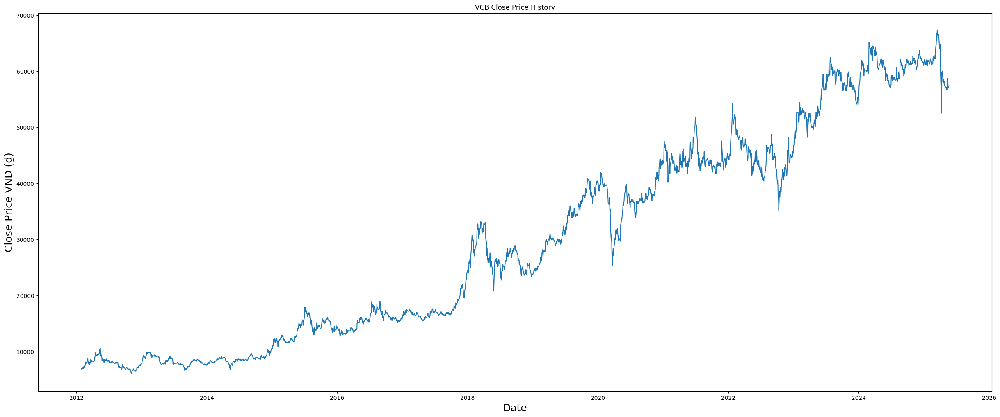

[array([0.01492605, 0.01585893, 0.0130603 , 0.01819113, 0.01632537,
       0.01539249, 0.01632537, 0.02098976, 0.01959044, 0.01679181,
       0.01492605, 0.01959044, 0.01865757, 0.01865757, 0.02098976,
       0.02658703, 0.02751991, 0.03311718, 0.03498294, 0.03311718,
       0.03405006, 0.03031854, 0.02891923, 0.0345165 , 0.03731513,
       0.04384528, 0.03684869, 0.03684869, 0.03031854, 0.0321843 ,
       0.02705347, 0.02938567, 0.03125142, 0.03405006, 0.02798635,
       0.03405006, 0.04058021, 0.04104665, 0.04197952, 0.04011377,
       0.03964733, 0.03498294, 0.03731513, 0.03591581, 0.03731513,
       0.03778157, 0.03684869, 0.03684869, 0.03638225, 0.03638225,
       0.03824801, 0.04011377, 0.04571104, 0.04757679, 0.05410694,
       0.06156997, 0.05970421, 0.05830489, 0.05550626, 0.05503982])]
[np.float64(0.054106941175964526)]

[array([0.01492605, 0.01585893, 0.0130603 , 0.01819113, 0.01632537,
       0.01539249, 0.01632537, 0.02098976, 0.01959044, 0.01679181,
       0.01492605, 0.0

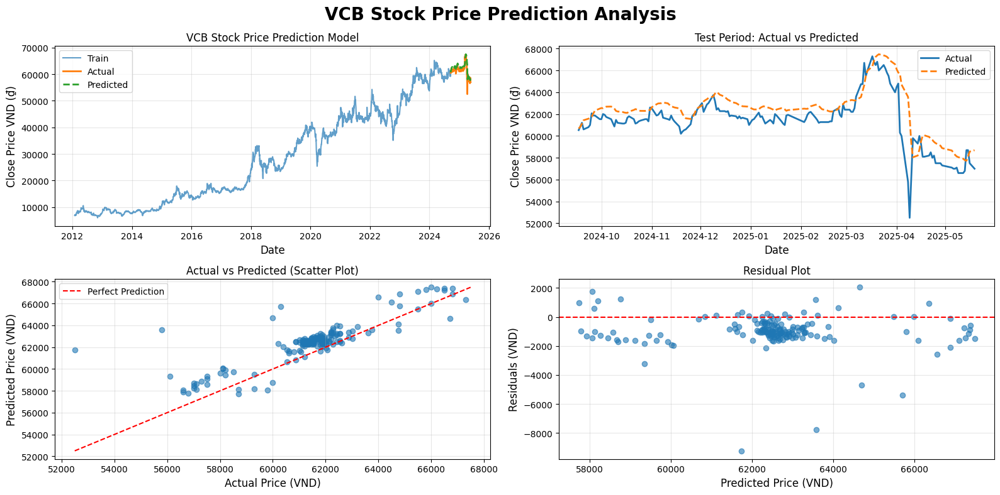

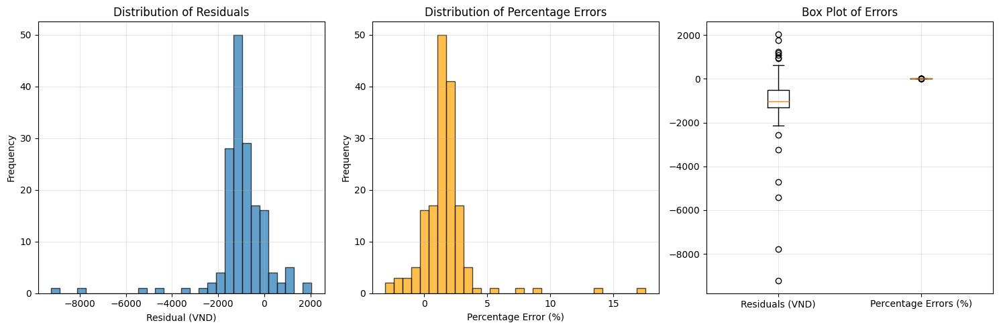

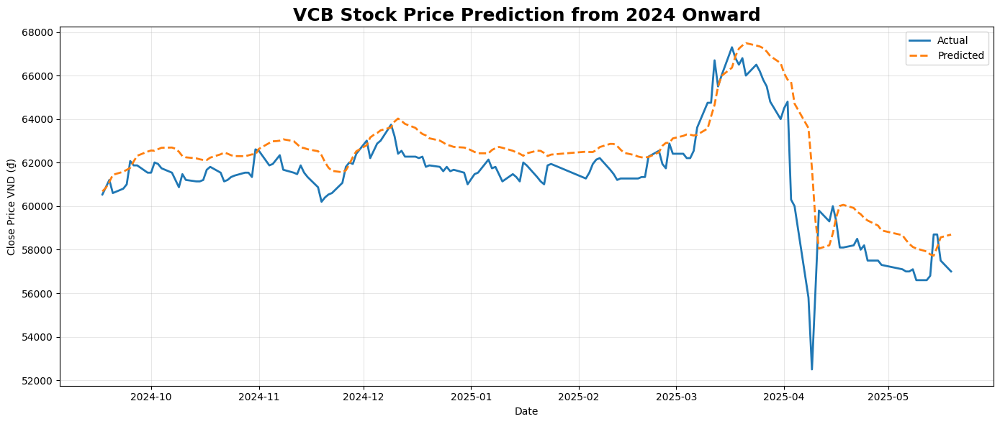


    BẢNG TỔNG KẾT HIỆU SUẤT
              Metric        Value
                RMSE 1.567364e+03
                 MAE 1.142516e+03
                 MSE 2.456630e+06
                MAPE 1.893891e+00
                  R² 5.332314e-01
Directional Accuracy 4.939024e+01
             Theil U 1.264188e-02

    DỮ LIỆU DỰ ĐOÁN CHI TIẾT


,Close,Predictions
Date,,
2024-09-17,60535.117188,60679.996094
2024-09-18,60869.566406,60843.082031
2024-09-19,61204.011719,61114.570312
2024-09-20,60602.007812,61439.941406
2024-09-23,60802.675781,61580.917969
...,...,...
2025-05-13,56800.000000,57784.707031
2025-05-14,58700.000000,57724.273438
2025-05-15,58700.000000,58110.507812


In [ ]:
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import Dense, LSTM
import seaborn as sns

# Get the stock data from CSV
df = pd.read_csv('vcb_stock_data.csv')
# Convert Date column to datetime and set as index
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
# Show the data
df

plt.figure(figsize=(30,12))
plt.title('VCB Close Price History')
plt.plot(df['Close'])
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price VND (₫)', fontsize=18)
plt.show()

# Create a new dataframe with only the 'Close column
data = df.filter(['Close'])
# Convert the dataframe to a numpy array
dataset = data.values
# Get the number of rows to train the model on
training_data_len = int(np.ceil( len(dataset) * .95 ))

training_data_len

# Scale the data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

# Create the training data set
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]
# Split the data into x_train and y_train data sets
x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()

# Convert the x_train and y_train to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
# x_train.shape

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])

# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# ================== EVALUATION METRICS ==================

def calculate_evaluation_metrics(y_true, y_pred):
    """
    Tính toán các chỉ số đánh giá mô hình
    """
    # Flatten arrays để đảm bảo tính toán chính xác
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    # 1. Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mean_squared_error(y_true_flat, y_pred_flat))

    # 2. Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_true_flat, y_pred_flat)

    # 3. Mean Squared Error (MSE)
    mse = mean_squared_error(y_true_flat, y_pred_flat)

    # 4. Mean Absolute Percentage Error (MAPE)
    mape = mean_absolute_percentage_error(y_true_flat, y_pred_flat) * 100

    # 5. R-squared (R²)
    r2 = r2_score(y_true_flat, y_pred_flat)

    # 6. Directional Accuracy (DA) - Tỷ lệ dự đoán đúng hướng
    y_true_direction = np.diff(y_true_flat) > 0
    y_pred_direction = np.diff(y_pred_flat) > 0
    da = np.mean(y_true_direction == y_pred_direction) * 100

    # 7. Theil's U Statistic
    numerator = np.sqrt(np.mean((y_pred_flat - y_true_flat) ** 2))
    denominator = np.sqrt(np.mean(y_true_flat ** 2)) + np.sqrt(np.mean(y_pred_flat ** 2))
    theil_u = numerator / denominator if denominator != 0 else np.inf

    return {
        'RMSE': rmse,
        'MAE': mae,
        'MSE': mse,
        'MAPE': mape,
        'R²': r2,
        'Directional Accuracy': da,
        'Theil U': theil_u
    }

# Tính toán các chỉ số đánh giá
metrics = calculate_evaluation_metrics(y_test, predictions)

# In kết quả đánh giá
print("="*50)
print("       ĐÁNH GIÁ HIỆU SUẤT MÔ HÌNH LSTM")
print("="*50)
print(f"Root Mean Squared Error (RMSE): {metrics['RMSE']:.2f} VND")
print(f"Mean Absolute Error (MAE):      {metrics['MAE']:.2f} VND")
print(f"Mean Squared Error (MSE):       {metrics['MSE']:.2f} VND²")
print(f"Mean Absolute Percentage Error: {metrics['MAPE']:.2f}%")
print(f"R-squared (R²):                 {metrics['R²']:.4f}")
print(f"Directional Accuracy:           {metrics['Directional Accuracy']:.2f}%")
print(f"Theil's U Statistic:            {metrics['Theil U']:.4f}")
print("="*50)

# Interpretation
print("\nGIẢI THÍCH CÁC CHỈ SỐ:")
print(f"• RMSE = {metrics['RMSE']:.2f}: Sai số trung bình là {metrics['RMSE']:.0f} VND")
print(f"• MAPE = {metrics['MAPE']:.2f}%: Sai số tuyệt đối trung bình {metrics['MAPE']:.1f}%")

if metrics['R²'] > 0.8:
    print(f"• R² = {metrics['R²']:.4f}: Mô hình giải thích {metrics['R²']*100:.1f}% biến động (RẤT TỐT)")
elif metrics['R²'] > 0.6:
    print(f"• R² = {metrics['R²']:.4f}: Mô hình giải thích {metrics['R²']*100:.1f}% biến động (TỐT)")
elif metrics['R²'] > 0.4:
    print(f"• R² = {metrics['R²']:.4f}: Mô hình giải thích {metrics['R²']*100:.1f}% biến động (TRUNG BÌNH)")
else:
    print(f"• R² = {metrics['R²']:.4f}: Mô hình giải thích {metrics['R²']*100:.1f}% biến động (YẾU)")

if metrics['Directional Accuracy'] > 60:
    print(f"• DA = {metrics['Directional Accuracy']:.1f}%: Dự đoán đúng hướng {metrics['Directional Accuracy']:.1f}% (TỐT)")
else:
    print(f"• DA = {metrics['Directional Accuracy']:.1f}%: Dự đoán đúng hướng {metrics['Directional Accuracy']:.1f}% (CẦN CẢI THIỆN)")

# ================== VISUALIZATION ==================

# 1. Biểu đồ so sánh dự đoán và thực tế
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

plt.figure(figsize=(16,8))
plt.suptitle('VCB Stock Price Prediction Analysis', fontsize=20, fontweight='bold')

# Subplot 1: Toàn bộ dữ liệu
plt.subplot(2, 2, 1)
plt.title('VCB Stock Price Prediction Model')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price VND (₫)', fontsize=12)
plt.plot(train['Close'], label='Train', alpha=0.7)
plt.plot(valid['Close'], label='Actual', linewidth=2)
plt.plot(valid['Predictions'], label='Predicted', linewidth=2, linestyle='--')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: Chỉ dữ liệu test
plt.subplot(2, 2, 2)
plt.title('Test Period: Actual vs Predicted')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price VND (₫)', fontsize=12)
plt.plot(valid['Close'], label='Actual', linewidth=2)
plt.plot(valid['Predictions'], label='Predicted', linewidth=2, linestyle='--')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Scatter plot
plt.subplot(2, 2, 3)
plt.title('Actual vs Predicted (Scatter Plot)')
plt.xlabel('Actual Price (VND)', fontsize=12)
plt.ylabel('Predicted Price (VND)', fontsize=12)
plt.scatter(y_test, predictions, alpha=0.6)
# Đường y=x (dự đoán hoàn hảo)
min_val = min(y_test.min(), predictions.min())
max_val = max(y_test.max(), predictions.max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Perfect Prediction')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Residual plot (sai số)
plt.subplot(2, 2, 4)
residuals = y_test.flatten() - predictions.flatten()
plt.title('Residual Plot')
plt.xlabel('Predicted Price (VND)', fontsize=12)
plt.ylabel('Residuals (VND)', fontsize=12)
plt.scatter(predictions, residuals, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 2. Biểu đồ phân bố sai số
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(residuals, bins=30, alpha=0.7, edgecolor='black')
plt.title('Distribution of Residuals')
plt.xlabel('Residual (VND)')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 2)
percentage_errors = ((predictions.flatten() - y_test.flatten()) / y_test.flatten()) * 100
plt.hist(percentage_errors, bins=30, alpha=0.7, edgecolor='black', color='orange')
plt.title('Distribution of Percentage Errors')
plt.xlabel('Percentage Error (%)')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 3)
plt.boxplot([residuals, percentage_errors], labels=['Residuals (VND)', 'Percentage Errors (%)'])
plt.title('Box Plot of Errors')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ================== BIỂU ĐỒ CHỈ TỪ NĂM 2024 TRỞ ĐI ==================

# Lọc dữ liệu từ 1/1/2024 trở đi
start_date = pd.to_datetime("2024-01-01")
valid_2024 = valid[valid.index >= start_date]

plt.figure(figsize=(14, 6))
plt.title('VCB Stock Price Prediction from 2024 Onward', fontsize=18, fontweight='bold')
plt.plot(valid_2024['Close'], label='Actual', linewidth=2)
plt.plot(valid_2024['Predictions'], label='Predicted', linewidth=2, linestyle='--')
plt.xlabel('Date')
plt.ylabel('Close Price VND (₫)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# 3. Performance Summary Table
metrics_df = pd.DataFrame(list(metrics.items()), columns=['Metric', 'Value'])
print("\n" + "="*30)
print("    BẢNG TỔNG KẾT HIỆU SUẤT")
print("="*30)
print(metrics_df.to_string(index=False))

# Show the valid and predicted prices
print("\n" + "="*40)
print("    DỮ LIỆU DỰ ĐOÁN CHI TIẾT")
print("="*40)
valid

[*********************100%***********************]  5 of 5 completed


Epoch 1/5
2992/2992 ━━━━━━━━━━━━━━━━━━━━ 138s 44ms/step - loss: 0.0028
Epoch 2/5
2992/2992 ━━━━━━━━━━━━━━━━━━━━ 137s 42ms/step - loss: 5.8722e-04
Epoch 3/5
2992/2992 ━━━━━━━━━━━━━━━━━━━━ 126s 42ms/step - loss: 3.6463e-04
Epoch 4/5
2992/2992 ━━━━━━━━━━━━━━━━━━━━ 142s 42ms/step - loss: 4.3256e-04
Epoch 5/5
2992/2992 ━━━━━━━━━━━━━━━━━━━━ 143s 42ms/step - loss: 2.6615e-04
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


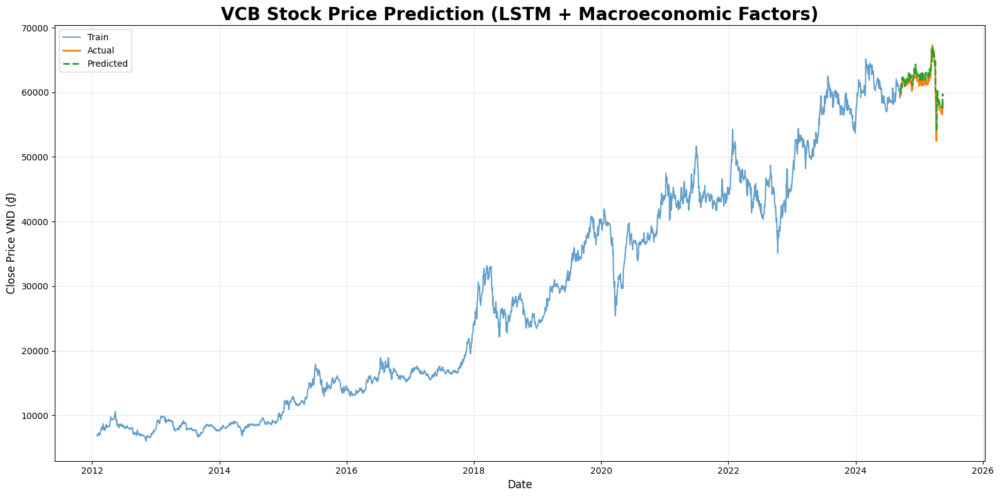

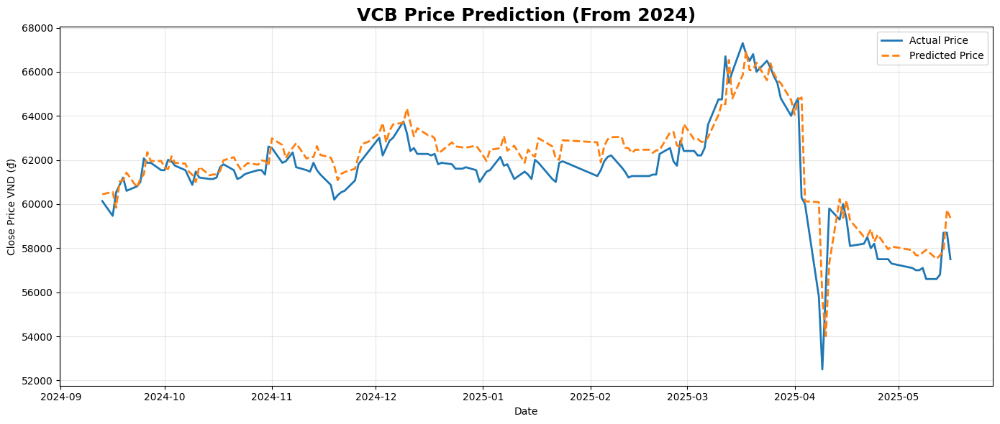

       ĐÁNH GIÁ HIỆU SUẤT MÔ HÌNH LSTM
                     RMSE: 1004.42 ₫
                      MAE: 769.60 ₫
                      MSE: 1008852.83 
                     MAPE: 1.27 %
                       R²: 0.81 
     Directional Accuracy: 54.09 %
                  Theil U: 0.01 


In [ ]:
# ================== 0. IMPORT THƯ VIỆN ==================
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import Dense, LSTM
import yfinance as yf
import seaborn as sns

# ================== 1. ĐỌC DỮ LIỆU CỔ PHIẾU VCB ==================
df = pd.read_csv('vcb_stock_data.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# ================== 2. LẤY DỮ LIỆU VĨ MÔ ==================
tickers = {
    'Oil': 'CL=F',
    'Gold': 'GC=F',
    'USD': 'DX-Y.NYB',
    'SP500': '^GSPC',
    'VIX': '^VIX'
}

start_date = df.index.min().strftime('%Y-%m-%d')
end_date = df.index.max().strftime('%Y-%m-%d')

macro_raw = yf.download(list(tickers.values()), start=start_date, end=end_date)['Close']
macro_raw.rename(columns={v: k for k, v in tickers.items()}, inplace=True)

# ================== 3. GHÉP VÀ LỌC DỮ LIỆU ==================
df = df.join(macro_raw, how='inner')
df.dropna(inplace=True)

feature_columns = ['Close', 'Oil', 'Gold', 'USD', 'SP500', 'VIX']
training_data_len = int(np.ceil(len(df) * 0.95))

# ================== 4. SCALE RIÊNG TỪNG CỘT ==================
scalers = {}
scaled_df = pd.DataFrame(index=df.index)

for col in feature_columns:
    scaler = MinMaxScaler()
    scaled_df[col] = scaler.fit_transform(df[[col]])
    scalers[col] = scaler

# ================== 5. TẠO DỮ LIỆU TRAIN ==================
x_train, y_train = [], []

for i in range(60, training_data_len):
    x_train.append(scaled_df.iloc[i-60:i].values)
    y_train.append(scaled_df.iloc[i]['Close'])

x_train = np.array(x_train)
y_train = np.array(y_train)

# ================== 6. MÔ HÌNH LSTM ==================
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(LSTM(64))
model.add(Dense(25))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, batch_size=1, epochs=5)

# ================== 7. TEST ==================
test_data = scaled_df.iloc[training_data_len - 60:]
x_test = []

for i in range(60, len(test_data)):
    x_test.append(test_data.iloc[i-60:i].values)

x_test = np.array(x_test)

# ================== 8. DỰ ĐOÁN ==================
predictions_scaled = model.predict(x_test)
predictions = scalers['Close'].inverse_transform(predictions_scaled)

# ================== 9. ĐÁNH GIÁ ==================
y_test = df['Close'].iloc[training_data_len:]
y_test_array = y_test.values.reshape(-1, 1)

def calculate_evaluation_metrics(y_true, y_pred):
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    return {
        'RMSE': np.sqrt(mean_squared_error(y_true_flat, y_pred_flat)),
        'MAE': mean_absolute_error(y_true_flat, y_pred_flat),
        'MSE': mean_squared_error(y_true_flat, y_pred_flat),
        'MAPE': mean_absolute_percentage_error(y_true_flat, y_pred_flat) * 100,
        'R²': r2_score(y_true_flat, y_pred_flat),
        'Directional Accuracy': np.mean((np.diff(y_true_flat) > 0) == (np.diff(y_pred_flat) > 0)) * 100,
        'Theil U': np.sqrt(np.mean((y_pred_flat - y_true_flat) ** 2)) / (np.sqrt(np.mean(y_true_flat ** 2)) + np.sqrt(np.mean(y_pred_flat ** 2)))
    }

metrics = calculate_evaluation_metrics(y_test_array, predictions)

# ================== 10. VẼ BIỂU ĐỒ ==================
train = df['Close'].iloc[:training_data_len]
valid = y_test.copy().to_frame()
valid['Predictions'] = predictions

plt.figure(figsize=(16,8))
plt.title('VCB Stock Price Prediction (LSTM + Macroeconomic Factors)', fontsize=20, fontweight='bold')
plt.plot(train, label='Train', alpha=0.7)
plt.plot(valid['Close'], label='Actual', linewidth=2)
plt.plot(valid['Predictions'], label='Predicted', linewidth=2, linestyle='--')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price VND (₫)', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ================== 11. ZOOM-IN TỪ 2024 ==================
start_zoom = pd.to_datetime("2024-01-01")
valid_zoom = valid[valid.index >= start_zoom]

plt.figure(figsize=(14,6))
plt.title('VCB Price Prediction (From 2024)', fontsize=18, fontweight='bold')
plt.plot(valid_zoom['Close'], label='Actual Price', linewidth=2)
plt.plot(valid_zoom['Predictions'], label='Predicted Price', linewidth=2, linestyle='--')
plt.xlabel('Date')
plt.ylabel('Close Price VND (₫)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ================== 12. IN KẾT QUẢ ==================
print("="*50)
print("       ĐÁNH GIÁ HIỆU SUẤT MÔ HÌNH LSTM")
print("="*50)
for k, v in metrics.items():
    unit = "₫" if k in ["RMSE", "MAE"] else ("%" if k == "MAPE" or k == "Directional Accuracy" else "")
    print(f"{k:>25}: {v:.2f} {unit}")


In [ ]:
macro_raw.to_csv("macroeconomic_data.csv")

print("✅ Đã xuất dữ liệu vĩ mô ra file macroeconomic_data.csv")

✅ Đã xuất dữ liệu vĩ mô ra file macroeconomic_data.csv


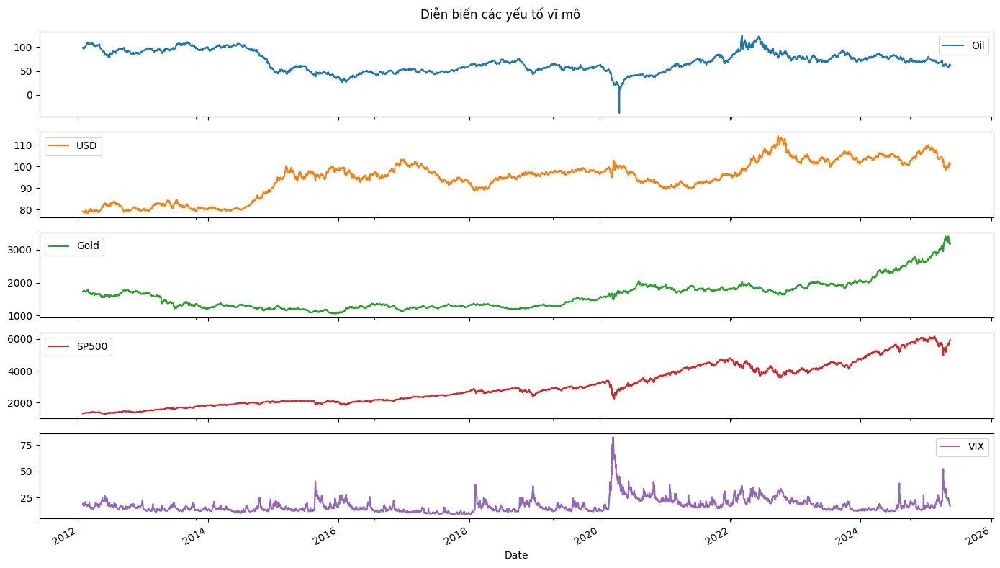

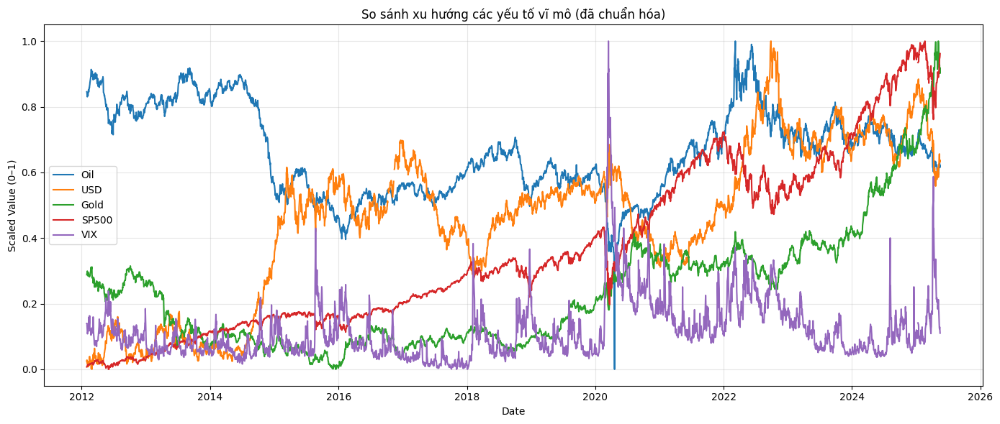

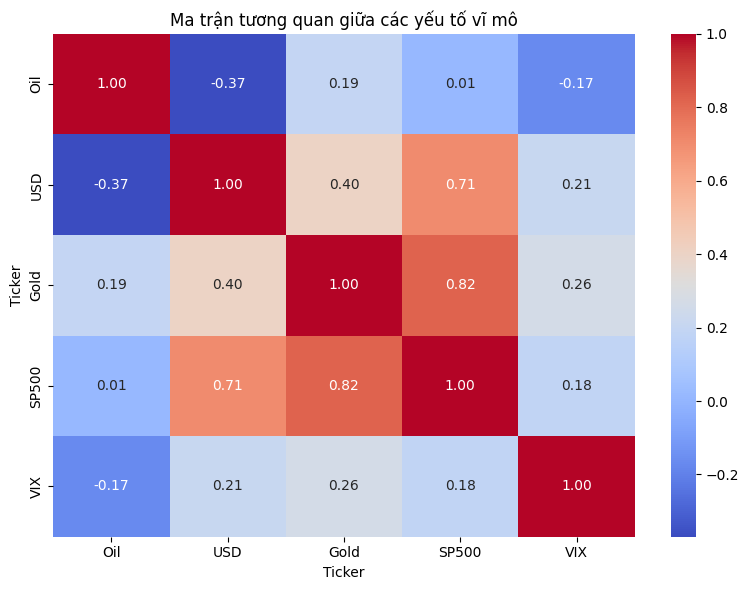

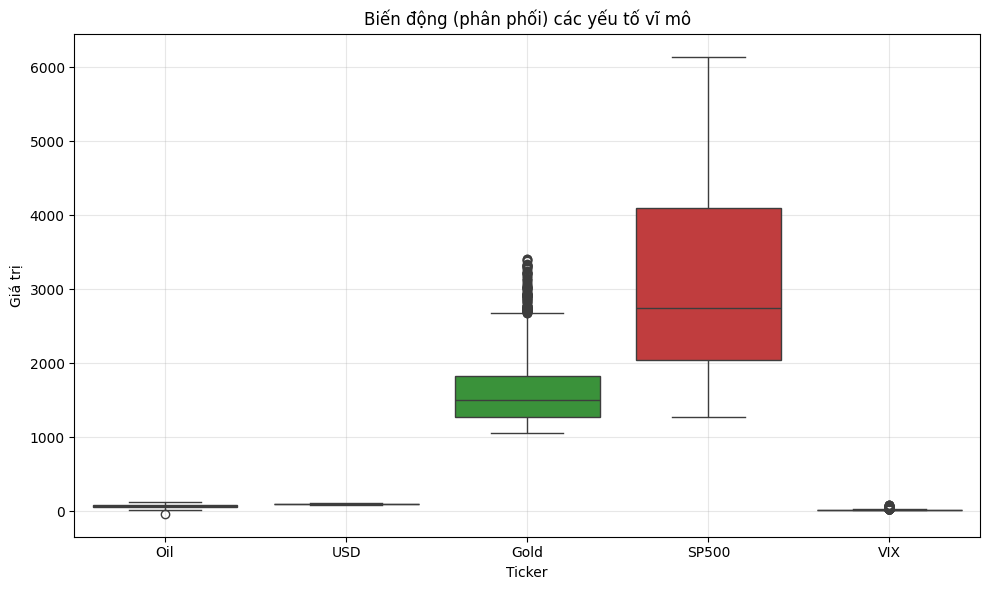

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

# ===== 1. Plot mỗi yếu tố vĩ mô riêng (subplots) =====
macro_raw.plot(figsize=(14, 8), subplots=True, title='Diễn biến các yếu tố vĩ mô')
plt.tight_layout()
plt.show()

# ===== 2. Plot tất cả yếu tố macro đã chuẩn hóa trên cùng 1 biểu đồ =====
scaled_macro = pd.DataFrame(MinMaxScaler().fit_transform(macro_raw),
                            index=macro_raw.index,
                            columns=macro_raw.columns)

plt.figure(figsize=(14, 6))
for col in scaled_macro.columns:
    plt.plot(scaled_macro.index, scaled_macro[col], label=col)

plt.title("So sánh xu hướng các yếu tố vĩ mô (đã chuẩn hóa)")
plt.xlabel("Date")
plt.ylabel("Scaled Value (0–1)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ===== 3. Ma trận tương quan =====
plt.figure(figsize=(8, 6))
sns.heatmap(macro_raw.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Ma trận tương quan giữa các yếu tố vĩ mô")
plt.tight_layout()
plt.show()

# ===== 4. Boxplot độ biến động =====
plt.figure(figsize=(10, 6))
sns.boxplot(data=macro_raw)
plt.title("Biến động (phân phối) các yếu tố vĩ mô")
plt.ylabel("Giá trị")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ===== 1. Chọn dữ liệu cần phân tích tương quan =====
corr_data = df[['Close', 'Oil', 'Gold', 'USD', 'SP500', 'VIX']]

# ===== 2. Tính ma trận tương quan =====
correlation_matrix = corr_data.corr()

# ===== 3. In tương quan của các yếu tố macro với Close =====
print("📊 Tương quan giữa giá đóng (Close) và các yếu tố vĩ mô:")
print(correlation_matrix['Close'].sort_values(ascending=False))
print()

# ===== 4. Vẽ biểu đồ heatmap tương quan =====
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("🔗 Ma trận tương quan giữa giá cổ phiếu và yếu tố vĩ mô", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


NameError: name 'df' is not defined